## Import Libraries

In [4]:
#Import Libraries
import numpy as np
from random import sample
import pandas as pd
import matplotlib.pyplot as plt
from collections import deque
import math

## Import the Reward and Transition Matrix from the xls file

In [5]:
#Import the reward table and the transition matrix
r_table = pd.read_excel('environment_matrices.xlsx', sheet_name ='rewards', index_col=0)
state_value_function = pd.read_excel('environment_matrices.xlsx', sheet_name ='State value function')
transition_matrix = pd.read_excel('environment_matrices.xlsx', sheet_name ='transition',index_col=0)

## Initialize important parameters and Q matrix

In [6]:
#Initialize parameters
total_episodes = 10000 #Total episodes
number_of_steps = 100 #Maximum steps per episode
epsilon = 1 #Highest exploration probability
epsilon_min = 0.1 # Lowest exploration probability 
decay_rate = 0.996 #Exponential decay rate for exploration probability

#Q Learning parameters
alpha = 0.15 #Learning rate
gamma = 0.999 #Discount rate

#Initialization of the Q matrix
q_table = pd.DataFrame(np.matrix(np.zeros([16,4])).astype("float32"), columns = transition_matrix.columns, index = transition_matrix.index)
q_table.head()

,UP,DOWN,RIGHT,LEFT
A,0.0,0.0,0.0,0.0
B,0.0,0.0,0.0,0.0
C,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0
E,0.0,0.0,0.0,0.0


In [7]:
#%% Define the optimal state value table
optimal_state_value_function = np.array(state_value_function)
optimal_state_value_function

# plot_values(optimal_state_value_function)

array([[-6, -5, -4, -5],
       [-5,  0, -3,  0],
       [-4, -3, -2,  0],
       [ 0, -2, -1,  0]])

## Random Policy

In [8]:
def random_policy(state):
    exploration_threshold = np.random.uniform(0,1)
    actions_list = ["UP", "DOWN", "RIGHT", "LEFT"]

    # Explore: We take a random action from the action list
    action = sample(actions_list, 1)[0]
    return action


## 'execute_action' Function

In [9]:
# Execution of the action selected from policy.
def execute_action(state, action):
    next_state = transition_matrix.loc[state,action] #return the next state
    reward = r_table.loc[state, next_state]
    end_episode_states = ['F', 'H', 'L', 'M', 'P']
    done = False #done is a flag to determine if my algorithm is going to terminate or not
    if (next_state in end_episode_states):
        done = True
    print('Current state', state)
    print('Next state', next_state)
    print ('Done', done)
    
    
    return next_state, reward, done

## 'update_Q' Function

In [10]:
#Update Q

def update_Q(current_state, next_state, action, reward, alpha, gamma):
    q_old = q_table.loc[current_state, action] #OLD Q value
    q_new = q_old + alpha * (reward + gamma * max(q_table.loc[next_state,:] - q_old))
    q_table.loc[current_state, action] = q_new
    
    print('Old Q value:       ', q_old)
    print('Updated Q value (Q new): ', q_new)

## Train the agent

In [11]:
#Training the agent
sum_reward = 0
episodes_rewards_list_per_10 = []


#Main
episodes_rewards_list = []
window = 100
# initialize average rewards
average_reward = deque(maxlen=total_episodes)
# initialize best average reward as negative infinity
best_average_reward = -math.inf
# initialize monitor for most recent rewards
check_rewards = deque(maxlen=window)

#EPISODES
for episode in range(1, total_episodes + 1):
    current_state = 'A'
    episode_reward = 0
    # Decide the value of epsilon before the start of the episode
    for step in range (number_of_steps):
        #Choose action depending on the value of epsilon
        action = random_policy(current_state)
        
        #Execute Action and calculate the next state, the reward and check if the episode is finished
        next_state, reward, done = execute_action(current_state, action)
        
        # Update the Q Matrix based on the new values
        update_Q(current_state, next_state, action, reward, alpha, gamma)
        current_state = next_state
        
        episode_reward += reward 
        
        if done:
            check_rewards.append(episode_reward)
            break

    if episode >= 100:
        average_reward = np.mean(check_rewards)
        if average_reward > best_average_reward:
            best_average_reward = average_reward
    print("\rEpisode {}/{} || Best average reward {}".format(episode, total_episodes, best_average_reward), end="")

    if best_average_reward > 83:
        print('\nThe environment is solved in {} episodes.'.format(episode-1), end = "")
        break
    
    episodes_rewards_list.append(episode_reward)
    print("\rEpsilon for this episode is: {}".format(epsilon))
    print("\rThe reward for this episode is: {}".format(episode_reward))
    
    episode_reward = 0


Current state A
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state B
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state B
Next state F
Done True
Old Q value:        -15.0
Updated Q value (Q new):  -27.75225
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Cu

Old Q value:        -47.810326
Updated Q value (Q new):  -55.645948328018186
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        -1.4606892
Updated Q value (Q new):  -1.5022760683894156
Current state E
Next state E
Done False
Old Q value:        -0.7372116
Updated Q value (Q new):  -0.8872115850448609
Current state E
Next state E
Done False
Old Q value:        -0.88721156
Updated Q value (Q new):  -1.0372115612030028
Current state E
Next state F
Done True
Old Q value:        -55.645947
Updated Q value (Q new):  -62.30740141925812
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        -1.5702056
Updated Q value (Q new):  -1.6452902691543103
Current state A
Next state E
Done False
Old Q value:        -1.5022761
Updated Q value (Q new):  -1.5615678194254636
Current state E
Next state A
Done False
Old Q value:        -0.99882483
Updated Q 

Old Q value:        0.0
Updated Q value (Q new):  2.09775
Current state O
Next state P
Done True
Old Q value:        15.0
Updated Q value (Q new):  27.75225
Epsilon for this episode is: 1
The reward for this episode is: 84.0
Current state A
Next state E
Done False
Old Q value:        -1.9340433
Updated Q value (Q new):  -1.9629541321098805
Current state E
Next state A
Done False
Old Q value:        -1.7461106
Updated Q value (Q new):  -1.8583649218440055
Current state A
Next state E
Done False
Old Q value:        -1.9629542
Updated Q value (Q new):  -1.9875327127635478
Current state E
Next state A
Done False
Old Q value:        -1.8583649
Updated Q value (Q new):  -1.9537979840040207
Current state A
Next state A
Done False
Old Q value:        -2.248245
Updated Q value (Q new):  -2.2852545179903507
Current state A
Next state A
Done False
Old Q value:        -1.9909844
Updated Q value (Q new):  -2.066544452065229
Current state A
Next state B
Done False
Old Q value:        -1.4942211
Upda

Old Q value:        -2.7410147
Updated Q value (Q new):  -2.7675050748705865
Current state A
Next state A
Done False
Old Q value:        -2.7266598
Updated Q value (Q new):  -2.755301219034195
Current state A
Next state B
Done False
Old Q value:        -1.9167929
Updated Q value (Q new):  -1.9312355012774467
Current state B
Next state F
Done True
Old Q value:        -93.76346
Updated Q value (Q new):  -94.71300403289796
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        -2.185961
Updated Q value (Q new):  -2.200403568327427
Current state E
Next state E
Done False
Old Q value:        -1.8280284
Updated Q value (Q new):  -1.8961071959853173
Current state E
Next state A
Done False
Old Q value:        -2.4152212
Updated Q value (Q new):  -2.4926959627747536
Current state A
Next state A
Done False
Old Q value:        -2.7675052
Updated Q value (Q new):  -2.792190166795254
Current state A
Next state A
Done False
O

Next state B
Done False
Old Q value:        -2.0349302
Updated Q value (Q new):  -2.049309248930216
Current state B
Next state B
Done False
Old Q value:        -2.0493093
Updated Q value (Q new):  -2.0615335766136647
Current state B
Next state C
Done False
Old Q value:        -1.1298853
Updated Q value (Q new):  -1.1822157778263092
Current state C
Next state C
Done False
Old Q value:        -0.83034706
Updated Q value (Q new):  -0.9275633305609227
Current state C
Next state G
Done False
Old Q value:        -0.6797064
Updated Q value (Q new):  -0.7278523914307355
Current state G
Next state H
Done True
Old Q value:        -27.75225
Updated Q value (Q new):  -38.59357590827942
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        -2.2708907
Updated Q value (Q new):  -2.274977723610401
Current state E
Next state A
Done False
Old Q value:        -2.6915457
Updated Q value (Q new):  -2.753277324461937
Current state A

Current state A
Next state B
Done False
Old Q value:        -2.2350936
Updated Q value (Q new):  -2.259801849770546
Current state B
Next state C
Done False
Old Q value:        -1.3989792
Updated Q value (Q new):  -1.4498623561292887
Current state C
Next state C
Done False
Old Q value:        -1.2730429
Updated Q value (Q new):  -1.3427976363927125
Current state C
Next state D
Done False
Old Q value:        -0.7375389
Updated Q value (Q new):  -0.8219736756443977
Current state D
Next state D
Done False
Old Q value:        -0.6014145
Updated Q value (Q new):  -0.7062475403785705
Current state D
Next state H
Done True
Old Q value:        -27.75225
Updated Q value (Q new):  -38.59357590827942
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        -2.2598019
Updated Q value (Q new):  -2.288432429999113
Current state B
Next state F
Done True
Old Q value:        -99.19686
Updated Q value (Q new):  -99.33221160621643
Ep

Done False
Old Q value:        -2.3269086
Updated Q value (Q new):  -2.3611529232144357
Current state E
Next state I
Done False
Old Q value:        -1.5544317
Updated Q value (Q new):  -1.577501482781768
Current state I
Next state J
Done False
Old Q value:        -0.70738333
Updated Q value (Q new):  -0.7929686892151833
Current state J
Next state I
Done False
Old Q value:        -0.41760463
Updated Q value (Q new):  -0.6238529303908348
Current state I
Next state I
Done False
Old Q value:        -0.91526604
Updated Q value (Q new):  -1.046939779600501
Current state I
Next state E
Done False
Old Q value:        -1.9178648
Updated Q value (Q new):  -2.016861364376545
Current state E
Next state E
Done False
Old Q value:        -2.361153
Updated Q value (Q new):  -2.393722732257843
Current state E
Next state F
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state 

Old Q value:        -0.1864811
Updated Q value (Q new):  -0.17767239124178888
Current state G
Next state K
Done False
Old Q value:        0.8733035
Updated Q value (Q new):  1.687578139400482
Current state K
Next state J
Done False
Old Q value:        -0.54616684
Updated Q value (Q new):  -0.5218609032392502
Current state J
Next state I
Done False
Old Q value:        -0.6238529
Updated Q value (Q new):  -0.7991949085116387
Current state I
Next state M
Done True
Old Q value:        -94.713005
Updated Q value (Q new):  -95.52026125679016
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state A
Done False
Old Q value:        -3.531334
Updated Q value (Q new):  -3.542367875409126
Current state A
Next state B
Done False
Old Q value:        -2.7890887
Updated Q value (Q new):  -2.800779322952032
Current state B
Next state A
Done False
Old Q value:        -3.336084
Updated Q value (Q new):  -3.3763760587215423
Current state A
Next state A
Done False
O

Old Q value:        -2.6757584
Updated Q value (Q new):  -2.6813754896759985
Current state E
Next state E
Done False
Old Q value:        -2.586644
Updated Q value (Q new):  -2.6056148590803145
Current state E
Next state E
Done False
Old Q value:        -2.605615
Updated Q value (Q new):  -2.62174302611351
Current state E
Next state I
Done False
Old Q value:        -1.7122424
Updated Q value (Q new):  -1.724489204761386
Current state I
Next state I
Done False
Old Q value:        -1.1588821
Updated Q value (Q new):  -1.2540500105232
Current state I
Next state J
Done False
Old Q value:        -0.7929687
Updated Q value (Q new):  -0.731679498720169
Current state J
Next state F
Done True
Old Q value:        -27.75225
Updated Q value (Q new):  -38.59357590827942
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        -2.943129
Updated Q value (Q new):  -2.9449251316964626
Current state B
Next state A
Done False
Old Q v

Old Q value:        0.10348734
Updated Q value (Q new):  0.25232758962512014
Current state N
Next state N
Done False
Old Q value:        0.036825337
Updated Q value (Q new):  0.19565487734079362
Current state N
Next state M
Done True
Old Q value:        -38.593575
Updated Q value (Q new):  -47.810327381515506
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        -2.7203436
Updated Q value (Q new):  -2.7204180449903013
Current state E
Next state A
Done False
Old Q value:        -3.651432
Updated Q value (Q new):  -3.6619195803165434
Current state A
Next state E
Done False
Old Q value:        -2.720418
Updated Q value (Q new):  -2.7204812847554685
Current state E
Next state A
Done False
Old Q value:        -3.6619196
Updated Q value (Q new):  -3.6708450798273087
Current state A
Next state A
Done False
Old Q value:        -3.7075045
Updated Q value (Q new):  -3.7095990970730783
Current state A
Next state A
Done Fa

Current state A
Next state B
Done False
Old Q value:        -2.6310494
Updated Q value (Q new):  -2.6108340441167353
Current state B
Next state F
Done True
Old Q value:        -100.09195
Updated Q value (Q new):  -100.09317083587646
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        -3.6915767
Updated Q value (Q new):  -3.6796274410367014
Current state A
Next state A
Done False
Old Q value:        -3.6795228
Updated Q value (Q new):  -3.6693797613978387
Current state A
Next state A
Done False
Old Q value:        -3.6796274
Updated Q value (Q new):  -3.6694687429904937
Current state A
Next state A
Done False
Old Q value:        -3.6694686
Updated Q value (Q new):  -3.6608322585225106
Current state A
Next state B
Done False
Old Q value:        -2.6108341
Updated Q value (Q new):  -2.593648029857874
Current state B
Next state F
Done True
Old Q value:        -100.09317
Updated Q value (Q new):  -100.094208616638

Old Q value:        -2.637221
Updated Q value (Q new):  -2.6320079714536666
Current state E
Next state A
Done False
Old Q value:        -3.5351462
Updated Q value (Q new):  -3.49970851200819
Current state A
Next state A
Done False
Old Q value:        -3.445199
Updated Q value (Q new):  -3.42323987981081
Current state A
Next state B
Done False
Old Q value:        -2.2976573
Updated Q value (Q new):  -2.2463675892710686
Current state B
Next state F
Done True
Old Q value:        -100.09873
Updated Q value (Q new):  -100.09893700523376
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        -3.4633715
Updated Q value (Q new):  -3.4310034924983976
Current state A
Next state E
Done False
Old Q value:        -2.632008
Updated Q value (Q new):  -2.6275761206030848
Current state E
Next state I
Done False
Old Q value:        -1.6014311
Updated Q value (Q new):  -1.5770653188943864
Current state I
Next state I
Done False
Ol

Next state F
Done True
Old Q value:        -100.09959
Updated Q value (Q new):  -100.09966345176697
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        -3.0075643
Updated Q value (Q new):  -2.9717121305048466
Current state A
Next state A
Done False
Old Q value:        -2.9607155
Updated Q value (Q new):  -2.931883645325899
Current state A
Next state B
Done False
Old Q value:        -1.7673095
Updated Q value (Q new):  -1.7420795330166816
Current state B
Next state A
Done False
Old Q value:        -3.3413916
Updated Q value (Q new):  -3.251734650170803
Current state A
Next state A
Done False
Old Q value:        -2.9318836
Updated Q value (Q new):  -2.903591432571411
Current state A
Next state E
Done False
Old Q value:        -2.411378
Updated Q value (Q new):  -2.401172893321514
Current state E
Next state F
Done True
Old Q value:        -100.09648
Updated Q value (Q new):  -100.09702359695434
Epsilon for this 

Old Q value:        0.6871625
Updated Q value (Q new):  1.3328312832593916
Current state J
Next state F
Done True
Old Q value:        -67.970634
Updated Q value (Q new):  -72.78523488655091
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        -1.2444245
Updated Q value (Q new):  -1.1562948257625103
Current state B
Next state B
Done False
Old Q value:        -1.6035535
Updated Q value (Q new):  -1.461608405673504
Current state B
Next state A
Done False
Old Q value:        -2.8786557
Updated Q value (Q new):  -2.7705598987936972
Current state A
Next state B
Done False
Old Q value:        -1.1562948
Updated Q value (Q new):  -1.0813714126348495
Current state B
Next state C
Done False
Old Q value:        0.34469554
Updated Q value (Q new):  0.48842312312126157
Current state C
Next state B
Done False
Old Q value:        -1.871267
Updated Q value (Q new):  -1.6676673862218856
Current state B
Next state B
Done False


Done False
Old Q value:        0.6106131
Updated Q value (Q new):  0.7754310693740845
Current state C
Next state B
Done False
Old Q value:        -1.4762671
Updated Q value (Q new):  -1.288850115787983
Current state B
Next state C
Done False
Old Q value:        0.7754311
Updated Q value (Q new):  0.9155510736823081
Current state C
Next state G
Done False
Old Q value:        2.7115004
Updated Q value (Q new):  3.057222976100445
Current state G
Next state C
Done False
Old Q value:        -0.64129585
Updated Q value (Q new):  -0.237072779405117
Current state C
Next state C
Done False
Old Q value:        -0.6638853
Updated Q value (Q new):  -0.2562771961688996
Current state C
Next state C
Done False
Old Q value:        -0.2562772
Updated Q value (Q new):  0.09025083203315737
Current state C
Next state C
Done False
Old Q value:        0.090250835
Updated Q value (Q new):  0.3848516416311264
Current state C
Next state C
Done False
Old Q value:        0.38485163
Updated Q value (Q new):  0.63

Old Q value:        1.6429595
Updated Q value (Q new):  1.8452685902833939
Current state C
Next state B
Done False
Old Q value:        -0.8462113
Updated Q value (Q new):  -0.5928930479884147
Current state B
Next state F
Done True
Old Q value:        -100.1
Updated Q value (Q new):  -100.10001370277405
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        -1.140827
Updated Q value (Q new):  -1.073804186719656
Current state A
Next state B
Done False
Old Q value:        0.30743968
Updated Q value (Q new):  0.38788334887027737
Current state B
Next state C
Done False
Old Q value:        1.8452686
Updated Q value (Q new):  2.0172616985321046
Current state C
Next state G
Done False
Old Q value:        3.9940379
Updated Q value (Q new):  4.32235894626379
Current state G
Next state F
Done True
Old Q value:        -47.810326
Updated Q value (Q new):  -55.645948328018186
Epsilon for this episode is: 1
The reward for this

Updated Q value (Q new):  -1.2654112507641315
Current state D
Next state D
Done False
Old Q value:        -1.2061069
Updated Q value (Q new):  -1.1425390220344067
Current state D
Next state D
Done False
Old Q value:        -1.1686001
Updated Q value (Q new):  -1.110652600055933
Current state D
Next state D
Done False
Old Q value:        -1.142539
Updated Q value (Q new):  -1.0884967915594577
Current state D
Next state H
Done True
Old Q value:        -91.332756
Updated Q value (Q new):  -92.64654254951478
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        1.3396195
Updated Q value (Q new):  1.4251039964735508
Current state B
Next state B
Done False
Old Q value:        0.2916338
Updated Q value (Q new):  0.5341589468121528
Current state B
Next state F
Done True
Old Q value:        -100.10003
Updated Q value (Q new):  -100.10003964729309
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Curr

Current state O
Next state K
Done False
Old Q value:        0.94513917
Updated Q value (Q new):  3.6117348470687864
Current state K
Next state G
Done False
Old Q value:        1.2629749
Updated Q value (Q new):  2.1893402045726775
Current state G
Next state F
Done True
Old Q value:        -62.3074
Updated Q value (Q new):  -67.97063589725494
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        -0.076075576
Updated Q value (Q new):  -0.021118463683128343
Current state E
Next state I
Done False
Old Q value:        1.291673
Updated Q value (Q new):  1.4080747154951097
Current state I
Next state J
Done False
Old Q value:        3.0694625
Updated Q value (Q new):  3.6824681565761566
Current state J
Next state K
Done False
Old Q value:        8.161259
Updated Q value (Q new):  9.746518827915192
Current state K
Next state O
Done False
Old Q value:        19.74124
Updated Q value (Q new):  22.416261943912506
Current s

Next state C
Done False
Old Q value:        4.1660647
Updated Q value (Q new):  4.2415161232471466
Current state C
Next state G
Done False
Old Q value:        5.6705785
Updated Q value (Q new):  6.227691098666191
Current state G
Next state C
Done False
Old Q value:        1.0652505
Updated Q value (Q new):  1.688842266345024
Current state C
Next state B
Done False
Old Q value:        1.6869506
Updated Q value (Q new):  1.9197521940231324
Current state B
Next state B
Done False
Old Q value:        1.8001682
Updated Q value (Q new):  2.016004165792465
Current state B
Next state B
Done False
Old Q value:        2.016004
Updated Q value (Q new):  2.199497062897682
Current state B
Next state C
Done False
Old Q value:        4.241516
Updated Q value (Q new):  4.3891444460630415
Current state C
Next state D
Done False
Old Q value:        -0.5943115
Updated Q value (Q new):  -0.3875502736091614
Current state D
Next state C
Done False
Old Q value:        1.7864772
Updated Q value (Q new):  2.30

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        2.3239505
Updated Q value (Q new):  2.469337455570698
Current state E
Next state I
Done False
Old Q value:        4.295168
Updated Q value (Q new):  4.641175344371796
Current state I
Next state I
Done False
Old Q value:        1.8641542
Updated Q value (Q new):  2.574449026608467
Current state I
Next state E
Done False
Old Q value:        -0.18159042
Updated Q value (Q new):  0.3911010362148284
Current state E
Next state E
Done False
Old Q value:        0.9759367
Updated Q value (Q new):  1.3751727178692819
Current state E
Next state I
Done False
Old Q value:        4.6411753
Updated Q value (Q new):  4.935333490514755
Current state I
Next state J
Done False
Old Q value:        7.605194
Updated Q value (Q new):  8.038093494272232
Current state J
Next state N
Done False
Old Q value:

Next state D
Done False
Old Q value:        0.07309741
Updated Q value (Q new):  0.3786044246315956
Current state D
Next state H
Done True
Old Q value:        -94.713005
Updated Q value (Q new):  -95.52026125679016
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        2.775393
Updated Q value (Q new):  2.947762663412094
Current state A
Next state A
Done False
Old Q value:        2.614019
Updated Q value (Q new):  2.8105704790115356
Current state A
Next state A
Done False
Old Q value:        2.9477627
Updated Q value (Q new):  3.094302779638767
Current state A
Next state E
Done False
Old Q value:        4.9266753
Updated Q value (Q new):  5.063920307445526
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        3.6990902
Upd

Current state E
Next state A
Done False
Old Q value:        3.2412138
Updated Q value (Q new):  3.556148283815384
Current state A
Next state E
Done False
Old Q value:        6.3438797
Updated Q value (Q new):  6.448137640333176
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        4.1721425
Updated Q value (Q new):  4.363200394535065
Current state A
Next state B
Done False
Old Q value:        4.180842
Updated Q value (Q new):  4.256566547060013
Current state B
Next state A
Done False
Old Q value:        3.3425748
Updated Q value (Q new):  3.6579434391856194
Current state A
Next state A
Done False
Old Q value:        4.3632
Updated Q value (Q new):  4.525628082919121
Current state A
Next state E
Done False
Old Q value:        6.4481378
Updated Q value (Q new):  6.536772630429268
Current state E
Ne

Current state A
Next state E
Done False
Old Q value:        7.416475
Updated Q value (Q new):  7.480185088372231
Current state E
Next state E
Done False
Old Q value:        5.804164
Updated Q value (Q new):  6.109478988313675
Current state E
Next state E
Done False
Old Q value:        6.109479
Updated Q value (Q new):  6.369042550611496
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        5.204588
Updated Q value (Q new):  5.395586161160469
Current state A
Next state A
Done False
Old Q value:        5.654073
Updated Q value (Q new):  5.777716090631485
Current state A
Next state A
Done False
Old Q value:        5.395586
Updated Q value (Q new):  5.557963176655769
Current state A
Next state B
Done False
Old Q value:        5.24527
Updated Q value (Q new):  5.316394688248634
Current state B
Next st

Old Q value:        7.2975826
Updated Q value (Q new):  7.408739455318451
Current state E
Next state A
Done False
Old Q value:        5.336337
Updated Q value (Q new):  5.57073607442379
Current state A
Next state E
Done False
Old Q value:        7.901562
Updated Q value (Q new):  7.922212701678276
Current state E
Next state E
Done False
Old Q value:        7.4087396
Updated Q value (Q new):  7.5032395282506945
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        6.5896287
Updated Q value (Q new):  6.639316394495964
Current state A
Next state A
Done False
Old Q value:        6.6393166
Updated Q value (Q new):  6.6815585307121275
Current state A
Next state B
Done False
Old Q value:        6.666442
Updated Q value (Q new):  6.746427632427215
Current state B
Next state A
Done False
Old Q value:     

Current state A
Next state A
Done False
Old Q value:        7.749366
Updated Q value (Q new):  7.8375324384689335
Current state A
Next state B
Done False
Old Q value:        7.3233724
Updated Q value (Q new):  7.33663307416439
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        9.338733
Updated Q value (Q new):  9.497554829025269
Current state E
Next state I
Done False
Old Q value:        11.399608
Updated Q value (Q new):  11.620415440225601
Current state I
Next state J
Done False
Old Q value:        13.874134
Updated Q value (Q new):  14.415693494319916
Current state J
Next state N
Done False
Old Q value:        6.04134
Updated Q value (Q new):  7.558055851173401
Current state N
Next state O
Done False
Old Q value:        17.163902
Updated Q value (Q new):  21.60626882019043
Current state O
N

Updated Q value (Q new):  9.214900831222534
Current state A
Next state A
Done False
Old Q value:        9.099685
Updated Q value (Q new):  9.238687901353837
Current state A
Next state E
Done False
Old Q value:        11.028301
Updated Q value (Q new):  11.081031664800644
Current state E
Next state E
Done False
Old Q value:        10.587592
Updated Q value (Q new):  10.706362811470031
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        9.214901
Updated Q value (Q new):  9.34454067516327
Current state A
Next state B
Done False
Old Q value:        7.9073944
Updated Q value (Q new):  8.079478961753845
Current state B
Next state B
Done False
Old Q value:        6.7573824
Updated Q value (Q new):  7.101796246099472
Current state B
Next state A
Done False
Old Q value:        7.7175784
Updated Q value 

Old Q value:        10.353325
Updated Q value (Q new):  10.40195985569954
Current state A
Next state A
Done False
Old Q value:        10.3809395
Updated Q value (Q new):  10.425436402368545
Current state A
Next state E
Done False
Old Q value:        11.678884
Updated Q value (Q new):  11.712450288438797
Current state E
Next state A
Done False
Old Q value:        9.501594
Updated Q value (Q new):  9.682890426969529
Current state A
Next state E
Done False
Old Q value:        11.71245
Updated Q value (Q new):  11.740986827087402
Current state E
Next state A
Done False
Old Q value:        9.682891
Updated Q value (Q new):  9.841296567440033
Current state A
Next state E
Done False
Old Q value:        11.740987
Updated Q value (Q new):  11.765247384691238
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value: 

Current state C
Next state C
Done False
Old Q value:        10.643982
Updated Q value (Q new):  11.175585814571381
Current state C
Next state C
Done False
Old Q value:        11.175586
Updated Q value (Q new):  11.627528796339035
Current state C
Next state B
Done False
Old Q value:        8.191938
Updated Q value (Q new):  8.701370947551727
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        12.325677
Updated Q value (Q new):  12.40355102300644
Current state E
Next state E
Done False
Old Q value:        11.475317
Updated Q value (Q new):  11.680617539834977
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        20.505165
Updated Q value (Q new):  21.518348686885833
Current state K
Next state J
Done False
Old Q value:        6.769107
Updated Q value (Q new):  8.740010638284684
Current state J
Next state K
Done False
Old Q value:        20.922619
Updated Q value (Q new):  21.873247005939483
Current state K
Next state L
Done True
Old Q value:        -76.878365
Updated Q value (Q new):  -80.35814163322449
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        12.939232
Updated Q value (Q new):  13.013406658554077
Current state E
Next state I
Done False
Old Q value:        14.435226
Updated Q value (Q new):  14.61799365901947
Current state I
Next state J
Done False
Old Q value:        16.655895
Updated Q value (Q new):  17.2877154173851
Current state J
Next state K
Done False
Old Q value:        21.873247
Updated Q value (Q new):  22.68142363872528
Current state K
Next state L
Done True
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -125.0
Current state A
Next state E
Done False
Old Q value:        13.705449
Updated Q value (Q new):  13.788603663444519
Current state E
Next state I
Done False
Old Q value:        15.261369
Updated Q value (Q new):  15.415016873502731
Current state I
Next state I
Done False
Old Q value:        12.357916
Updated Q value (Q new):  12.946646413326263
Current state I
Next state I
Done False
Old Q value:        12.946647
Updated Q value (Q new):  13.447155913209915
Current state I
Next state M
Done True
Old Q value:        -100.08882
Updated Q value (Q new):  -100.09051152267456
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        12.296266
Updated Q value (Q new):  12.369892478466033
Current state A
Next state E
Done False
Old Q value:        13.788604
Updated Q value (Q ne

Old Q value:        13.2999935
Updated Q value (Q new):  13.488762873649597
Current state A
Next state E
Done False
Old Q value:        14.387257
Updated Q value (Q new):  14.427481303501128
Current state E
Next state E
Done False
Old Q value:        13.920966
Updated Q value (Q new):  14.03106445708275
Current state E
Next state I
Done False
Old Q value:        15.656691
Updated Q value (Q new):  15.751099740886689
Current state I
Next state M
Done True
Old Q value:        -100.09317
Updated Q value (Q new):  -100.09420861663818
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        15.560717
Updated Q value (Q new):  15.645479761695862
Current state B
Next state B
Done False
Old Q value:        14.42727
Updated Q value (Q new):  14.6818800552845
Current state B
Next state A
Done False
Old Q value:        13.248739
Updated Q value (Q new):  13.45789086842537
Current state A
Next state B
Done False
Old Q value: 

Old Q value:        16.218378
Updated Q value (Q new):  16.261729291534422
Current state B
Next state A
Done False
Old Q value:        14.217841
Updated Q value (Q new):  14.374117921876907
Current state A
Next state E
Done False
Old Q value:        14.856938
Updated Q value (Q new):  14.879263661336898
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        14.74015
Updated Q value (Q new):  14.818159176063537
Current state A
Next state A
Done False
Old Q value:        14.818159
Updated Q value (Q new):  14.884478231334686
Current state A
Next state E
Done False
Old Q value:        14.879264
Updated Q value (Q new):  14.89824369854927
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for th

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        16.725107
Updated Q value (Q new):  16.729874946403502
Current state B
Next state C
Done False
Old Q value:        17.757925
Updated Q value (Q new):  17.867740812969206
Current state C
Next state D
Done False
Old Q value:        11.314289
Updated Q value (Q new):  11.549704368829728
Current state D
Next state D
Done False
Old Q value:        9.64657
Updated Q value (Q new):  10.13189315676689
Current state D
Next state H
Done True
Old Q value:        -99.545105
Updated Q value (Q new):  -99.62827099914551
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        15.575643
Updated Q value (Q new):  15.598604397630691
Current state A
Next state E
Done False
Old Q value:        15.083444
Updated Q value (Q new): 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        15.862804
Updated Q value (Q new):  15.90615678062439
Current state A
Next state A
Done False
Old Q value:        15.815316
Updated Q value (Q new):  15.86578467669487
Current state A
Next state B
Done False
Old Q value:        17.15311
Updated Q value (Q new):  17.2044051322937
Current state B
Next state A
Done False
Old Q value:        15.670907
Updated Q value (Q new):  15.750701667451859
Current state A
Next state A
Done False
Old Q value:        15.865785
Updated Q value (Q new):  15.916376879930496
Current state A
Next state A
Done False
Old Q value:        15.916377
Updated Q value (Q new):  15.959388027906417
Current state A
Next state E
Done False
Old Q value:        15.172836
Updated Q value (Q new):  15.178310308933257
Current state E
Next state F
Done True
Old Q value: 

Old Q value:        16.863306
Updated Q value (Q new):  17.32960349884033
Current state C
Next state B
Done False
Old Q value:        15.537138
Updated Q value (Q new):  15.917487365436553
Current state B
Next state B
Done False
Old Q value:        17.250454
Updated Q value (Q new):  17.374062932014464
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        16.48688
Updated Q value (Q new):  16.520692315292358
Current state A
Next state B
Done False
Old Q value:        17.713526
Updated Q value (Q new):  17.767743442440032
Current state B
Next state C
Done False
Old Q value:        19.07634
Updated Q value (Q new):  19.211014078617097
Current state C
Next state B
Done False
Old Q value:        15.917487
Updated Q value (Q new):  16.261022112894057
Current state B
Next state C
Done False
Old Q value

Old Q value:        17.206787
Updated Q value (Q new):  17.23997813987732
Current state A
Next state E
Done False
Old Q value:        15.969901
Updated Q value (Q new):  16.02637598862648
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        16.95099
Updated Q value (Q new):  17.022512802791596
Current state A
Next state E
Done False
Old Q value:        16.026377
Updated Q value (Q new):  16.074388753414155
Current state E
Next state I
Done False
Old Q value:        17.347778
Updated Q value (Q new):  17.542868504047394
Current state I
Next state J
Done False
Old Q value:        19.650682
Updated Q value (Q new):  20.207717111873627
Current state J
Next state F
Done True
Old Q value:        -96.20655
Updated Q value (Q new):  -96.78999899101257
Epsilon for this episode is: 1
The reward for this e

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        17.507046
Updated Q value (Q new):  17.581260831928255
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        17.642147
Updated Q value (Q new):  17.66960833749771
Current state A
Next state A
Done False
Old Q value:        17.66961
Updated Q value (Q new):  17.692955161571504
Current state A
Next state B
Done False
Old Q value:        18.826406
Updated Q value (Q new):  18.83629920244217
Current state B
Next state C
Done False
Old Q value:        19.893425
Updated Q value (Q new):  19.952809643268584
Current state C
Next state D
Done False
Old Q value:        14.330879
Updated Q value (Q new)

Old Q value:        -100.09926
Updated Q value (Q new):  -100.09938454818726
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        17.85173
Updated Q value (Q new):  17.868539250469208
Current state A
Next state B
Done False
Old Q value:        18.964903
Updated Q value (Q new):  18.982405743312835
Current state B
Next state B
Done False
Old Q value:        18.541704
Updated Q value (Q new):  18.62262336854935
Current state B
Next state A
Done False
Old Q value:        17.195288
Updated Q value (Q new):  17.313087473392486
Current state A
Next state A
Done False
Old Q value:        17.89224
Updated Q value (Q new):  17.905601913166045
Current state A
Next state A
Done False
Old Q value:        17.905602
Updated Q value (Q new):  17.916960747909545
Current state A
Next state B
Done False
Old Q value:        18.982407
Updated Q value (Q new):  18.997286546516417
Current state B
Next state A
Done False
Old Q value

Updated Q value (Q new):  18.864244941329957
Current state B
Next state A
Done False
Old Q value:        17.585138
Updated Q value (Q new):  17.66171710691452
Current state A
Next state B
Done False
Old Q value:        19.097176
Updated Q value (Q new):  19.110910834598542
Current state B
Next state A
Done False
Old Q value:        17.661716
Updated Q value (Q new):  17.728878175258636
Current state A
Next state E
Done False
Old Q value:        18.884556
Updated Q value (Q new):  18.929781709575654
Current state E
Next state A
Done False
Old Q value:        17.893963
Updated Q value (Q new):  17.92632245130539
Current state A
Next state E
Done False
Old Q value:        18.929781
Updated Q value (Q new):  18.96822986526489
Current state E
Next state E
Done False
Old Q value:        18.465624
Updated Q value (Q new):  18.57362670288086
Current state E
Next state I
Done False
Old Q value:        20.187365
Updated Q value (Q new):  20.303669528484345
Current state I
Next state E
Done False

Next state A
Done False
Old Q value:        18.026806
Updated Q value (Q new):  18.07466613845825
Current state A
Next state A
Done False
Old Q value:        18.19625
Updated Q value (Q new):  18.218719837379457
Current state A
Next state A
Done False
Old Q value:        18.21872
Updated Q value (Q new):  18.23782148952484
Current state A
Next state E
Done False
Old Q value:        19.327547
Updated Q value (Q new):  19.378629340076447
Current state E
Next state I
Done False
Old Q value:        20.669437
Updated Q value (Q new):  20.80714684753418
Current state I
Next state M
Done True
Old Q value:        -100.09966
Updated Q value (Q new):  -100.09972831306457
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        18.237822
Updated Q value (Q new):  18.258771673583983
Current state A
Next state A
Done False
Old Q value:        18.230354
Updated Q value (Q new):  18.252423374080657
Current state A
Next state A
D

Old Q value:        18.708319
Updated Q value (Q new):  18.7432140627861
Current state A
Next state B
Done False
Old Q value:        19.942188
Updated Q value (Q new):  19.971096051979064
Current state B
Next state C
Done False
Old Q value:        21.1361
Updated Q value (Q new):  21.195550304794313
Current state C
Next state C
Done False
Old Q value:        20.352486
Updated Q value (Q new):  20.529359917068483
Current state C
Next state G
Done False
Old Q value:        22.533829
Updated Q value (Q new):  22.758498322677614
Current state G
Next state K
Done False
Old Q value:        25.034126
Updated Q value (Q new):  26.314917568969726
Current state K
Next state G
Done False
Old Q value:        12.769554
Updated Q value (Q new):  14.649326990509033
Current state G
Next state C
Done False
Old Q value:        14.988841
Updated Q value (Q new):  16.00312432141304
Current state C
Next state D
Done False
Old Q value:        15.6070385
Updated Q value (Q new):  15.791213361263274
Current s

Old Q value:        20.722492
Updated Q value (Q new):  20.83384854669571
Current state B
Next state A
Done False
Old Q value:        18.726515
Updated Q value (Q new):  18.89229883670807
Current state A
Next state E
Done False
Old Q value:        20.272718
Updated Q value (Q new):  20.2997709856987
Current state E
Next state E
Done False
Old Q value:        19.637508
Updated Q value (Q new):  19.759747172546387
Current state E
Next state A
Done False
Old Q value:        18.820566
Updated Q value (Q new):  18.97225660133362
Current state A
Next state A
Done False
Old Q value:        19.12445
Updated Q value (Q new):  19.2306040143013
Current state A
Next state B
Done False
Old Q value:        20.833849
Updated Q value (Q new):  20.928518475151062
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:    

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        20.08638
Updated Q value (Q new):  20.12821954755783
Current state A
Next state B
Done False
Old Q value:        21.36659
Updated Q value (Q new):  21.40994601163864
Current state B
Next state B
Done False
Old Q value:        20.553415
Updated Q value (Q new):  20.718625114154815
Current state B
Next state B
Done False
Old Q value:        20.718626
Updated Q value (Q new):  20.859079011058807
Current state B
Next state A
Done False
Old Q value:        19.494667
Updated Q value (Q new):  19.63167166957855
Current state A
Next state B
Done False
Old Q value:        21.409946
Updated Q value (Q new):  21.4468050655365
Current state B
Next state B
Done False
Old Q value:        20.85908
Updated Q value (Q new):  20.97848541688919
Current state B
Next state F
Done True
Old Q value:     

Current state A
Next state A
Done False
Old Q value:        20.60495
Updated Q value (Q new):  20.659074731254577
Current state A
Next state E
Done False
Old Q value:        20.801176
Updated Q value (Q new):  20.81839797935486
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        20.659075
Updated Q value (Q new):  20.705088957309723
Current state A
Next state A
Done False
Old Q value:        20.70509
Updated Q value (Q new):  20.7442084274292
Current state A
Next state A
Done False
Old Q value:        20.678879
Updated Q value (Q new):  20.721925328636168
Current state A
Next state B
Done False
Old Q value:        21.967144
Updated Q value (Q new):  22.00642550020218
Current state B
Next state B
Done False
Old Q value:        21.263912
Updated Q value (Q new):  21.40857297563553
Current state B

Old Q value:        22.485445
Updated Q value (Q new):  22.592659017181397
Current state I
Next state I
Done False
Old Q value:        21.79344
Updated Q value (Q new):  22.004350832557677
Current state I
Next state I
Done False
Old Q value:        22.00435
Updated Q value (Q new):  22.183656646728515
Current state I
Next state J
Done False
Old Q value:        24.201921
Updated Q value (Q new):  24.392171635341644
Current state J
Next state I
Done False
Old Q value:        17.431873
Updated Q value (Q new):  18.324874057483672
Current state I
Next state J
Done False
Old Q value:        24.392172
Updated Q value (Q new):  24.553913010120393
Current state J
Next state K
Done False
Old Q value:        26.472527
Updated Q value (Q new):  27.537773557281493
Current state K
Next state G
Done False
Old Q value:        18.382746
Updated Q value (Q new):  19.9414509765625
Current state G
Next state H
Done True
Old Q value:        -99.332214
Updated Q value (Q new):  -99.44728203430176
Epsilon f

Current state A
Next state E
Done False
Old Q value:        21.641438
Updated Q value (Q new):  21.6805440987587
Current state E
Next state E
Done False
Old Q value:        21.308279
Updated Q value (Q new):  21.397309405899048
Current state E
Next state E
Done False
Old Q value:        21.39731
Updated Q value (Q new):  21.472999297142028
Current state E
Next state I
Done False
Old Q value:        22.90341
Updated Q value (Q new):  23.04526287431717
Current state I
Next state J
Done False
Old Q value:        24.851044
Updated Q value (Q new):  25.103650106430052
Current state J
Next state N
Done False
Old Q value:        18.289803
Updated Q value (Q new):  20.695155368995668
Current state N
Next state J
Done False
Old Q value:        13.726991
Updated Q value (Q new):  15.646536447286605
Current state J
Next state N
Done False
Old Q value:        20.695156
Updated Q value (Q new):  22.74006668624878
Current state N
Next state J
Done False
Old Q value:        15.646537
Updated Q value 

Next state D
Done False
Old Q value:        18.910172
Updated Q value (Q new):  19.194849634838103
Current state D
Next state D
Done False
Old Q value:        16.755533
Updated Q value (Q new):  17.36308389225006
Current state D
Next state D
Done False
Old Q value:        17.363085
Updated Q value (Q new):  17.879593863487244
Current state D
Next state D
Done False
Old Q value:        16.910213
Updated Q value (Q new):  17.494585308551788
Current state D
Next state H
Done True
Old Q value:        -100.058784
Updated Q value (Q new):  -100.06497562980651
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        23.005892
Updated Q value (Q new):  23.08254489812851
Current state A
Next state E
Done False
Old Q value:        22.222767
Updated Q value (Q new):  22.277100302124023
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode

Old Q value:        26.185009
Updated Q value (Q new):  26.316606262493135
Current state C
Next state C
Done False
Old Q value:        26.316607
Updated Q value (Q new):  26.428483893203737
Current state C
Next state C
Done False
Old Q value:        26.428484
Updated Q value (Q new):  26.52359650001526
Current state C
Next state G
Done False
Old Q value:        28.064203
Updated Q value (Q new):  28.257376191043853
Current state G
Next state C
Done False
Old Q value:        20.58669
Updated Q value (Q new):  21.586143022155763
Current state C
Next state G
Done False
Old Q value:        28.257376
Updated Q value (Q new):  28.421601753520967
Current state G
Next state C
Done False
Old Q value:        21.586143
Updated Q value (Q new):  22.460436988162993
Current state C
Next state G
Done False
Old Q value:        28.421602
Updated Q value (Q new):  28.561218939685823
Current state G
Next state K
Done False
Old Q value:        30.354313
Updated Q value (Q new):  31.56513295021057
Current 

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        24.575022
Updated Q value (Q new):  24.629071925830843
Current state A
Next state B
Done False
Old Q value:        25.936718
Updated Q value (Q new):  25.987287499523163
Current state B
Next state C
Done False
Old Q value:        27.275187
Updated Q value (Q new):  27.476381470489503
Current state C
Next state B
Done False
Old Q value:        23.068539
Updated Q value (Q new):  23.579053884792327
Current state B
Next state B
Done False
Old Q value:        25.3648
Updated Q value (Q new):  25.53122003259659
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:  

Next state J
Done False
Old Q value:        26.824457
Updated Q value (Q new):  27.41087373571396
Current state J
Next state I
Done False
Old Q value:        23.04878
Updated Q value (Q new):  23.552440073108674
Current state I
Next state J
Done False
Old Q value:        27.410873
Updated Q value (Q new):  27.909415505981446
Current state J
Next state I
Done False
Old Q value:        23.55244
Updated Q value (Q new):  24.055333430290222
Current state I
Next state M
Done True
Old Q value:        -100.10006
Updated Q value (Q new):  -100.10006559181214
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        25.188892
Updated Q value (Q new):  25.233709826087953
Current state A
Next state A
Done False
Old Q value:        25.23371
Updated Q value (Q new):  25.27181097383499
Current state A
Next state B
Done False
Old Q value:        26.488976
Updated Q value (Q new):  26.53435975999832
Current state B
Next state B
Do

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        25.732718
Updated Q value (Q new):  25.79517412195206
Current state A
Next state B
Done False
Old Q value:        27.150513
Updated Q value (Q new):  27.223946931552888
Current state B
Next state C
Done False
Old Q value:        28.641565
Updated Q value (Q new):  28.71870716676712
Current state C
Next state B
Done False
Old Q value:        25.625969
Updated Q value (Q new):  25.939415888023376
Current state B
Next state A
Done False
Old Q value:        25.03864
Updated Q value (Q new):  25.216107540798188
Current state A
Next state B
Done False
Old Q value:        27.223948
Updated Q value (Q new):  27.297937387943268
Current state B
Next state C
Done False
Old Q value:        28.718708
Updated Q value (Q new):  28.784290046310424
Current state C
Next state C
Done False
Old Q valu

Done False
Old Q value:        27.728243
Updated Q value (Q new):  27.75798753299713
Current state B
Next state B
Done False
Old Q value:        27.323143
Updated Q value (Q new):  27.413591879558563
Current state B
Next state B
Done False
Old Q value:        27.413591
Updated Q value (Q new):  27.490486569404602
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        26.407356
Updated Q value (Q new):  26.45974842453003
Current state A
Next state E
Done False
Old Q value:        25.63554
Updated Q value (Q new):  25.716004751491546
Current state E
Next state I
Done False
Old Q value:        27.17351
Updated Q value (Q new):  27.33711655626297
Current state I
Next state E
Done False
Old Q value:        22.70971
Updated Q value (Q new):  23.253126117515563
Current state E
Next state F
Done True
Old 

Old Q value:        26.34187
Updated Q value (Q new):  26.451306998825075
Current state A
Next state A
Done False
Old Q value:        26.836731
Updated Q value (Q new):  26.872013590431212
Current state A
Next state A
Done False
Old Q value:        26.872013
Updated Q value (Q new):  26.902008697509764
Current state A
Next state A
Done False
Old Q value:        26.902008
Updated Q value (Q new):  26.927508916664124
Current state A
Next state A
Done False
Old Q value:        26.92751
Updated Q value (Q new):  26.949188805389404
Current state A
Next state A
Done False
Old Q value:        26.949188
Updated Q value (Q new):  26.967619143104553
Current state A
Next state A
Done False
Old Q value:        26.806858
Updated Q value (Q new):  26.846617149353026
Current state A
Next state A
Done False
Old Q value:        26.967619
Updated Q value (Q new):  26.983288011074066
Current state A
Next state A
Done False
Old Q value:        26.983288
Updated Q value (Q new):  26.99660890007019
Current 

Done False
Old Q value:        37.443623
Updated Q value (Q new):  40.12801889896393
Current state N
Next state O
Done False
Old Q value:        56.358513
Updated Q value (Q new):  59.80485685844421
Current state O
Next state K
Done False
Old Q value:        32.557514
Updated Q value (Q new):  36.45747076206207
Current state K
Next state O
Done False
Old Q value:        59.58425
Updated Q value (Q new):  62.54721846580505
Current state O
Next state O
Done False
Old Q value:        45.97146
Updated Q value (Q new):  50.97430252342224
Current state O
Next state O
Done False
Old Q value:        50.974304
Updated Q value (Q new):  55.227471849823
Current state O
Next state K
Done False
Old Q value:        36.45747
Updated Q value (Q new):  40.21701873531342
Current state K
Next state G
Done False
Old Q value:        28.058146
Updated Q value (Q new):  29.61992871141434
Current state G
Next state H
Done True
Old Q value:        -99.75909
Updated Q value (Q new):  -99.81018748054504
Epsilon 

Old Q value:        29.418818
Updated Q value (Q new):  29.45222176952362
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        28.805958
Updated Q value (Q new):  28.882337080478667
Current state A
Next state E
Done False
Old Q value:        29.45222
Updated Q value (Q new):  29.48061966714859
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        28.642876
Updated Q value (Q new):  28.743692813777923
Current state A
Next state A
Done False
Old Q value:        28.743692
Updated Q value (Q new):  28.82940215396881
Current state A
Next state A
Done False
Old Q value:        28.829403
Updated Q value (Q new): 

Current state B
Next state A
Done False
Old Q value:        27.897081
Updated Q value (Q new):  28.296199161434174
Current state A
Next state A
Done False
Old Q value:        29.81934
Updated Q value (Q new):  29.93040712070465
Current state A
Next state B
Done False
Old Q value:        31.561531
Updated Q value (Q new):  31.655786155319213
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        29.801659
Updated Q value (Q new):  29.929499693775178
Current state A
Next state A
Done False
Old Q value:        29.9295
Updated Q value (Q new):  30.038184527111053
Current state A
Next state A
Done False
Old Q value:        29.930407
Updated Q value (Q new):  30.038954755020143
Current state A
Next state A
Done False
Old Q value:        30.038185
Updated Q value (Q new):  30.130582688617707
Current stat

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        32.124893
Updated Q value (Q new):  32.20151856250763
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        30.778074
Updated Q value (Q new):  30.8413774600029
Current state A
Next state A
Done False
Old Q value:        30.826355
Updated Q value (Q new):  30.882423310661316
Current state A
Next state B
Done False
Old Q value:        32.20152
Updated Q value (Q new):  32.266662006759645
Current state B
Next state A
Done False
Old Q value:        28.67726
Updated Q value (Q new):  29.065131507587434
Current state A
Next state A
Done False
Old Q value:        30.882423
Updated Q value

Old Q value:        31.151007
Updated Q value (Q new):  31.31772219400406
Current state A
Next state E
Done False
Old Q value:        33.264557
Updated Q value (Q new):  33.45208237133026
Current state E
Next state I
Done False
Old Q value:        35.51698
Updated Q value (Q new):  35.91795280838013
Current state I
Next state E
Done False
Old Q value:        28.968197
Updated Q value (Q new):  29.859617898750304
Current state E
Next state I
Done False
Old Q value:        35.917953
Updated Q value (Q new):  36.25884108715057
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        31.77233
Updated Q value (Q new):  31.87404050588608
Current state A
Next state B
Done False
Old Q value:        33.122734
Updated Q value (Q new):  33.24763951511383
Current state B
Next state C
Done False
Old Q value:    

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        33.87258
Updated Q value (Q new):  34.04759679374695
Current state A
Next state A
Done False
Old Q value:        34.047596
Updated Q value (Q new):  34.196385367393496
Current state A
Next state E
Done False
Old Q value:        35.271374
Updated Q value (Q new):  35.40776386032105
Current state E
Next state E
Done False
Old Q value:        33.111885
Updated Q value (Q new):  33.57187456073761
Current state E
Next state E
Done False
Old Q value:        33.571873
Updated Q value (Q new):  33.9629330532074
Current state E
Next state A
Done False
Old Q value:        32.770527
Updated Q value (Q new):  33.11068507900238
Current state A
Next state E
Done False
Old Q value:        35.407764
Updated Q value (Q new):  35.523716402053836
Current state E
Next state E
Done False
Old Q value:        33.962933
Updated Q value 

Old Q value:        36.965927
Updated Q value (Q new):  37.05096235370636
Current state B
Next state C
Done False
Old Q value:        38.534397
Updated Q value (Q new):  38.77384398136139
Current state C
Next state G
Done False
Old Q value:        41.13331
Updated Q value (Q new):  42.01056210346222
Current state G
Next state H
Done True
Old Q value:        -99.890564
Updated Q value (Q new):  -99.92196295471192
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        35.611195
Updated Q value (Q new):  35.67884249801636
Current state A
Next state B
Done False
Old Q value:        37.05096
Updated Q value (Q new):  37.1591348777771
Current state B
Next state C
Done False
Old Q value:        38.773846
Updated Q value (Q new):  39.10886774864197
Current state C
Next state C
Done False
Old Q value:        36.089092
Updated Q value (Q new):  36.82642463035584
Current state C
Next state G
Done False
Old Q value:        

Current state C
Next state G
Done False
Old Q value:        43.92943
Updated Q value (Q new):  44.38768325786591
Current state G
Next state C
Done False
Old Q value:        32.04246
Updated Q value (Q new):  33.74239298286438
Current state C
Next state C
Done False
Old Q value:        38.368732
Updated Q value (Q new):  39.12067232208252
Current state C
Next state G
Done False
Old Q value:        44.387684
Updated Q value (Q new):  44.77726939888
Current state G
Next state H
Done True
Old Q value:        -99.94866
Updated Q value (Q new):  -99.97135483283996
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        37.842876
Updated Q value (Q new):  37.93796782093048
Current state A
Next state A
Done False
Old Q value:        36.799213
Updated Q value (Q new):  37.050697700309755
Current state A
Next state A
Done False
Old Q value:        37.93797
Updated Q value (Q new):  38.018810942268374
Current state A
Next s

Next state B
Done False
Old Q value:        40.53225
Updated Q value (Q new):  40.62390875644684
Current state B
Next state A
Done False
Old Q value:        37.98449
Updated Q value (Q new):  38.23000646133423
Current state A
Next state A
Done False
Old Q value:        38.793224
Updated Q value (Q new):  38.9175524312973
Current state A
Next state A
Done False
Old Q value:        38.917553
Updated Q value (Q new):  39.02325040187836
Current state A
Next state E
Done False
Old Q value:        38.663723
Updated Q value (Q new):  38.67911681976318
Current state E
Next state E
Done False
Old Q value:        37.22843
Updated Q value (Q new):  37.45890392932892
Current state E
Next state E
Done False
Old Q value:        37.458904
Updated Q value (Q new):  37.6548401802063
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done Fa

Old Q value:        43.34495
Updated Q value (Q new):  43.4772877243042
Current state B
Next state B
Done False
Old Q value:        40.107582
Updated Q value (Q new):  40.72503801212311
Current state B
Next state C
Done False
Old Q value:        45.229076
Updated Q value (Q new):  45.50409020862579
Current state C
Next state C
Done False
Old Q value:        41.80056
Updated Q value (Q new):  42.58933700141907
Current state C
Next state D
Done False
Old Q value:        31.621487
Updated Q value (Q new):  32.094303584480286
Current state D
Next state D
Done False
Old Q value:        29.439615
Updated Q value (Q new):  30.239385601711273
Current state D
Next state H
Done True
Old Q value:        -100.09959
Updated Q value (Q new):  -100.09966345176697
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        40.470657
Updated Q value (Q new):  40.77120084571838
Current state A
Next state A
Done False
Old Q value:     

Current state K
Next state J
Done False
Old Q value:        17.031746
Updated Q value (Q new):  21.543435450744628
Current state J
Next state K
Done False
Old Q value:        48.12281
Updated Q value (Q new):  50.57820445213318
Current state K
Next state L
Done True
Old Q value:        -97.28602
Updated Q value (Q new):  -97.70770851860047
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        44.46854
Updated Q value (Q new):  44.50875258274078
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        42.983006
Updated Q value (Q new):  43.06163847064972
Current state A
Next state E
Done False
Old Q value:        39.911194
Updated Q value (Q new):  40.019224704933166
Current state E
Next state A
Done False
Old Q value:       

Done False
Old Q value:        43.726654
Updated Q value (Q new):  43.75966501903534
Current state A
Next state E
Done False
Old Q value:        41.408775
Updated Q value (Q new):  41.50900054664612
Current state E
Next state I
Done False
Old Q value:        42.386955
Updated Q value (Q new):  42.678985437202456
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        44.94795
Updated Q value (Q new):  45.01874317951202
Current state B
Next state A
Done False
Old Q value:        43.020447
Updated Q value (Q new):  43.169891257667544
Current state A
Next state B
Done False
Old Q value:        45.01874
Updated Q value (Q new):  45.07892797756195
Current state B
Next state A
Done False
Old Q value:        43.16989
Updated Q value (Q new):  43.30596021156311
Current state A
Next state E
Done False
Old Q

Updated Q value (Q new):  47.244802674674986
Current state C
Next state G
Done False
Old Q value:        49.32978
Updated Q value (Q new):  49.9332280752182
Current state G
Next state K
Done False
Old Q value:        54.35779
Updated Q value (Q new):  55.87887400569916
Current state K
Next state L
Done True
Old Q value:        -97.70771
Updated Q value (Q new):  -98.0662098827362
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        44.274708
Updated Q value (Q new):  44.33565500679016
Current state A
Next state B
Done False
Old Q value:        45.68243
Updated Q value (Q new):  45.76655202846527
Current state B
Next state A
Done False
Old Q value:        43.958714
Updated Q value (Q new):  44.07961812171936
Current state A
Next state A
Done False
Old Q value:        44.48017
Updated Q value (Q new):  44.52293536167145
Current state A
Next state E
Done False
Old Q value:        42.55919
Updated Q value (Q new):

Old Q value:        48.336433
Updated Q value (Q new):  48.536745170402526
Current state C
Next state C
Done False
Old Q value:        46.63629
Updated Q value (Q new):  47.091369528388974
Current state C
Next state B
Done False
Old Q value:        43.964054
Updated Q value (Q new):  44.49927213439941
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        45.287197
Updated Q value (Q new):  45.368815695953366
Current state A
Next state B
Done False
Old Q value:        46.832867
Updated Q value (Q new):  46.93819313316345
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        46.938194
Updated Q value (Q new):

Old Q value:        44.601315
Updated Q value (Q new):  44.804682822799684
Current state E
Next state A
Done False
Old Q value:        44.43749
Updated Q value (Q new):  44.83242570877075
Current state A
Next state E
Done False
Old Q value:        44.804684
Updated Q value (Q new):  44.977577097702024
Current state E
Next state E
Done False
Old Q value:        44.21578
Updated Q value (Q new):  44.4769192276001
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        48.07404
Updated Q value (Q new):  48.223741745758055
Current state B
Next state B
Done False
Old Q value:        48.13903
Updated Q value (Q new):  48.27899384212494
Current state B
Next state A
Done False
Old Q value:        45.616543
Updated Q value (Q new):  45.857231829452516
Current state A
Next state A
Done False
Old Q value:    

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        47.75095
Updated Q value (Q new):  47.80033580722809
Current state A
Next state A
Done False
Old Q value:        47.800335
Updated Q value (Q new):  47.84232052516937
Current state A
Next state A
Done False
Old Q value:        47.84232
Updated Q value (Q new):  47.878013697242736
Current state A
Next state A
Done False
Old Q value:        47.878014
Updated Q value (Q new):  47.90835905532837
Current state A
Next state A
Done False
Old Q value:        47.90836
Updated Q value (Q new):  47.93415763645172
Current state A
Next state A
Done False
Old Q value:        47.659332
Updated Q value (Q new):  47.72244711799622
Current state A
Next state A
Done False
Old Q value:        47.722446
Updated Q value (Q new):  47.77610362644196
Current state A
Next state E
Done False
Old Q value:    

Old Q value:        47.396904
Updated Q value (Q new):  47.770739906692505
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        48.235703
Updated Q value (Q new):  48.28085666770935
Current state A
Next state E
Done False
Old Q value:        47.941803
Updated Q value (Q new):  48.13243871688843
Current state E
Next state E
Done False
Old Q value:        46.008076
Updated Q value (Q new):  46.48848048305511
Current state E
Next state I
Done False
Old Q value:        50.21498
Updated Q value (Q new):  50.46070331554413
Current state I
Next state J
Done False
Old Q value:        52.85577
Updated Q value (Q new):  53.18211309261322
Current state J
Next state N
Done False
Old Q value:        56.03457
Updated Q value (Q new):  57.328277822494506
Current state N
Next state J
Done False
Old Q value:    

Old Q value:        -100.0515
Updated Q value (Q new):  -100.058781375885
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        49.028713
Updated Q value (Q new):  49.07513468837738
Current state A
Next state A
Done False
Old Q value:        49.075134
Updated Q value (Q new):  49.11459954490662
Current state A
Next state E
Done False
Old Q value:        49.79416
Updated Q value (Q new):  49.89233199234009
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        49.1146
Updated Q value (Q new):  49.14815229415893
Current state A
Next state A
Done False
Old Q value:        49.14815
Updated Q value (Q new):  49.1766750497818
Current state A
Next state A
Done False
Old Q value:        49.176674
Updated Q value (Q new):  49.20092

Current state J
Next state N
Done False
Old Q value:        59.36316
Updated Q value (Q new):  60.158078945159914
Current state N
Next state J
Done False
Old Q value:        40.749603
Updated Q value (Q new):  43.50796309566498
Current state J
Next state I
Done False
Old Q value:        44.377388
Updated Q value (Q new):  46.03273683509827
Current state I
Next state I
Done False
Old Q value:        47.240273
Updated Q value (Q new):  48.46661811103821
Current state I
Next state J
Done False
Old Q value:        56.425095
Updated Q value (Q new):  56.83448205242157
Current state J
Next state N
Done False
Old Q value:        60.158077
Updated Q value (Q new):  60.833878534126285
Current state N
Next state N
Done False
Old Q value:        42.644997
Updated Q value (Q new):  45.945133064651486
Current state N
Next state N
Done False
Old Q value:        45.945133
Updated Q value (Q new):  48.750744166374204
Current state N
Next state J
Done False
Old Q value:        43.50796
Updated Q value 

Old Q value:        51.31879
Updated Q value (Q new):  51.43113940410614
Current state A
Next state A
Done False
Old Q value:        51.04516
Updated Q value (Q new):  51.19851111717224
Current state A
Next state B
Done False
Old Q value:        51.7387
Updated Q value (Q new):  51.818777757072446
Current state B
Next state B
Done False
Old Q value:        50.608177
Updated Q value (Q new):  50.85766304912567
Current state B
Next state C
Done False
Old Q value:        53.274082
Updated Q value (Q new):  53.37665280857086
Current state C
Next state D
Done False
Old Q value:        39.147858
Updated Q value (Q new):  39.72946994876862
Current state D
Next state D
Done False
Old Q value:        31.339977
Updated Q value (Q new):  33.09160042533875
Current state D
Next state H
Done True
Old Q value:        -100.09998
Updated Q value (Q new):  -100.10000073051452
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:       

Old Q value:        51.81188
Updated Q value (Q new):  51.99079262065887
Current state A
Next state A
Done False
Old Q value:        52.56318
Updated Q value (Q new):  52.62951100578308
Current state A
Next state E
Done False
Old Q value:        54.006836
Updated Q value (Q new):  54.143318081855774
Current state E
Next state A
Done False
Old Q value:        51.99079
Updated Q value (Q new):  52.16334747009277
Current state A
Next state E
Done False
Old Q value:        54.14332
Updated Q value (Q new):  54.25934845714569
Current state E
Next state A
Done False
Old Q value:        52.16335
Updated Q value (Q new):  52.32743485221863
Current state A
Next state A
Done False
Old Q value:        52.57501
Updated Q value (Q new):  52.67740695571899
Current state A
Next state E
Done False
Old Q value:        54.25935
Updated Q value (Q new):  54.35799276161194
Current state E
Next state A
Done False
Old Q value:        52.327435
Updated Q value (Q new):  52.48171388683319
Current state A
Next

Next state B
Done False
Old Q value:        52.812214
Updated Q value (Q new):  52.845165414237975
Current state B
Next state C
Done False
Old Q value:        54.03311
Updated Q value (Q new):  54.20944621162415
Current state C
Next state G
Done False
Old Q value:        56.210854
Updated Q value (Q new):  56.68529679145813
Current state G
Next state C
Done False
Old Q value:        43.964336
Updated Q value (Q new):  45.72057205791474
Current state C
Next state B
Done False
Old Q value:        50.44507
Updated Q value (Q new):  50.85916034183502
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        53.874588
Updated Q value (Q new):  53.92967827987671
Current state A
Next state A
Done False
Old Q value:        54.033222
Updated Q value (Q new):  54.06454113292694
Current state A
Next state A
Don

Old Q value:        54.518486
Updated Q value (Q new):  54.571188010025026
Current state A
Next state A
Done False
Old Q value:        54.57119
Updated Q value (Q new):  54.61599419441223
Current state A
Next state A
Done False
Old Q value:        54.669018
Updated Q value (Q new):  54.69916259326935
Current state A
Next state E
Done False
Old Q value:        55.871185
Updated Q value (Q new):  55.911233063697814
Current state E
Next state A
Done False
Old Q value:        53.676308
Updated Q value (Q new):  53.86121108703613
Current state A
Next state E
Done False
Old Q value:        55.911232
Updated Q value (Q new):  55.94527875881195
Current state E
Next state I
Done False
Old Q value:        57.13944
Updated Q value (Q new):  57.223413480758666
Current state I
Next state E
Done False
Old Q value:        51.80274
Updated Q value (Q new):  52.4650266658783
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for 

Current state A
Next state A
Done False
Old Q value:        55.220367
Updated Q value (Q new):  55.23654496746063
Current state A
Next state A
Done False
Old Q value:        55.236546
Updated Q value (Q new):  55.250298805618286
Current state A
Next state B
Done False
Old Q value:        54.767376
Updated Q value (Q new):  54.8476912071228
Current state B
Next state C
Done False
Old Q value:        56.304348
Updated Q value (Q new):  56.56353388595581
Current state C
Next state C
Done False
Old Q value:        55.039394
Updated Q value (Q new):  55.48813357162476
Current state C
Next state D
Done False
Old Q value:        44.077286
Updated Q value (Q new):  44.55092640953064
Current state D
Next state C
Done False
Old Q value:        48.23905
Updated Q value (Q new):  49.706822344398496
Current state C
Next state G
Done False
Old Q value:        59.034985
Updated Q value (Q new):  59.97963716945648
Current state G
Next state C
Done False
Old Q value:        47.27408
Updated Q value (Q 

Old Q value:        56.370113
Updated Q value (Q new):  56.421951051712036
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        55.510098
Updated Q value (Q new):  55.54062072582245
Current state A
Next state A
Done False
Old Q value:        55.440323
Updated Q value (Q new):  55.48130182609558
Current state A
Next state B
Done False
Old Q value:        56.42195
Updated Q value (Q new):  56.466021060371396
Current state B
Next state C
Done False
Old Q value:        57.717045
Updated Q value (Q new):  57.90609428882599
Current state C
Next state D
Done False
Old Q value:        46.53541
Updated Q value (Q new):  46.8606475643158
Current state D
Next state D
Done False
Old Q value:        44.692093
Updated Q value (Q new):  45.293549968147275
Current state D
Next state H
Done True
Old Q value:    

Current state A
Next state B
Done False
Old Q value:        57.028145
Updated Q value (Q new):  57.05426420269013
Current state B
Next state C
Done False
Old Q value:        58.20345
Updated Q value (Q new):  58.4399550567627
Current state C
Next state D
Done False
Old Q value:        47.13715
Updated Q value (Q new):  47.37221510467529
Current state D
Next state C
Done False
Old Q value:        49.70682
Updated Q value (Q new):  51.21654692611694
Current state C
Next state D
Done False
Old Q value:        47.372215
Updated Q value (Q new):  47.798288096618656
Current state D
Next state D
Done False
Old Q value:        46.60915
Updated Q value (Q new):  47.14956809940338
Current state D
Next state D
Done False
Old Q value:        45.16597
Updated Q value (Q new):  45.92264855079651
Current state D
Next state D
Done False
Old Q value:        45.92265
Updated Q value (Q new):  46.56593965740204
Current state D
Next state D
Done False
Old Q value:        47.149567
Updated Q value (Q new):

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        56.65431
Updated Q value (Q new):  56.70580187530518
Current state A
Next state A
Done False
Old Q value:        56.240604
Updated Q value (Q new):  56.35409148902893
Current state A
Next state A
Done False
Old Q value:        56.35409
Updated Q value (Q new):  56.45057266921997
Current state A
Next state E
Done False
Old Q value:        57.998943
Updated Q value (Q new):  58.06937220783234
Current state E
Next state A
Done False
Old Q value:        55.747845
Updated Q value (Q new):  55.945725874900816
Current state A
Next state B
Done False
Old Q value:        57.781136
Updated Q value (Q new):  57.84163232536316
Current state B
Next state A
Done False
Old Q value:        55.980656
Updated Q value (Q new):  56.143650124549865
Current state A
Next state B
Do

Old Q value:        56.978745
Updated Q value (Q new):  57.079208094596865
Current state A
Next state A
Done False
Old Q value:        57.053932
Updated Q value (Q new):  57.14312890338898
Current state A
Next state A
Done False
Old Q value:        57.143127
Updated Q value (Q new):  57.21895824642181
Current state A
Next state A
Done False
Old Q value:        57.242
Updated Q value (Q new):  57.30301524505615
Current state A
Next state A
Done False
Old Q value:        57.21896
Updated Q value (Q new):  57.28342713317871
Current state A
Next state B
Done False
Old Q value:        58.51189
Updated Q value (Q new):  58.582018611717224
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        58.650173
Updated Q value (Q new):  58.695685753822325
Current state E
Next state I
Done False
Old Q value:     

Old Q value:        56.35319
Updated Q value (Q new):  57.599154816627504
Current state N
Next state M
Done True
Old Q value:        -94.713005
Updated Q value (Q new):  -95.52026125679016
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        58.945686
Updated Q value (Q new):  59.04435557403564
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        57.938675
Updated Q value (Q new):  57.971788215255735
Current state A
Next state B
Done False
Old Q value:        59.044357
Updated Q value (Q new):  59.12824069023132
Current state B
Next state C
Done False
Old Q value:        60.60514
Updated Q value (Q new):  60.971235555267334
Current state C
Next state B
Done False
Old Q value:        55.003334
Updated Q value (Q new):  5

Next state K
Done False
Old Q value:        68.53107
Updated Q value (Q new):  69.87291766662598
Current state K
Next state J
Done False
Old Q value:        52.073948
Updated Q value (Q new):  54.59112345142364
Current state J
Next state K
Done False
Old Q value:        69.87292
Updated Q value (Q new):  71.01369168281555
Current state K
Next state J
Done False
Old Q value:        54.59112
Updated Q value (Q new):  56.90204425106049
Current state J
Next state F
Done True
Old Q value:        -100.0845
Updated Q value (Q new):  -100.08684037322998
Epsilon for this episode is: 1
The reward for this episode is: -128.0
Current state A
Next state A
Done False
Old Q value:        59.40075
Updated Q value (Q new):  59.52129652652741
Current state A
Next state A
Done False
Old Q value:        59.521297
Updated Q value (Q new):  59.62378061981201
Current state A
Next state A
Done False
Old Q value:        59.692314
Updated Q value (Q new):  59.76917046146393
Current state A
Next state A
Done Fal

Old Q value:        60.87837
Updated Q value (Q new):  60.95565112895966
Current state E
Next state E
Done False
Old Q value:        59.86533
Updated Q value (Q new):  60.094416333198545
Current state E
Next state E
Done False
Old Q value:        60.094418
Updated Q value (Q new):  60.28917535152436
Current state E
Next state E
Done False
Old Q value:        60.289177
Updated Q value (Q new):  60.4547500289917
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        62.74608
Updated Q value (Q new):  62.81500683517456
Current state B
Next state C
Done False
Old Q value:        64.20706
Updated Q value (Q new):  64.43478387184143
Current state C
Next state C
Done False
Old Q value:        60.750824
Updated Q value (Q new):  61.49646331214905
Current state C
Next state B
Done False
Old Q value:       

Old Q value:        63.84069
Updated Q value (Q new):  64.26316901397705
Current state I
Next state E
Done False
Old Q value:        59.637783
Updated Q value (Q new):  60.18089703540802
Current state E
Next state A
Done False
Old Q value:        61.361855
Updated Q value (Q new):  61.6132685333252
Current state A
Next state A
Done False
Old Q value:        61.899002
Updated Q value (Q new):  62.06992449913025
Current state A
Next state A
Done False
Old Q value:        62.069923
Updated Q value (Q new):  62.215233264160155
Current state A
Next state E
Done False
Old Q value:        62.073597
Updated Q value (Q new):  62.2517042257309
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        62.251705
Updated Q value (Q new):  62.40312292499542
Current state E
Next state F
Done True
Old Q value:      

Current state A
Next state E
Done False
Old Q value:        63.07546
Updated Q value (Q new):  63.24191478672027
Current state E
Next state A
Done False
Old Q value:        61.977375
Updated Q value (Q new):  62.366133408927915
Current state A
Next state A
Done False
Old Q value:        63.214054
Updated Q value (Q new):  63.41749612636566
Current state A
Next state A
Done False
Old Q value:        63.417496
Updated Q value (Q new):  63.59045201950073
Current state A
Next state B
Done False
Old Q value:        65.57269
Updated Q value (Q new):  65.81810013809203
Current state B
Next state C
Done False
Old Q value:        68.21138
Updated Q value (Q new):  68.41955799789429
Current state C
Next state D
Done False
Old Q value:        59.714676
Updated Q value (Q new):  60.30472147865295
Current state D
Next state D
Done False
Old Q value:        56.53144
Updated Q value (Q new):  57.59849410018921
Current state D
Next state D
Done False
Old Q value:        56.941444
Updated Q value (Q ne

Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        67.22005
Updated Q value (Q new):  67.34259217224121
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        64.41875
Updated Q value (Q new):  64.5197884563446
Current state E
Next state I
Done False
Old Q value:        66.09403
Updated Q value (Q new):  66.43360684394837
Current state I
Next state I
Done False
Old Q value:        62.352043
Updated Q value (Q new):  63.252354780197145
Current state I
Next state J
Done False
Old Q value:        69.36113
Updated Q value (Q new):  69.76714057617187
Current state J
Next state F
Done True
Old Q value:        -100.09317
Updated Q value (Q new):  -100.09420861663818
Epsilon for this episode is: 1
The reward for this episode is

Current state A
Next state E
Done False
Old Q value:        65.22085
Updated Q value (Q new):  65.25258030815125
Current state E
Next state A
Done False
Old Q value:        65.23892
Updated Q value (Q new):  65.56646267051697
Current state A
Next state A
Done False
Old Q value:        66.861984
Updated Q value (Q new):  66.94630894355774
Current state A
Next state B
Done False
Old Q value:        68.42571
Updated Q value (Q new):  68.45046289215088
Current state B
Next state C
Done False
Old Q value:        69.59188
Updated Q value (Q new):  69.76906145362854
Current state C
Next state G
Done False
Old Q value:        71.77527
Updated Q value (Q new):  72.08403784179687
Current state G
Next state H
Done True
Old Q value:        -100.090515
Updated Q value (Q new):  -100.09195144348145
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        65.25258
Updated Q value (Q new):  65.27955612182618
Current state E
Next 

Old Q value:        73.99659
Updated Q value (Q new):  74.7829863872528
Current state K
Next state J
Done False
Old Q value:        64.05985
Updated Q value (Q new):  65.51671466484069
Current state J
Next state K
Done False
Old Q value:        74.78299
Updated Q value (Q new):  75.4515442123413
Current state K
Next state O
Done False
Old Q value:        80.24548
Updated Q value (Q new):  80.93254870872498
Current state O
Next state O
Done False
Old Q value:        78.57805
Updated Q value (Q new):  79.51497910499573
Current state O
Next state K
Done False
Old Q value:        64.65829
Updated Q value (Q new):  66.94698513031005
Current state K
Next state L
Done True
Old Q value:        -99.698975
Updated Q value (Q new):  -99.75908326416015
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        67.447365
Updated Q value (Q new):  67.51766506881714
Current state A
Next state E
Done False
Old Q value:        66.18

Current state E
Next state E
Done False
Old Q value:        67.30185
Updated Q value (Q new):  67.46934085159302
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        67.80002
Updated Q value (Q new):  67.89285918045044
Current state E
Next state I
Done False
Old Q value:        69.42058
Updated Q value (Q new):  69.69847799797058
Current state I
Next state I
Done False
Old Q value:        67.6818
Updated Q value (Q new):  68.22025659484864
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        68.08968
Updated Q value (Q new):  68.12456773834228
Current state A
Next state E
Done False
Old Q value:        67

Next state A
Done False
Old Q value:        68.15622
Updated Q value (Q new):  68.31378628730774
Current state A
Next state A
Done False
Old Q value:        68.854576
Updated Q value (Q new):  68.90749417495728
Current state A
Next state A
Done False
Old Q value:        68.91842
Updated Q value (Q new):  68.96177010879516
Current state A
Next state A
Done False
Old Q value:        68.90749
Updated Q value (Q new):  68.95248197097779
Current state A
Next state E
Done False
Old Q value:        68.808464
Updated Q value (Q new):  68.914250107193
Current state E
Next state A
Done False
Old Q value:        67.606026
Updated Q value (Q new):  67.84603903961181
Current state A
Next state B
Done False
Old Q value:        70.20872
Updated Q value (Q new):  70.23817447395325
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done Fal

Current state I
Next state E
Done False
Old Q value:        65.089935
Updated Q value (Q new):  65.98809873657227
Current state E
Next state E
Done False
Old Q value:        69.58488
Updated Q value (Q new):  69.8094734325409
Current state E
Next state A
Done False
Old Q value:        68.6976
Updated Q value (Q new):  68.81723345489502
Current state A
Next state A
Done False
Old Q value:        69.290726
Updated Q value (Q new):  69.32147815475464
Current state A
Next state B
Done False
Old Q value:        70.49695
Updated Q value (Q new):  70.52753377227783
Current state B
Next state C
Done False
Old Q value:        71.70206
Updated Q value (Q new):  71.77268983650208
Current state C
Next state B
Done False
Old Q value:        69.088264
Updated Q value (Q new):  69.34052560462952
Current state B
Next state C
Done False
Old Q value:        71.77269
Updated Q value (Q new):  71.83273842582703
Current state C
Next state D
Done False
Old Q value:        62.783997
Updated Q value (Q new): 

Old Q value:        70.41807
Updated Q value (Q new):  70.5474555469513
Current state E
Next state A
Done False
Old Q value:        69.16547
Updated Q value (Q new):  69.26624715232849
Current state A
Next state B
Done False
Old Q value:        70.83901
Updated Q value (Q new):  70.86230479011536
Current state B
Next state A
Done False
Old Q value:        69.1497
Updated Q value (Q new):  69.2563307094574
Current state A
Next state A
Done False
Old Q value:        69.67044
Updated Q value (Q new):  69.69904149627686
Current state A
Next state E
Done False
Old Q value:        70.80182
Updated Q value (Q new):  70.87370138778687
Current state E
Next state E
Done False
Old Q value:        70.547455
Updated Q value (Q new):  70.65745382156372
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        70.8

Old Q value:        70.056206
Updated Q value (Q new):  70.11207800979614
Current state A
Next state A
Done False
Old Q value:        70.112076
Updated Q value (Q new):  70.15957593803405
Current state A
Next state B
Done False
Old Q value:        70.9638
Updated Q value (Q new):  70.97238763885498
Current state B
Next state C
Done False
Old Q value:        72.02212
Updated Q value (Q new):  72.04478946609497
Current state C
Next state C
Done False
Old Q value:        71.56111
Updated Q value (Q new):  71.65286507530213
Current state C
Next state B
Done False
Old Q value:        69.966805
Updated Q value (Q new):  70.12819095687867
Current state B
Next state A
Done False
Old Q value:        69.50752
Updated Q value (Q new):  69.64561501579284
Current state A
Next state A
Done False
Old Q value:        70.09234
Updated Q value (Q new):  70.14279632034302
Current state A
Next state B
Done False
Old Q value:        70.97239
Updated Q value (Q new):  70.98308880386352
Current state B
Next 

Current state I
Next state I
Done False
Old Q value:        71.740746
Updated Q value (Q new):  71.9901142238617
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        71.96033
Updated Q value (Q new):  71.98777555999756
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        71.98778
Updated Q value (Q new):  72.01111265487671
Current state E
Next state A
Done False
Old Q value:        70.49992
Updated Q value (Q new):  70.57637587547302
Current state A
Next state A
Done False
Old Q value:        70.38468
Updated Q value (Q new):  70.478402885437
Current state A
Next state A
Done False
Old Q value:        70.

Old Q value:        71.11597
Updated Q value (Q new):  71.13764972419739
Current state A
Next state A
Done False
Old Q value:        71.03339
Updated Q value (Q new):  71.06744385566711
Current state A
Next state E
Done False
Old Q value:        72.261665
Updated Q value (Q new):  72.2870650253296
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        71.067444
Updated Q value (Q new):  71.10020386734008
Current state A
Next state E
Done False
Old Q value:        72.28706
Updated Q value (Q new):  72.3086573513031
Current state E
Next state I
Done False
Old Q value:        73.43217
Updated Q value (Q new):  73.53550538024902
Current state I
Next state J
Done False
Old Q value:        75.12278
Updated Q value (Q new):  75.29399151611328
Current state J
Next state N
Done False
Old Q value:        67

Old Q value:        71.513214
Updated Q value (Q new):  71.5404178642273
Current state A
Next state A
Done False
Old Q value:        71.46428
Updated Q value (Q new):  71.4988158279419
Current state A
Next state A
Done False
Old Q value:        71.49882
Updated Q value (Q new):  71.52817853736877
Current state A
Next state A
Done False
Old Q value:        71.54042
Updated Q value (Q new):  71.5635474029541
Current state A
Next state A
Done False
Old Q value:        71.563545
Updated Q value (Q new):  71.5832068622589
Current state A
Next state B
Done False
Old Q value:        71.29415
Updated Q value (Q new):  71.2998330997467
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        72.695755
Updated Q value (Q new):  72.73627093276977
Current state E
Next state A
Done False
Old Q value:        71.1

Old Q value:        71.3383
Updated Q value (Q new):  71.34365057258606
Current state B
Next state A
Done False
Old Q value:        71.41716
Updated Q value (Q new):  71.515282787323
Current state A
Next state B
Done False
Old Q value:        71.34365
Updated Q value (Q new):  71.34819734954834
Current state B
Next state C
Done False
Old Q value:        72.37499
Updated Q value (Q new):  72.41835045471191
Current state C
Next state C
Done False
Old Q value:        72.062096
Updated Q value (Q new):  72.15234130096435
Current state C
Next state D
Done False
Old Q value:        67.110146
Updated Q value (Q new):  67.39210186729431
Current state D
Next state C
Done False
Old Q value:        69.99274
Updated Q value (Q new):  70.39307589530945
Current state C
Next state G
Done False
Old Q value:        73.66534
Updated Q value (Q new):  73.81839780731201
Current state G
Next state F
Done True
Old Q value:        -100.07852
Updated Q value (Q new):  -100.08175524749755
Epsilon for this epis

Old Q value:        76.22612
Updated Q value (Q new):  76.36698941802979
Current state J
Next state K
Done False
Old Q value:        78.16719
Updated Q value (Q new):  78.64153201599122
Current state K
Next state O
Done False
Old Q value:        82.33363
Updated Q value (Q new):  83.30058023834229
Current state O
Next state K
Done False
Old Q value:        70.83125
Updated Q value (Q new):  72.54978212738037
Current state K
Next state G
Done False
Old Q value:        62.469067
Updated Q value (Q new):  64.42664492778778
Current state G
Next state H
Done True
Old Q value:        -100.09509
Updated Q value (Q new):  -100.0958431213379
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        73.51888
Updated Q value (Q new):  73.56875058517456
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        72.63607
Updated Q value (Q new):  72.68592436599731
Current state A
Next state B
Done False
Old Q value:        71.791214
Updated Q value (Q new):  71.8263680053711
Current state B
Next state B
Done False
Old Q value:        71.46253
Updated Q value (Q new):  71.54693904914856
Current state B
Next state A
Done False
Old Q value:        72.38149
Updated Q value (Q new):  72.46949518814087
Current state A
Next state E
Done False
Old Q value:        73.969765
Updated Q value (Q new):  73.98965385437012
Current state E
Next state A
Done False
Old Q value:        72.427826
Updated Q value (Q new):  72.51186594543456
Current state A
Next state E
Done False
Old Q value:        73.989655
Updated Q value (Q new):  74.00656319465637
Current state E
Next state A
Done False
Old Q value:      

Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        72.929886
Updated Q value (Q new):  72.99037691421509
Current state A
Next state A
Done False
Old Q value:        72.99038
Updated Q value (Q new):  73.04180543708802
Current state A
Next state B
Done False
Old Q value:        72.06322
Updated Q value (Q new):  72.09788071861267
Current state B
Next state C
Done False
Old Q value:        73.29554
Updated Q value (Q new):  73.36542854232788
Current state C
Next state C
Done False
Old Q value:        73.033485
Updated Q value (Q new):  73.14264295730591
Current state C
Next state D
Done False
Old Q value:        68.00102
Updated Q value (Q new):  68.26390898094178
Current state D
Next state C
Done False
Old Q value:        70.756355
Updated Q value (Q new):  71.20674077987671
Current state C
Next state D
Done False
Old Q value:        68.26391
Updated Q value (Q new):  68.55489190330505
Current state D
Next st

Old Q value:        71.45133
Updated Q value (Q new):  71.64585607414246
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        72.38452
Updated Q value (Q new):  72.43920703582764
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        73.388084
Updated Q value (Q new):  73.40601514396667
Current state A
Next state A
Done False
Old Q value:        73.37167
Updated Q value (Q new):  73.39206347885131
Current state A
Next state A
Done False
Old Q value:        73.39207
Updated Q value (Q new):  73.40940090370178
Current state A
Next state B
Done False
Old Q value:        72.43921
Updated Q value (Q new):  72.48

Old Q value:        74.725845
Updated Q value (Q new):  74.73833755874634
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        73.24075
Updated Q value (Q new):  73.31884707145691
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        73.31885
Updated Q value (Q new):  73.38523909568787
Current state B
Next state C
Done False
Old Q value:        74.7629
Updated Q value (Q new):  74.98873245048523
Current state C
Next state D
Done False
Old Q value:        69.65771
Updated Q value (Q new):  69.8714769153595
Current state D
Next state C
Done False
Old Q value:        72.085266
Updated Q value (Q new):  72.712

Next state E
Done False
Old Q value:        74.85344
Updated Q value (Q new):  74.8642829650879
Current state E
Next state I
Done False
Old Q value:        75.9268
Updated Q value (Q new):  75.97235102500916
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        74.86428
Updated Q value (Q new):  74.88032504615784
Current state E
Next state E
Done False
Old Q value:        74.492256
Updated Q value (Q new):  74.56404838676453
Current state E
Next state A
Done False
Old Q value:        73.632195
Updated Q value (Q new):  73.66922691917419
Current state A
Next state E
Done False
Old Q value:        74.880325
Updated Q value (Q new):  74.89396537704468
Current state E
Next state E
Done False
Old Q value:        74.56405
Updated Q value (Q new):  74.6250828678131
Current state E
Next state A
Done Fals

Updated Q value (Q new):  68.72226323738099
Current state D
Next state D
Done False
Old Q value:        68.57088
Updated Q value (Q new):  69.12477947807312
Current state D
Next state D
Done False
Old Q value:        68.72226
Updated Q value (Q new):  69.25347726478577
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        73.92489
Updated Q value (Q new):  73.93612895774841
Current state A
Next state E
Done False
Old Q value:        75.0009
Updated Q value (Q new):  75.00858277549743
Current state E
Next state E
Done False
Old Q value:        74.78099
Updated Q value (Q new):  74.82162657127381
Current state E
Next state A
Done False
Old Q value:        73.78908
Updated Q value (Q new):  73.82182062950135
Current state A
Next state A
Done False
Old Q value:        73.91431
Updated Q value (Q new)

Old Q value:        73.26826
Updated Q value (Q new):  73.79075291748048
Current state C
Next state G
Done False
Old Q value:        77.75605
Updated Q value (Q new):  77.90318805351258
Current state G
Next state C
Done False
Old Q value:        71.00437
Updated Q value (Q new):  71.88815966567994
Current state C
Next state C
Done False
Old Q value:        75.16283
Updated Q value (Q new):  75.42347009468078
Current state C
Next state G
Done False
Old Q value:        77.90319
Updated Q value (Q new):  78.02827955207825
Current state G
Next state K
Done False
Old Q value:        79.73895
Updated Q value (Q new):  80.12266292953491
Current state K
Next state L
Done True
Old Q value:        -99.99065
Updated Q value (Q new):  -100.00704800491333
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        74.05312
Updated Q value (Q new):  74.05725157089233
Current state A
Next state A
Done False
Old Q value:        74.0

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        74.112015
Updated Q value (Q new):  74.12744975585937
Current state A
Next state B
Done False
Old Q value:        75.21602
Updated Q value (Q new):  75.26438540382385
Current state B
Next state B
Done False
Old Q value:        75.105545
Updated Q value (Q new):  75.1704662448883
Current state B
Next state A
Done False
Old Q value:        73.97819
Updated Q value (Q new):  74.02092485237121
Current state A
Next state A
Done False
Old Q value:        74.12745
Updated Q value (Q new):  74.14781949501038
Current state A
Next state A
Done False
Old Q value:        74.14782
Updated Q value (Q new):  74.16513746147156
Current state A
Next state B
Done False
Old Q value:        75.26439
Updated Q value (Q new):  75.30550746650695
Current state B
Next state C
Done False
Old Q value:        

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        74.44304
Updated Q value (Q new):  74.50198886947632
Current state A
Next state A
Done False
Old Q value:        74.56348
Updated Q value (Q new):  74.6043789138794
Current state A
Next state E
Done False
Old Q value:        75.3823
Updated Q value (Q new):  75.4257428730011
Current state E
Next state E
Done False
Old Q value:        75.26538
Updated Q value (Q new):  75.32634293441772
Current state E
Next state I
Done False
Old Q value:        76.6732
Updated Q value (Q new):  76.7164668510437
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        74.50199
Updated Q value (Q new):  74.5521071

Old Q value:        74.81526
Updated Q value (Q new):  74.85552167739868
Current state A
Next state E
Done False
Old Q value:        75.8486
Updated Q value (Q new):  75.87496574821472
Current state E
Next state I
Done False
Old Q value:        77.025536
Updated Q value (Q new):  77.07952945976257
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        76.08493
Updated Q value (Q new):  76.10309323501586
Current state B
Next state B
Done False
Old Q value:        75.622925
Updated Q value (Q new):  75.71031916122436
Current state B
Next state B
Done False
Old Q value:        75.71032
Updated Q value (Q new):  75.78461777763367
Current state B
Next state A
Done False
Old Q value:        74.81189
Updated Q value (Q new):  74.85537692146302
Current state A
Next state B
Done False
Old Q value:        7

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        76.03871
Updated Q value (Q new):  76.06040590782166
Current state E
Next state E
Done False
Old Q value:        75.71202
Updated Q value (Q new):  75.78266983146668
Current state E
Next state A
Done False
Old Q value:        74.76548
Updated Q value (Q new):  74.86782944450378
Current state A
Next state E
Done False
Old Q value:        76.06041
Updated Q value (Q new):  76.0788524608612
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        76.44949
Updated Q value (Q new):  76.48674074211121
Current state B
Next state C
Done False
Old Q value:        77

Current state A
Next state E
Done False
Old Q value:        76.16739
Updated Q value (Q new):  76.1837190776825
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        76.913124
Updated Q value (Q new):  76.95681485862733
Current state B
Next state C
Done False
Old Q value:        78.20569
Updated Q value (Q new):  78.27435043983459
Current state C
Next state D
Done False
Old Q value:        74.26102
Updated Q value (Q new):  74.50465891189575
Current state D
Next state D
Done False
Old Q value:        73.9177
Updated Q value (Q new):  74.21278955879211
Current state D
Next state D
Done False
Old Q value:        73.16306
Updated Q value (Q new):  73.57123349189759
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        75.885574
Updated Q value (Q new):  75.9486811805725
Current state A
Next state B
Done False
Old Q value:        77.30771
Updated Q value (Q new):  77.328080342865
Current state B
Next state C
Done False
Old Q value:        78.44466
Updated Q value (Q new):  78.5147256942749
Current state C
Next state B
Done False
Old Q value:        76.19406
Updated Q value (Q new):  76.39181269760132
Current state B
Next state B
Done False
Old Q value:        77.10322
Updated Q value (Q new):  77.16473235054016
Current state B
Next state C
Done False
Old Q value:        78.514725
Updated Q value (Q new):  78.57429430999755
Current state C
Next state B
Done False
Old Q value:        76.391815
Updated Q value (Q new):  76.56885979232788
Current state B
Next state B
Done False

Next state M
Done True
Old Q value:        -98.06621
Updated Q value (Q new):  -98.37098663406373
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        77.692406
Updated Q value (Q new):  77.70435144195557
Current state B
Next state B
Done False
Old Q value:        77.433586
Updated Q value (Q new):  77.48431597595214
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        76.33917
Updated Q value (Q new):  76.39374473152161
Current state A
Next state E
Done False
Old Q value:        76.42251
Updated Q value (Q new):  76.46899086647034
Current state E
Next state A
Done False
Old Q value:        75.7807
Updated Q value (Q new):  75.91896003303528
Current state A
Next state A
Done False
Old Q value:        76.393745
Updated Q

Old Q value:        77.79909
Updated Q value (Q new):  77.80220154533386
Current state B
Next state B
Done False
Old Q value:        77.5346
Updated Q value (Q new):  77.57734688491821
Current state B
Next state A
Done False
Old Q value:        76.57334
Updated Q value (Q new):  76.60748588294983
Current state A
Next state B
Done False
Old Q value:        77.8022
Updated Q value (Q new):  77.80484788627625
Current state B
Next state C
Done False
Old Q value:        78.82087
Updated Q value (Q new):  78.8719697189331
Current state C
Next state D
Done False
Old Q value:        75.43797
Updated Q value (Q new):  75.59523228912353
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        76.73734
Updated Q value (Q new):  76.7473084411621
Current state A
Next state A
Done False
Old Q value:        76.737

Next state E
Done False
Old Q value:        77.076225
Updated Q value (Q new):  77.09705418930054
Current state E
Next state I
Done False
Old Q value:        78.216225
Updated Q value (Q new):  78.26247864418029
Current state I
Next state I
Done False
Old Q value:        76.77277
Updated Q value (Q new):  77.03532883796692
Current state I
Next state J
Done False
Old Q value:        79.525894
Updated Q value (Q new):  79.66064940795899
Current state J
Next state F
Done True
Old Q value:        -100.099785
Updated Q value (Q new):  -100.09983209114074
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        77.09705
Updated Q value (Q new):  77.12169293785095
Current state E
Next state A
Done False
Old Q value:        76.49576
Updated Q value (Q new):  76.56513913345337
Current state A
Next state E
Done False
Old Q value:        77.1217
Updated Q value (Q new):  77.14264313697815
Current state E
Next state F
Done Tr

Current state A
Next state A
Done False
Old Q value:        77.00247
Updated Q value (Q new):  77.01082209739685
Current state A
Next state A
Done False
Old Q value:        77.01082
Updated Q value (Q new):  77.0179179233551
Current state A
Next state E
Done False
Old Q value:        77.36667
Updated Q value (Q new):  77.39060957641601
Current state E
Next state I
Done False
Old Q value:        78.527435
Updated Q value (Q new):  78.56441511268616
Current state I
Next state E
Done False
Old Q value:        76.3484
Updated Q value (Q new):  76.53046669998169
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        78.0592
Updated Q value (Q new):  78.07566496887208
Current state B
Next state B
Done False
Old Q value:        77.92401
Updated Q value (Q new):  77.96073723564147
Current state B
Next sta

Old Q value:        74.37973
Updated Q value (Q new):  74.73314514427184
Current state D
Next state C
Done False
Old Q value:        77.73919
Updated Q value (Q new):  78.06067153930664
Current state C
Next state D
Done False
Old Q value:        76.11805
Updated Q value (Q new):  76.25915112724304
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        77.08106
Updated Q value (Q new):  77.1137240158081
Current state A
Next state A
Done False
Old Q value:        77.11372
Updated Q value (Q new):  77.14149113731385
Current state A
Next state A
Done False
Old Q value:        77.1276
Updated Q value (Q new):  77.15328940734864
Current state A
Next state A
Done False
Old Q value:        77.141495
Updated Q value (Q new):  77.16510064964294
Current state A
Next state A
Done False
Old Q value:        77.

Old Q value:        77.42349
Updated Q value (Q new):  77.45029718513489
Current state A
Next state B
Done False
Old Q value:        78.60337
Updated Q value (Q new):  78.63673775978089
Current state B
Next state A
Done False
Old Q value:        77.197426
Updated Q value (Q new):  77.26310617103577
Current state A
Next state B
Done False
Old Q value:        78.636734
Updated Q value (Q new):  78.6651016052246
Current state B
Next state A
Done False
Old Q value:        77.26311
Updated Q value (Q new):  77.32319592056274
Current state A
Next state A
Done False
Old Q value:        77.482445
Updated Q value (Q new):  77.50966566505433
Current state A
Next state B
Done False
Old Q value:        78.6651
Updated Q value (Q new):  78.68921703567504
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        7

Old Q value:        58.636543
Updated Q value (Q new):  62.11425157966614
Current state N
Next state N
Done False
Old Q value:        71.48334
Updated Q value (Q new):  73.03595360794067
Current state N
Next state M
Done True
Old Q value:        -98.85038
Updated Q value (Q new):  -99.03765050926208
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        78.99795
Updated Q value (Q new):  79.04123489456177
Current state B
Next state B
Done False
Old Q value:        78.527
Updated Q value (Q new):  78.64085907669067
Current state B
Next state C
Done False
Old Q value:        80.28782
Updated Q value (Q new):  80.34279027633667
Current state C
Next state G
Done False
Old Q value:        81.65566
Updated Q value (Q new):  81.75768839569092
Current state G
Next state K
Done False
Old Q value:        83.33752
Updated Q value (Q new):  83.63881597976685
Current state K
Next state G
Done False
Old Q value:        74.106

Current state B
Next state A
Done False
Old Q value:        77.86489
Updated Q value (Q new):  77.92432458229065
Current state A
Next state A
Done False
Old Q value:        78.11189
Updated Q value (Q new):  78.13431303329467
Current state A
Next state A
Done False
Old Q value:        78.1549
Updated Q value (Q new):  78.17087534675598
Current state A
Next state A
Done False
Old Q value:        78.134315
Updated Q value (Q new):  78.1533757686615
Current state A
Next state A
Done False
Old Q value:        78.170876
Updated Q value (Q new):  78.18445730247498
Current state A
Next state E
Done False
Old Q value:        77.971596
Updated Q value (Q new):  77.97704090194702
Current state E
Next state E
Done False
Old Q value:        77.81373
Updated Q value (Q new):  77.84282990493774
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next 

Current state J
Next state K
Done False
Old Q value:        82.01388
Updated Q value (Q new):  82.73356166610718
Current state K
Next state J
Done False
Old Q value:        77.12888
Updated Q value (Q new):  77.81874395446778
Current state J
Next state N
Done False
Old Q value:        77.25307
Updated Q value (Q new):  77.94108923950195
Current state N
Next state N
Done False
Old Q value:        73.03596
Updated Q value (Q new):  74.35591344490051
Current state N
Next state O
Done False
Old Q value:        82.845474
Updated Q value (Q new):  84.16416475753785
Current state O
Next state N
Done False
Old Q value:        62.11425
Updated Q value (Q new):  65.26842942123413
Current state N
Next state O
Done False
Old Q value:        84.16416
Updated Q value (Q new):  85.28524688377381
Current state O
Next state N
Done False
Old Q value:        65.26843
Updated Q value (Q new):  68.1179523727417
Current state N
Next state J
Done False
Old Q value:        67.047134
Updated Q value (Q new):  

Old Q value:        81.2012
Updated Q value (Q new):  81.29963039741516
Current state C
Next state C
Done False
Old Q value:        80.871315
Updated Q value (Q new):  81.01917663269043
Current state C
Next state G
Done False
Old Q value:        82.85905
Updated Q value (Q new):  83.09698296775818
Current state G
Next state F
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216736
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        78.684296
Updated Q value (Q new):  78.72313669929504
Current state A
Next state A
Done False
Old Q value:        78.68291
Updated Q value (Q new):  78.72195622367859
Current state A
Next state A
Done False
Old Q value:        78.72314
Updated Q value (Q new):  78.75615758590698
Current state A
Next state A
Done False
Old Q value:        78.721954
Updated Q value (Q new):  78.75515223579407
Current state A
Next state A
Done False
Old Q value:        7

Current state E
Next state I
Done False
Old Q value:        79.26192
Updated Q value (Q new):  79.30976822891235
Current state I
Next state J
Done False
Old Q value:        80.582245
Updated Q value (Q new):  80.75461924324036
Current state J
Next state K
Done False
Old Q value:        82.73356
Updated Q value (Q new):  83.4313557914734
Current state K
Next state J
Done False
Old Q value:        77.81874
Updated Q value (Q new):  78.50979157600403
Current state J
Next state I
Done False
Old Q value:        77.6814
Updated Q value (Q new):  77.99191839637756
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        78.23245
Updated Q value (Q new):  78.24388823776245
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        79.22561
Updated Q value (Q new):  79.26691932258606
Current state A
Next state A
Done False
Old Q value:        79.38947
Updated Q value (Q new):  79.40622841758729
Current state A
Next state B
Done False
Old Q value:        80.50229
Updated Q value (Q new):  80.54045305061341
Current state B
Next state C
Done False
Old Q value:        81.75797
Updated Q value (Q new):  81.83893506622314
Current state C
Next state B
Done False
Old Q value:        79.64959
Updated Q value (Q new):  79.82766308364869
Current state B
Next state C
Done False
Old Q value:        81.838936
Updated Q value (Q new):  81.90776587524414
Current state C
Next state G
Done False
Old Q value:        83.29926
Updated Q value (Q new):  83.50196704177857
Current state G
Next state K
Done False
Old Q value:        85.65298
Updated Q value (Q new):  85.91329928894044
Current state K
Next state L
Done True
Old Q value:        -100.07852
Updated Q value (Q new):  -100.08175524749755
Epsilon for this ep

Done False
Old Q value:        79.35479
Updated Q value (Q new):  79.42949385147095
Current state A
Next state A
Done False
Old Q value:        79.63052
Updated Q value (Q new):  79.66390906715392
Current state A
Next state A
Done False
Old Q value:        79.66391
Updated Q value (Q new):  79.69229237098693
Current state A
Next state A
Done False
Old Q value:        79.69229
Updated Q value (Q new):  79.7164207736969
Current state A
Next state A
Done False
Old Q value:        79.71126
Updated Q value (Q new):  79.73254529228211
Current state A
Next state B
Done False
Old Q value:        80.85432
Updated Q value (Q new):  80.90522834587097
Current state B
Next state A
Done False
Old Q value:        79.06342
Updated Q value (Q new):  79.1894175617218
Current state A
Next state B
Done False
Old Q value:        80.90523
Updated Q value (Q new):  80.9485102897644
Current state B
Next state A
Done False
Old Q value:        79.189415
Updated Q value (Q new):  79.30301524963379
Current state 

Old Q value:        80.52866
Updated Q value (Q new):  80.73671929893494
Current state B
Next state A
Done False
Old Q value:        79.80139
Updated Q value (Q new):  79.91982102355956
Current state A
Next state A
Done False
Old Q value:        80.05415
Updated Q value (Q new):  80.13470650253296
Current state A
Next state E
Done False
Old Q value:        79.346
Updated Q value (Q new):  79.4025566040039
Current state E
Next state I
Done False
Old Q value:        80.72442
Updated Q value (Q new):  80.84679918518066
Current state I
Next state I
Done False
Old Q value:        79.63626
Updated Q value (Q new):  79.92170195579529
Current state I
Next state I
Done False
Old Q value:        79.9217
Updated Q value (Q new):  80.16436752853393
Current state I
Next state I
Done False
Old Q value:        80.16437
Updated Q value (Q new):  80.37067185783386
Current state I
Next state E
Done False
Old Q value:        78.52915
Updated Q value (Q new):  78.726451745224
Current state E
Next state A


Old Q value:        82.10813
Updated Q value (Q new):  82.16734886169434
Current state B
Next state B
Done False
Old Q value:        81.73976
Updated Q value (Q new):  81.85417905845642
Current state B
Next state C
Done False
Old Q value:        83.50431
Updated Q value (Q new):  83.54773157157898
Current state C
Next state G
Done False
Old Q value:        84.795074
Updated Q value (Q new):  84.8458043182373
Current state G
Next state H
Done True
Old Q value:        -100.09987
Updated Q value (Q new):  -100.09990343856812
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        80.79005
Updated Q value (Q new):  80.84643570785522
Current state A
Next state B
Done False
Old Q value:        82.16735
Updated Q value (Q new):  82.22420052070618
Current state B
Next state C
Done False
Old Q value:        83.54773
Updated Q value (Q new):  83.59224570350646
Current state C
Next state G
Done False
Old Q value:        84.

Old Q value:        81.45493
Updated Q value (Q new):  81.48435599632263
Current state A
Next state B
Done False
Old Q value:        82.65228
Updated Q value (Q new):  82.66512248916627
Current state B
Next state B
Done False
Old Q value:        82.170784
Updated Q value (Q new):  82.25577635383605
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        81.30142
Updated Q value (Q new):  81.3557726940155
Current state A
Next state E
Done False
Old Q value:        80.31845
Updated Q value (Q new):  80.34045511245728
Current state E
Next state E
Done False
Old Q value:        79.81959
Updated Q value (Q new):  79.91634654579163
Current state E
Next state A
Done False
Old Q value:        81.1657
Updated Q value (Q new):  81.24039093170165
Current state A
Next state B
Done False
Old Q value:        82.

Old Q value:        80.46413
Updated Q value (Q new):  80.47478729858399
Current state E
Next state E
Done False
Old Q value:        79.91634
Updated Q value (Q new):  80.00908966789245
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        80.474785
Updated Q value (Q new):  80.48384842185975
Current state E
Next state E
Done False
Old Q value:        80.00909
Updated Q value (Q new):  80.08793506126403
Current state E
Next state I
Done False
Old Q value:        81.53627
Updated Q value (Q new):  81.61872216453553
Current state I
Next state I
Done False
Old Q value:        80.370674
Updated Q value (Q new):  80.62779071807861
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episo

Old Q value:        81.75466
Updated Q value (Q new):  81.77273977355956
Current state A
Next state A
Done False
Old Q value:        81.8113
Updated Q value (Q new):  81.82089280090332
Current state A
Next state B
Done False
Old Q value:        82.876305
Updated Q value (Q new):  82.88493947296142
Current state B
Next state B
Done False
Old Q value:        82.8542
Updated Q value (Q new):  82.86614915504455
Current state B
Next state C
Done False
Old Q value:        83.93493
Updated Q value (Q new):  83.95321632499694
Current state C
Next state G
Done False
Old Q value:        85.05797
Updated Q value (Q new):  85.09749743003846
Current state G
Next state K
Done False
Old Q value:        86.32276
Updated Q value (Q new):  86.48271662063598
Current state K
Next state L
Done True
Old Q value:        -100.08684
Updated Q value (Q new):  -100.08882512893676
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        80.6

Old Q value:        84.10139
Updated Q value (Q new):  84.11661736488342
Current state C
Next state D
Done False
Old Q value:        80.09741
Updated Q value (Q new):  80.21726603927613
Current state D
Next state D
Done False
Old Q value:        77.04919
Updated Q value (Q new):  77.62581721305847
Current state D
Next state C
Done False
Old Q value:        81.89824
Updated Q value (Q new):  82.24361118774414
Current state C
Next state G
Done False
Old Q value:        85.204025
Updated Q value (Q new):  85.24563758735657
Current state G
Next state K
Done False
Old Q value:        86.48272
Updated Q value (Q new):  86.61870481719971
Current state K
Next state G
Done False
Old Q value:        78.68726
Updated Q value (Q new):  79.72579011154174
Current state G
Next state K
Done False
Old Q value:        86.618706
Updated Q value (Q new):  86.73431359405518
Current state K
Next state G
Done False
Old Q value:        79.72579
Updated Q value (Q new):  80.626018957901
Current state G
Next st

Current state E
Next state E
Done False
Old Q value:        80.99005
Updated Q value (Q new):  81.05768543777465
Current state E
Next state A
Done False
Old Q value:        81.98364
Updated Q value (Q new):  82.0108063167572
Current state A
Next state E
Done False
Old Q value:        81.24071
Updated Q value (Q new):  81.27078074493409
Current state E
Next state A
Done False
Old Q value:        82.0108
Updated Q value (Q new):  82.03389693870544
Current state A
Next state E
Done False
Old Q value:        81.27078
Updated Q value (Q new):  81.29634906845092
Current state E
Next state A
Done False
Old Q value:        82.0339
Updated Q value (Q new):  82.0535304534912
Current state A
Next state A
Done False
Old Q value:        82.11844
Updated Q value (Q new):  82.12540325737
Current state A
Next state A
Done False
Old Q value:        82.11975
Updated Q value (Q new):  82.12651887168884
Current state A
Next state E
Done False
Old Q value:        81.29635
Updated Q value (Q new):  81.31808

Current state A
Next state A
Done False
Old Q value:        82.25486
Updated Q value (Q new):  82.26594135742188
Current state A
Next state A
Done False
Old Q value:        82.26594
Updated Q value (Q new):  82.27535921783448
Current state A
Next state A
Done False
Old Q value:        82.24595
Updated Q value (Q new):  82.25836555786132
Current state A
Next state E
Done False
Old Q value:        81.4844
Updated Q value (Q new):  81.50175813140869
Current state E
Next state A
Done False
Old Q value:        82.14359
Updated Q value (Q new):  82.17134764099121
Current state A
Next state E
Done False
Old Q value:        81.501755
Updated Q value (Q new):  81.51651407661438
Current state E
Next state A
Done False
Old Q value:        82.17135
Updated Q value (Q new):  82.19494418106079
Current state A
Next state E
Done False
Old Q value:        81.51652
Updated Q value (Q new):  81.52906473770142
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new): 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        82.39288
Updated Q value (Q new):  82.40324219055175
Current state A
Next state A
Done False
Old Q value:        82.403244
Updated Q value (Q new):  82.41205035476685
Current state A
Next state A
Done False
Old Q value:        82.41205
Updated Q value (Q new):  82.41953534851075
Current state A
Next state A
Done False
Old Q value:        82.420006
Updated Q value (Q new):  82.42630038185119
Current state A
Next state A
Done False
Old Q value:        82.41953
Updated Q value (Q new):  82.42589824180602
Current state A
Next state A
Done False
Old Q value:        82.4263
Updated Q value (Q new):  82.43165143890381
Current state A
Next state E
Done False
Old Q value:        81.67923
Updated Q value (Q new):  81.69472760124206
Current state E
Next state A
Done False
Old Q value:        

Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        82.48057
Updated Q value (Q new):  82.48924622268677
Current state A
Next state B
Done False
Old Q value:        83.53948
Updated Q value (Q new):  83.5510357181549
Current state B
Next state C
Done False
Old Q value:        84.617584
Updated Q value (Q new):  84.63595397453308
Current state C
Next state D
Done False
Old Q value:        81.71113
Updated Q value (Q new):  81.83519166564942
Current state D
Next state C
Done False
Old Q value:        83.54005
Updated Q value (Q new):  83.71988543777466
Current state C
Next state C
Done False
Old Q value:        84.459076
Updated Q value (Q new):  84.5011981426239
Current state C
Next state G
Done False
Old Q value:        85.74117
Updated Q value (Q new):  85.77788850631714
Current state G
Next s

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        83.63045
Updated Q value (Q new):  83.64505236282349
Current state B
Next state B
Done False
Old Q value:        83.484245
Updated Q value (Q new):  83.52075865821838
Current state B
Next state B
Done False
Old Q value:        83.52076
Updated Q value (Q new):  83.5518012752533
Current state B
Next state B
Done False
Old Q value:        83.5518
Updated Q value (Q new):  83.57819333724976
Current state B
Next state C
Done False
Old Q value:        84.72891
Updated Q value (Q new):  84.75100914268494
Current state C
Next state D
Done False
Old Q value:        82.322655
Updated Q value (Q new):  82.42724035301208
Current state D
Next state D
Done False
Old Q value:        80.05534
Updated Q value (Q new):  80.49968582458496
Current state D
Next state C
Done False
Old Q value:        84.02159
Updated Q value (Q new):

Old Q value:        83.67313
Updated Q value (Q new):  83.69551339912415
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        82.7132
Updated Q value (Q new):  82.72149758377076
Current state A
Next state A
Done False
Old Q value:        82.71569
Updated Q value (Q new):  82.72361206207276
Current state A
Next state A
Done False
Old Q value:        82.72361
Updated Q value (Q new):  82.7303446647644
Current state A
Next state B
Done False
Old Q value:        83.769554
Updated Q value (Q new):  83.77749159317017
Current state B
Next state A
Done False
Old Q value:        82.532936
Updated Q value (Q new):  82.56943230514527
Current state A
Next state E
Done False
Old Q value:        82.31268
Updated Q value (Q new):  82.3180630771637
Current state E
Next state E
Done False
Old Q value:        82.

Current state E
Next state I
Done False
Old Q value:        83.40823
Updated Q value (Q new):  83.41784369392396
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        82.807526
Updated Q value (Q new):  82.81292504196168
Current state A
Next state A
Done False
Old Q value:        82.81293
Updated Q value (Q new):  82.81751722183228
Current state A
Next state E
Done False
Old Q value:        82.38993
Updated Q value (Q new):  82.39396393089294
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        83.84456
Updated Q value (Q new):  83.85042228851319
Current state B
Next state C
Done False
Old Q value:        

Old Q value:        83.94194
Updated Q value (Q new):  83.95061516838074
Current state B
Next state B
Done False
Old Q value:        83.852905
Updated Q value (Q new):  83.87492203407288
Current state B
Next state C
Done False
Old Q value:        85.00083
Updated Q value (Q new):  85.04966592636109
Current state C
Next state G
Done False
Old Q value:        86.32772
Updated Q value (Q new):  86.41569349060059
Current state G
Next state C
Done False
Old Q value:        82.897964
Updated Q value (Q new):  83.27509642486572
Current state C
Next state C
Done False
Old Q value:        84.92359
Updated Q value (Q new):  84.99718333473206
Current state C
Next state D
Done False
Old Q value:        83.17517
Updated Q value (Q new):  83.23832118225097
Current state D
Next state D
Done False
Old Q value:        81.26549
Updated Q value (Q new):  81.61480398635864
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this 

Updated Q value (Q new):  83.53767695236206
Current state I
Next state E
Done False
Old Q value:        81.80428
Updated Q value (Q new):  81.91403175468444
Current state E
Next state I
Done False
Old Q value:        83.537674
Updated Q value (Q new):  83.55469007072449
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        82.49379
Updated Q value (Q new):  82.50276521224976
Current state E
Next state E
Done False
Old Q value:        82.421646
Updated Q value (Q new):  82.44143236923217
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        83.04915
Updated Q value (Q new):  83.06982541389465
Current state A

Old Q value:        83.977005
Updated Q value (Q new):  84.06739471511841
Current state B
Next state A
Done False
Old Q value:        83.20597
Updated Q value (Q new):  83.23952649612427
Current state A
Next state B
Done False
Old Q value:        84.4309
Updated Q value (Q new):  84.45327403297425
Current state B
Next state B
Done False
Old Q value:        84.33459
Updated Q value (Q new):  84.37139313087464
Current state B
Next state A
Done False
Old Q value:        83.239525
Updated Q value (Q new):  83.27140569038392
Current state A
Next state A
Done False
Old Q value:        83.278465
Updated Q value (Q new):  83.30451089668274
Current state A
Next state E
Done False
Old Q value:        82.558525
Updated Q value (Q new):  82.5618105960846
Current state E
Next state A
Done False
Old Q value:        83.19532
Updated Q value (Q new):  83.23382505455017
Current state A
Next state E
Done False
Old Q value:        82.56181
Updated Q value (Q new):  82.56460611801147
Current state E
Next 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        83.48424
Updated Q value (Q new):  83.50041577835083
Current state A
Next state A
Done False
Old Q value:        83.50041
Updated Q value (Q new):  83.5141663734436
Current state A
Next state A
Done False
Old Q value:        83.51417
Updated Q value (Q new):  83.52586086540222
Current state A
Next state E
Done False
Old Q value:        82.706184
Updated Q value (Q new):  82.72261401290893
Current state E
Next state E
Done False
Old Q value:        82.588776
Updated Q value (Q new):  82.62279896202088
Current state E
Next state I
Done False
Old Q value:        83.816826
Updated Q value (Q new):  83.87383338890076
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this epis

Old Q value:        83.024704
Updated Q value (Q new):  83.15954611053466
Current state D
Next state D
Done False
Old Q value:        82.48532
Updated Q value (Q new):  82.70098970870971
Current state D
Next state D
Done False
Old Q value:        82.70099
Updated Q value (Q new):  82.88433962478638
Current state D
Next state C
Done False
Old Q value:        84.92555
Updated Q value (Q new):  85.10671501464844
Current state C
Next state D
Done False
Old Q value:        83.64196
Updated Q value (Q new):  83.71145326080322
Current state D
Next state C
Done False
Old Q value:        85.10671
Updated Q value (Q new):  85.26072816581726
Current state C
Next state G
Done False
Old Q value:        87.13551
Updated Q value (Q new):  87.19957705802918
Current state G
Next state K
Done False
Old Q value:        88.56403
Updated Q value (Q new):  88.8024931552887
Current state K
Next state G
Done False
Old Q value:        84.73783
Updated Q value (Q new):  85.1969202846527
Current state G
Next sta

Old Q value:        83.90966
Updated Q value (Q new):  83.92320550804138
Current state A
Next state B
Done False
Old Q value:        85.00105
Updated Q value (Q new):  85.01200738716126
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        85.01201
Updated Q value (Q new):  85.02132146949768
Current state B
Next state B
Done False
Old Q value:        84.82112
Updated Q value (Q new):  84.8590385028839
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        83.164955
Updated Q value (Q new):  83.17937947845459
Current state E
Next state I
Done False
Old Q value:        84.262215
Updated Q value (Q new):  84.28

Old Q value:        84.02585
Updated Q value (Q new):  84.0311014579773
Current state A
Next state B
Done False
Old Q value:        85.061905
Updated Q value (Q new):  85.06374075813294
Current state B
Next state C
Done False
Old Q value:        86.07516
Updated Q value (Q new):  86.10716720352173
Current state C
Next state D
Done False
Old Q value:        83.979706
Updated Q value (Q new):  84.06062928848267
Current state D
Next state D
Done False
Old Q value:        82.88434
Updated Q value (Q new):  83.12940266647338
Current state D
Next state D
Done False
Old Q value:        83.1294
Updated Q value (Q new):  83.33774364051818
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        84.031105
Updated Q value (Q new):  84.03584592819215
Current state A
Next state E
Done False
Old Q value:        8

Current state I
Next state I
Done False
Old Q value:        84.27302
Updated Q value (Q new):  84.36600966415405
Current state I
Next state I
Done False
Old Q value:        84.36601
Updated Q value (Q new):  84.44506909980774
Current state I
Next state E
Done False
Old Q value:        82.88616
Updated Q value (Q new):  83.00896421394349
Current state E
Next state E
Done False
Old Q value:        83.529724
Updated Q value (Q new):  83.55608871765136
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        85.14639
Updated Q value (Q new):  85.16082516441345
Current state B
Next state A
Done False
Old Q value:        83.98661
Updated Q value (Q new):  84.0125668636322
Current state A
Next state A
Done False
Old Q value:        84.10571
Updated Q value (Q new):  84.11382183532714
Current state A
Next s

Updated Q value (Q new):  84.42619808540344
Current state K
Next state O
Done False
Old Q value:        92.19154
Updated Q value (Q new):  92.64319238090515
Current state O
Next state O
Done False
Old Q value:        84.02454
Updated Q value (Q new):  85.70001748657226
Current state O
Next state O
Done False
Old Q value:        85.70002
Updated Q value (Q new):  87.12442347106933
Current state O
Next state O
Done False
Old Q value:        87.12442
Updated Q value (Q new):  88.33537741127014
Current state O
Next state N
Done False
Old Q value:        75.31092
Updated Q value (Q new):  77.23018307609559
Current state N
Next state N
Done False
Old Q value:        75.84367
Updated Q value (Q new):  77.68310303115845
Current state N
Next state J
Done False
Old Q value:        73.38095
Updated Q value (Q new):  75.5394677368164
Current state J
Next state I
Done False
Old Q value:        83.07405
Updated Q value (Q new):  83.39541896820069
Current state I
Next state E
Done False
Old Q value: 

Current state B
Next state A
Done False
Old Q value:        84.19023
Updated Q value (Q new):  84.22977090301514
Current state A
Next state A
Done False
Old Q value:        84.39319
Updated Q value (Q new):  84.4023149269104
Current state A
Next state B
Done False
Old Q value:        85.45509
Updated Q value (Q new):  85.47516430778504
Current state B
Next state A
Done False
Old Q value:        84.229774
Updated Q value (Q new):  84.26639644317628
Current state A
Next state B
Done False
Old Q value:        85.47517
Updated Q value (Q new):  85.49222931518554
Current state B
Next state C
Done False
Old Q value:        86.590034
Updated Q value (Q new):  86.62616599235535
Current state C
Next state B
Done False
Old Q value:        84.94758
Updated Q value (Q new):  85.04911497192383
Current state B
Next state B
Done False
Old Q value:        85.35531
Updated Q value (Q new):  85.39574671859741
Current state B
Next state A
Done False
Old Q value:        84.266396
Updated Q value (Q new): 

Old Q value:        84.50655
Updated Q value (Q new):  84.57727806282044
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        84.616
Updated Q value (Q new):  84.63352790412902
Current state A
Next state B
Done False
Old Q value:        85.733986
Updated Q value (Q new):  85.74757337036132
Current state B
Next state B
Done False
Old Q value:        85.63464
Updated Q value (Q new):  85.6631174747467
Current state B
Next state A
Done False
Old Q value:        84.50528
Updated Q value (Q new):  84.54143734359741
Current state A
Next state E
Done False
Old Q value:        84.13685
Updated Q value (Q new):  84.15712287483215
Current state E
Next state I
Done False
Old Q value:        85.27315
Updated Q value (Q new):  85.3300327758789
Current state I
Next state I
Done False
Old Q value:        84.93

Current state B
Next state B
Done False
Old Q value:        85.72199
Updated Q value (Q new):  85.75146676940918
Current state B
Next state C
Done False
Old Q value:        86.919685
Updated Q value (Q new):  86.98854854164124
Current state C
Next state D
Done False
Old Q value:        84.637405
Updated Q value (Q new):  84.71723476905822
Current state D
Next state C
Done False
Old Q value:        86.171135
Updated Q value (Q new):  86.35216840629577
Current state C
Next state D
Done False
Old Q value:        84.71723
Updated Q value (Q new):  84.81222653121948
Current state D
Next state D
Done False
Old Q value:        84.137276
Updated Q value (Q new):  84.3191768913269
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next state A
Done False
Old Q value:        84.790016
Updated Q value (Q new):  84.7986853187561
Current state A
Nex

Old Q value:        83.759094
Updated Q value (Q new):  84.08987708854676
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        85.05961
Updated Q value (Q new):  85.09004307861328
Current state A
Next state B
Done False
Old Q value:        86.26371
Updated Q value (Q new):  86.28605718612671
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        84.49513
Updated Q value (Q new):  84.51287911300659
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        85.426704
Updated Q value (Q new):  85.44069544868469
Current state A
Next state B
Done False
Old Q value:        86.52107
Updated Q value (Q new):  86.5318119846344
Current state B
Next state B
Done False
Old Q value:        86.23011
Updated Q value (Q new):  86.28445045394898
Current state B
Next state B
Done False
Old Q value:        86.28445
Updated Q value (Q new):  86.33064467010497
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        85.4407
Updated Q value (Q new):  85.45420072746276
Current state A
Next state E
Done False
Old Q value:        84.67264
Updated Q value (Q new):  84.684

Old Q value:        85.55833
Updated Q value (Q new):  85.56894398880004
Current state A
Next state B
Done False
Old Q value:        86.63018
Updated Q value (Q new):  86.65178325767518
Current state B
Next state C
Done False
Old Q value:        87.775345
Updated Q value (Q new):  87.8187360874176
Current state C
Next state B
Done False
Old Q value:        86.00659
Updated Q value (Q new):  86.12814118843079
Current state B
Next state B
Done False
Old Q value:        86.540146
Updated Q value (Q new):  86.58174218711854
Current state B
Next state A
Done False
Old Q value:        85.41962
Updated Q value (Q new):  85.45425738945008
Current state A
Next state A
Done False
Old Q value:        85.56895
Updated Q value (Q new):  85.58121040725707
Current state A
Next state B
Done False
Old Q value:        86.65179
Updated Q value (Q new):  86.67665372390746
Current state B
Next state C
Done False
Old Q value:        87.81873
Updated Q value (Q new):  87.85562270736695
Current state C
Next s

Old Q value:        85.78916
Updated Q value (Q new):  85.80852835502624
Current state A
Next state B
Done False
Old Q value:        86.9194
Updated Q value (Q new):  86.92846093063355
Current state B
Next state A
Done False
Old Q value:        85.65318
Updated Q value (Q new):  85.69428311958313
Current state A
Next state A
Done False
Old Q value:        85.808525
Updated Q value (Q new):  85.8263472076416
Current state A
Next state B
Done False
Old Q value:        86.92846
Updated Q value (Q new):  86.93615996665955
Current state B
Next state A
Done False
Old Q value:        85.69428
Updated Q value (Q new):  85.73037745475769
Current state A
Next state A
Done False
Old Q value:        85.83371
Updated Q value (Q new):  85.84891147613526
Current state A
Next state B
Done False
Old Q value:        86.93616
Updated Q value (Q new):  86.94270447158813
Current state B
Next state B
Done False
Old Q value:        86.73717
Updated Q value (Q new):  86.77353323516846
Current state B
Next sta

Old Q value:        85.76146
Updated Q value (Q new):  85.79646474227906
Current state A
Next state B
Done False
Old Q value:        86.99606
Updated Q value (Q new):  87.01180118293762
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state A
Done False
Old Q value:        85.93831
Updated Q value (Q new):  85.94917178535461
Current state A
Next state E
Done False
Old Q value:        85.17959
Updated Q value (Q new):  85.21776398277282
Current state E
Next state A
Done False
Old Q value:        85.79646
Updated Q value (Q new):  85.8285816608429
Current state A
Next state B
Done False
Old Q value:        87.0118
Updated Q value (Q new):  87.02518206863404
Current state B
Next state B
Done False
Old Q value:        86.86161
Updated Q value (Q new):  86.89749611816406
Current state B
Next state F
Done True
Old Q value:        -100.

Current state B
Next state C
Done False
Old Q value:        88.182144
Updated Q value (Q new):  88.20536935653686
Current state C
Next state G
Done False
Old Q value:        89.338135
Updated Q value (Q new):  89.36287821273804
Current state G
Next state C
Done False
Old Q value:        86.469666
Updated Q value (Q new):  86.75321325035095
Current state C
Next state B
Done False
Old Q value:        86.57964
Updated Q value (Q new):  86.67325810966491
Current state B
Next state A
Done False
Old Q value:        85.93226
Updated Q value (Q new):  85.96312766571045
Current state A
Next state B
Done False
Old Q value:        87.13926
Updated Q value (Q new):  87.14901572761535
Current state B
Next state C
Done False
Old Q value:        88.20537
Updated Q value (Q new):  88.22882074317933
Current state C
Next state D
Done False
Old Q value:        85.72559
Updated Q value (Q new):  85.7816190246582
Current state D
Next state C
Done False
Old Q value:        87.10047
Updated Q value (Q new): 

Old Q value:        87.24837
Updated Q value (Q new):  87.26484495239258
Current state B
Next state A
Done False
Old Q value:        86.024254
Updated Q value (Q new):  86.06015669975281
Current state A
Next state E
Done False
Old Q value:        85.75898
Updated Q value (Q new):  85.77491095962525
Current state E
Next state A
Done False
Old Q value:        86.08995
Updated Q value (Q new):  86.11600876312257
Current state A
Next state A
Done False
Old Q value:        86.19457
Updated Q value (Q new):  86.20495306053162
Current state A
Next state A
Done False
Old Q value:        86.19549
Updated Q value (Q new):  86.2057313961029
Current state A
Next state A
Done False
Old Q value:        86.204956
Updated Q value (Q new):  86.21378068313598
Current state A
Next state A
Done False
Old Q value:        86.21378
Updated Q value (Q new):  86.22128513526917
Current state A
Next state A
Done False
Old Q value:        86.205734
Updated Q value (Q new):  86.21444226837158
Current state A
Next 

Updated Q value (Q new):  85.7980201637268
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        86.31432
Updated Q value (Q new):  86.32514533729554
Current state A
Next state B
Done False
Old Q value:        87.38754
Updated Q value (Q new):  87.39510747528077
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        86.34993
Updated Q value (Q new):  86.35655022354126
Current state A
Next state E
Done False
Old Q value:        85.96075
Updated Q value (Q new):  85.9980524055481
Current state E
Next state E
Done False
Old Q value:        85.79802
Updated Q value (Q new):  85.85970974388123
Current state E
Nex

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        87.46079
Updated Q value (Q new):  87.46504182434082
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        87.46504
Updated Q value (Q new):  87.46865459861755
Current state B
Next state A
Done False
Old Q value:        86.38807
Updated Q value (Q new):  86.39999431533813
Current state A
Next state A
Done False
Old Q value:        86.40668
Updated Q value (Q new):  86.41581398582458
Current state A
Next state B
Done False
Old Q value:        87.46865
Updated Q value (Q new):  87.47172253799438
Current state B
Next state B
Done False
Old Q value:        87.3681
Updated Q value (Q new):  87.386

Old Q value:        86.562
Updated Q value (Q new):  86.63991086502075
Current state E
Next state E
Done False
Old Q value:        86.63991
Updated Q value (Q new):  86.70614722213745
Current state E
Next state A
Done False
Old Q value:        86.3893
Updated Q value (Q new):  86.40646108703613
Current state A
Next state B
Done False
Old Q value:        87.50484
Updated Q value (Q new):  87.50751547317505
Current state B
Next state A
Done False
Old Q value:        86.4505
Updated Q value (Q new):  86.45889410591126
Current state A
Next state B
Done False
Old Q value:        87.507515
Updated Q value (Q new):  87.50979210472107
Current state B
Next state A
Done False
Old Q value:        86.45889
Updated Q value (Q new):  86.46636954154968
Current state A
Next state A
Done False
Old Q value:        86.48336
Updated Q value (Q new):  86.48717055969239
Current state A
Next state A
Done False
Old Q value:        86.48717
Updated Q value (Q new):  86.49040713844299
Current state A
Next state

Old Q value:        86.545044
Updated Q value (Q new):  86.55141627082824
Current state A
Next state B
Done False
Old Q value:        87.58857
Updated Q value (Q new):  87.59448580398559
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        87.137924
Updated Q value (Q new):  87.151393907547
Current state E
Next state I
Done False
Old Q value:        88.22881
Updated Q value (Q new):  88.27297382736207
Current state I
Next state I
Done False
Old Q value:        87.007935
Updated Q value (Q new):  87.23504388465881
Current state I
Next state I
Done False
Old Q value:        87.23505
Updated Q value (Q new):  87.42812299537658
Current state I
Next state J
Done False
Old Q value:        89.52451
Updated Q value (Q new):  89.63585213851928
Current state J
Next state I
Done False
Old Q value:        8

Done False
Old Q value:        86.637054
Updated Q value (Q new):  86.63873824005127
Current state A
Next state E
Done False
Old Q value:        87.470116
Updated Q value (Q new):  87.49271891708374
Current state E
Next state A
Done False
Old Q value:        86.54571
Updated Q value (Q new):  86.5610798084259
Current state A
Next state B
Done False
Old Q value:        87.64929
Updated Q value (Q new):  87.65293305816651
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        86.63874
Updated Q value (Q new):  86.64071701202393
Current state A
Next state A
Done False
Old Q value:        86.64072
Updated Q value (Q new):  86.64239691963196
Current state A
Next state A
Done False
Old Q value:        86.642395
Updated Q value (Q new):  86.64382386817933
Current state A
Next state A
Done False
Old Q val

Old Q value:        86.69593
Updated Q value (Q new):  86.70360727157593
Current state A
Next state B
Done False
Old Q value:        87.74816
Updated Q value (Q new):  87.76303038520813
Current state B
Next state C
Done False
Old Q value:        88.84839
Updated Q value (Q new):  88.86873169288636
Current state C
Next state G
Done False
Old Q value:        89.985146
Updated Q value (Q new):  90.03210722351074
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        86.703606
Updated Q value (Q new):  86.71236054115296
Current state A
Next state E
Done False
Old Q value:        87.65463
Updated Q value (Q new):  87.67129884986878
Current state E
Next state A
Done False
Old Q value:        86.59019
Updated Q value (Q new):  86.61593773612977
Current state A
Next state E
Done False
Old Q value:        

Done False
Old Q value:        86.84214
Updated Q value (Q new):  86.84658497886657
Current state A
Next state B
Done False
Old Q value:        87.8728
Updated Q value (Q new):  87.88231903800964
Current state B
Next state B
Done False
Old Q value:        87.780846
Updated Q value (Q new):  87.80414171600341
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        87.855
Updated Q value (Q new):  87.8655211605072
Current state E
Next state A
Done False
Old Q value:        86.71708
Updated Q value (Q new):  86.74168999099732
Current state A
Next state B
Done False
Old Q value:        87.88232
Updated Q value (Q new):  87.8904072418213
Current state B
Next state B
Done False
Old Q value:        87.80414
Updated Q value (Q new):  87.82394387016296
Current state B
Next state A
Done False
Old Q value:   

Current state D
Next state C
Done False
Old Q value:        88.12166
Updated Q value (Q new):  88.26900777282715
Current state C
Next state G
Done False
Old Q value:        90.10597
Updated Q value (Q new):  90.13482806053162
Current state G
Next state C
Done False
Old Q value:        87.52919
Updated Q value (Q new):  87.76964470748901
Current state C
Next state B
Done False
Old Q value:        87.77394
Updated Q value (Q new):  87.8102714756012
Current state B
Next state B
Done False
Old Q value:        87.88778
Updated Q value (Q new):  87.90705101776123
Current state B
Next state C
Done False
Old Q value:        89.01739
Updated Q value (Q new):  89.03483566474914
Current state C
Next state D
Done False
Old Q value:        86.65232
Updated Q value (Q new):  86.74458095321656
Current state D
Next state D
Done False
Old Q value:        86.24242
Updated Q value (Q new):  86.39610065956116
Current state D
Next state C
Done False
Old Q value:        88.269005
Updated Q value (Q new):  8

Current state E
Next state E
Done False
Old Q value:        87.95859
Updated Q value (Q new):  87.9665422504425
Current state E
Next state A
Done False
Old Q value:        86.94857
Updated Q value (Q new):  86.9652731174469
Current state A
Next state A
Done False
Old Q value:        86.99826
Updated Q value (Q new):  87.00751728057861
Current state A
Next state E
Done False
Old Q value:        87.99795
Updated Q value (Q new):  88.00000419387817
Current state E
Next state E
Done False
Old Q value:        87.966545
Updated Q value (Q new):  87.97330728378296
Current state E
Next state A
Done False
Old Q value:        86.96527
Updated Q value (Q new):  86.97947125549317
Current state A
Next state A
Done False
Old Q value:        86.9831
Updated Q value (Q new):  86.99462934074401
Current state A
Next state B
Done False
Old Q value:        88.061035
Updated Q value (Q new):  88.07307235870361
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Current state I
Next state E
Done False
Old Q value:        87.43797
Updated Q value (Q new):  87.55052949333191
Current state E
Next state A
Done False
Old Q value:        87.0296
Updated Q value (Q new):  87.0576323841095
Current state A
Next state A
Done False
Old Q value:        87.13832
Updated Q value (Q new):  87.15005973320007
Current state A
Next state E
Done False
Old Q value:        88.06916
Updated Q value (Q new):  88.08713349456787
Current state E
Next state E
Done False
Old Q value:        88.02647
Updated Q value (Q new):  88.05083711242676
Current state E
Next state A
Done False
Old Q value:        87.05763
Updated Q value (Q new):  87.08146242485046
Current state A
Next state B
Done False
Old Q value:        88.21766
Updated Q value (Q new):  88.22757315635681
Current state B
Next state B
Done False
Old Q value:        88.18442
Updated Q value (Q new):  88.19931308898926
Current state B
Next state B
Done False
Old Q value:        88.19931
Updated Q value (Q new):  88.

Current state E
Next state A
Done False
Old Q value:        87.19224
Updated Q value (Q new):  87.21223103599549
Current state A
Next state A
Done False
Old Q value:        87.25795
Updated Q value (Q new):  87.26809607162475
Current state A
Next state A
Done False
Old Q value:        87.2681
Updated Q value (Q new):  87.27672262420654
Current state A
Next state B
Done False
Old Q value:        88.32666
Updated Q value (Q new):  88.33421576080322
Current state B
Next state A
Done False
Old Q value:        87.17928
Updated Q value (Q new):  87.20234941978454
Current state A
Next state A
Done False
Old Q value:        87.276726
Updated Q value (Q new):  87.28519026908874
Current state A
Next state E
Done False
Old Q value:        88.207924
Updated Q value (Q new):  88.21430650405884
Current state E
Next state E
Done False
Old Q value:        88.14778
Updated Q value (Q new):  88.1631763431549
Current state E
Next state I
Done False
Old Q value:        89.25152
Updated Q value (Q new):  8

Current state A
Next state B
Done False
Old Q value:        88.47678
Updated Q value (Q new):  88.48363739242554
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        87.37105
Updated Q value (Q new):  87.3877691318512
Current state A
Next state A
Done False
Old Q value:        87.38777
Updated Q value (Q new):  87.40198672828674
Current state A
Next state B
Done False
Old Q value:        88.483635
Updated Q value (Q new):  88.48946193695069
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        87.401985
Updated Q value (Q new):  87.41494384231568
Current state A
Next state A
Done False
Old Q value:        

Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        88.57767
Updated Q value (Q new):  88.58711723060608
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        87.52297
Updated Q value (Q new):  87.53243467712403
Current state A
Next state B
Done False
Old Q value:        88.58712
Updated Q value (Q new):  88.59515354537965
Current state B
Next state C
Done False
Old Q value:        89.64173
Updated Q value (Q new):  89.67087056236267
Current state C
Next state C
Done False
Old Q value:        89.50162
Updated Q value (Q new):  89.55175278930665
Current state C
Next state G
Done False
Old Q value:        90.83719
Updated Q value (Q new):  90.89370349578857
Current state G
Next state C
Done False
Old Q value:        88.75

Old Q value:        89.82701
Updated Q value (Q new):  89.85537984809875
Current state C
Next state C
Done False
Old Q value:        89.61004
Updated Q value (Q new):  89.67092080383301
Current state C
Next state B
Done False
Old Q value:        88.556404
Updated Q value (Q new):  88.60105523033143
Current state B
Next state B
Done False
Old Q value:        88.65244
Updated Q value (Q new):  88.68270263175964
Current state B
Next state A
Done False
Old Q value:        87.5719
Updated Q value (Q new):  87.59897740783691
Current state A
Next state A
Done False
Old Q value:        87.70183
Updated Q value (Q new):  87.70943619766236
Current state A
Next state B
Done False
Old Q value:        88.7536
Updated Q value (Q new):  88.76870222625732
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        87.

Current state A
Next state A
Done False
Old Q value:        87.84692
Updated Q value (Q new):  87.85465586891175
Current state A
Next state A
Done False
Old Q value:        87.8288
Updated Q value (Q new):  87.83925131072998
Current state A
Next state A
Done False
Old Q value:        87.83925
Updated Q value (Q new):  87.8481373085022
Current state A
Next state B
Done False
Old Q value:        88.89957
Updated Q value (Q new):  88.90209417648316
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        87.84814
Updated Q value (Q new):  87.8560720703125
Current state A
Next state E
Done False
Old Q value:        88.48039
Updated Q value (Q new):  88.4828856842041
Current state E
Next state E
Done False
Old Q value:        88.448906
Updated Q value (Q new):  88.45611742668152
Current state E
Next stat

Old Q value:        89.59086
Updated Q value (Q new):  89.61655653266907
Current state I
Next state J
Done False
Old Q value:        90.76335
Updated Q value (Q new):  90.82850243759155
Current state J
Next state I
Done False
Old Q value:        87.65755
Updated Q value (Q new):  87.98271413078308
Current state I
Next state J
Done False
Old Q value:        90.8285
Updated Q value (Q new):  90.88388749961852
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        88.565735
Updated Q value (Q new):  88.5732001499176
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        88.93792
Updated Q value (Q new):  88.9400

Current state A
Next state A
Done False
Old Q value:        87.94781
Updated Q value (Q new):  87.95434655418396
Current state A
Next state A
Done False
Old Q value:        87.954346
Updated Q value (Q new):  87.95990516738891
Current state A
Next state B
Done False
Old Q value:        88.99245
Updated Q value (Q new):  88.99799150123596
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        87.95991
Updated Q value (Q new):  87.96546470947266
Current state A
Next state A
Done False
Old Q value:        87.9415
Updated Q value (Q new):  87.94981367835999
Current state A
Next state A
Done False
Old Q value:        87.949814
Updated Q value (Q new):  87.9568835597992
Current state A
Next state B
Done False
Old Q value:        88.99799
Updated Q value (Q new):  89.00270691757203
Current state B
Next s

Old Q value:        87.99056
Updated Q value (Q new):  87.99894805374146
Current state A
Next state A
Done False
Old Q value:        88.01452
Updated Q value (Q new):  88.01931450119018
Current state A
Next state E
Done False
Old Q value:        88.80367
Updated Q value (Q new):  88.8218756198883
Current state E
Next state A
Done False
Old Q value:        87.963646
Updated Q value (Q new):  87.97606498794556
Current state A
Next state A
Done False
Old Q value:        88.01932
Updated Q value (Q new):  88.0233942768097
Current state A
Next state B
Done False
Old Q value:        89.04752
Updated Q value (Q new):  89.05215463180542
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        88.02339
Updated Q value (Q new):  88.02755183181763
Current state A
Next state B
Done False
Old Q value:        89.

Next state A
Done False
Old Q value:        88.0816
Updated Q value (Q new):  88.08316241493225
Current state A
Next state B
Done False
Old Q value:        89.09305
Updated Q value (Q new):  89.09591174163819
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        88.08316
Updated Q value (Q new):  88.08492079582214
Current state A
Next state E
Done False
Old Q value:        88.973434
Updated Q value (Q new):  88.98058876686096
Current state E
Next state A
Done False
Old Q value:        88.02674
Updated Q value (Q new):  88.03695586624146
Current state A
Next state E
Done False
Old Q value:        88.98059
Updated Q value (Q new):  88.98667275657654
Current state E
Next state A
Done False
Old Q value:        88.03696
Updated Q value (Q new):  88.04564079399108
Current state A
Next state E
Done Fals

Old Q value:        88.10266
Updated Q value (Q new):  88.10590091285705
Current state A
Next state B
Done False
Old Q value:        89.12528
Updated Q value (Q new):  89.12753657341004
Current state B
Next state C
Done False
Old Q value:        90.14133
Updated Q value (Q new):  90.14526750564575
Current state C
Next state D
Done False
Old Q value:        88.61254
Updated Q value (Q new):  88.64027999954223
Current state D
Next state D
Done False
Old Q value:        88.49921
Updated Q value (Q new):  88.54392854194641
Current state D
Next state D
Done False
Old Q value:        88.44791
Updated Q value (Q new):  88.50031580543518
Current state D
Next state D
Done False
Old Q value:        88.50031
Updated Q value (Q new):  88.54486903076172
Current state D
Next state D
Done False
Old Q value:        88.54393
Updated Q value (Q new):  88.58195023460388
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Done False
Old Q value:        88.14248
Updated Q value (Q new):  88.14396152496337
Current state A
Next state E
Done False
Old Q value:        89.07451
Updated Q value (Q new):  89.0779668106079
Current state E
Next state I
Done False
Old Q value:        90.09859
Updated Q value (Q new):  90.1114199508667
Current state I
Next state E
Done False
Old Q value:        88.76821
Updated Q value (Q new):  88.81949113044739
Current state E
Next state A
Done False
Old Q value:        88.12894
Updated Q value (Q new):  88.13244864463806
Current state A
Next state E
Done False
Old Q value:        89.077965
Updated Q value (Q new):  89.08282799873352
Current state E
Next state I
Done False
Old Q value:        90.11142
Updated Q value (Q new):  90.12232962112427
Current state I
Next state I
Done False
Old Q value:        89.852936
Updated Q value (Q new):  89.90257954483032
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon 

Old Q value:        89.14183
Updated Q value (Q new):  89.15222363204956
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        89.15142
Updated Q value (Q new):  89.15800213623046
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        89.18413
Updated Q value (Q new):  89.18818273544312
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        89.158005
Updated Q value (Q new):  89.16359966621398
Current state E
Next state

Updated Q value (Q new):  89.2326128692627
Current state B
Next state B
Done False
Old Q value:        89.16272
Updated Q value (Q new):  89.1763392074585
Current state B
Next state C
Done False
Old Q value:        90.25461
Updated Q value (Q new):  90.27236625366211
Current state C
Next state D
Done False
Old Q value:        88.81504
Updated Q value (Q new):  88.8482018939972
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        88.20469
Updated Q value (Q new):  88.20872337493897
Current state A
Next state E
Done False
Old Q value:        89.22339
Updated Q value (Q new):  89.22663531150818
Current state E
Next state A
Done False
Old Q value:        88.19279
Updated Q value (Q new):  88.1986050125122
Current state A
Next state E
Done False
Old Q value:        89.22664
Updated Q value (Q new):  

Current state C
Next state D
Done False
Old Q value:        88.90036
Updated Q value (Q new):  88.92903752861022
Current state D
Next state C
Done False
Old Q value:        90.092735
Updated Q value (Q new):  90.13983299369812
Current state C
Next state C
Done False
Old Q value:        90.310455
Updated Q value (Q new):  90.32492767868042
Current state C
Next state C
Done False
Old Q value:        90.32493
Updated Q value (Q new):  90.33723186683655
Current state C
Next state C
Done False
Old Q value:        90.337234
Updated Q value (Q new):  90.34769399414063
Current state C
Next state D
Done False
Old Q value:        88.92904
Updated Q value (Q new):  88.9604762638092
Current state D
Next state D
Done False
Old Q value:        88.84736
Updated Q value (Q new):  88.8910357585907
Current state D
Next state C
Done False
Old Q value:        90.13983
Updated Q value (Q new):  90.17987187271117
Current state C
Next state G
Done False
Old Q value:        91.408035
Updated Q value (Q new): 

Updated Q value (Q new):  88.32792697601319
Current state A
Next state E
Done False
Old Q value:        89.302986
Updated Q value (Q new):  89.30651059799195
Current state E
Next state E
Done False
Old Q value:        89.24792
Updated Q value (Q new):  89.25969371337891
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        89.36676
Updated Q value (Q new):  89.37372479057312
Current state B
Next state A
Done False
Old Q value:        88.26036
Updated Q value (Q new):  88.27719848899841
Current state A
Next state A
Done False
Old Q value:        88.32793
Updated Q value (Q new):  88.33463965415955
Current state A
Next state A
Done False
Old Q value:        88.33464
Updated Q value (Q new):  88.340347448349
Current state A
Next state A
Done False
Old Q value:        88.34035
Updated Q value (Q new)

Current state A
Next state E
Done False
Old Q value:        89.36684
Updated Q value (Q new):  89.3759264137268
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        88.42914
Updated Q value (Q new):  88.4360684223175
Current state A
Next state E
Done False
Old Q value:        89.37592
Updated Q value (Q new):  89.38365139427185
Current state E
Next state E
Done False
Old Q value:        89.3195
Updated Q value (Q new):  89.33568646469116
Current state E
Next state I
Done False
Old Q value:        90.4285
Updated Q value (Q new):  90.45267255897522
Current state I
Next state I
Done False
Old Q value:        90.19323
Updated Q value (Q new):  90.25265977554321
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episo

Old Q value:        89.539566
Updated Q value (Q new):  89.55315579605103
Current state B
Next state C
Done False
Old Q value:        90.631256
Updated Q value (Q new):  90.64540148620605
Current state C
Next state G
Done False
Old Q value:        91.726654
Updated Q value (Q new):  91.7529409072876
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        89.43311
Updated Q value (Q new):  89.43589442901612
Current state E
Next state I
Done False
Old Q value:        90.452675
Updated Q value (Q new):  90.47322710418702
Current state I
Next state I
Done False
Old Q value:        90.25266
Updated Q value (Q new):  90.3031867263794
Current state I
Next state I
Done False
Old Q value:        90.303185
Updated Q value (Q new):  90.34613787765502
Current state I
Next state I
Done False
Old Q value:       

Current state E
Next state I
Done False
Old Q value:        90.73019
Updated Q value (Q new):  90.75942408332824
Current state I
Next state E
Done False
Old Q value:        89.44851
Updated Q value (Q new):  89.49494954223633
Current state E
Next state E
Done False
Old Q value:        89.503174
Updated Q value (Q new):  89.54142266197205
Current state E
Next state I
Done False
Old Q value:        90.75942
Updated Q value (Q new):  90.78427893257141
Current state I
Next state I
Done False
Old Q value:        90.59013
Updated Q value (Q new):  90.6403581993103
Current state I
Next state E
Done False
Old Q value:        89.49495
Updated Q value (Q new):  89.53815537071227
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        89.6527
Updated Q value (Q new):  89.66139434127808
Current state B
Next st

Old Q value:        88.70494
Updated Q value (Q new):  88.71911361694336
Current state A
Next state A
Done False
Old Q value:        88.6831
Updated Q value (Q new):  88.70054382743835
Current state A
Next state B
Done False
Old Q value:        89.716125
Updated Q value (Q new):  89.72348902435303
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        88.70055
Updated Q value (Q new):  88.71537760620117
Current state A
Next state B
Done False
Old Q value:        89.72349
Updated Q value (Q new):  89.72974813957214
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        88.71538
Updated Q value (Q new):  88.727

Current state E
Next state E
Done False
Old Q value:        89.69299
Updated Q value (Q new):  89.72188894882203
Current state E
Next state I
Done False
Old Q value:        90.886826
Updated Q value (Q new):  90.89259081344605
Current state I
Next state E
Done False
Old Q value:        89.65863
Updated Q value (Q new):  89.69353972854614
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        88.84273
Updated Q value (Q new):  88.8471255683899
Current state A
Next state E
Done False
Old Q value:        89.87308
Updated Q value (Q new):  89.87585186386109
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        8

Old Q value:        89.83845
Updated Q value (Q new):  89.84096252098084
Current state B
Next state C
Done False
Old Q value:        90.85623
Updated Q value (Q new):  90.87589103813171
Current state C
Next state D
Done False
Old Q value:        89.39787
Updated Q value (Q new):  89.43349682273865
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        89.93476
Updated Q value (Q new):  89.94611686401367
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        89.94611
Updated Q value (Q new):  89.95576822509766
Current state E
Next state E
Done False
Old Q value:        89.887
Updated Q value (Q new):  89.90551

Old Q value:        89.78094
Updated Q value (Q new):  89.83163503875733
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state E
Done False
Old Q value:        90.053635
Updated Q value (Q new):  90.06346877479554
Current state E
Next state I
Done False
Old Q value:        91.12026
Updated Q value (Q new):  91.15763180923462
Current state I
Next state I
Done False
Old Q value:        90.68306
Updated Q value (Q new):  90.78594414329528
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        90.06347
Updated Q value (Q new):  90.07742910690308
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -10

Old Q value:        91.031906
Updated Q value (Q new):  91.04704615097046
Current state C
Next state D
Done False
Old Q value:        89.56139
Updated Q value (Q new):  89.59010431365967
Current state D
Next state C
Done False
Old Q value:        90.75399
Updated Q value (Q new):  90.8107759021759
Current state C
Next state C
Done False
Old Q value:        90.89236
Updated Q value (Q new):  90.92840835151672
Current state C
Next state G
Done False
Old Q value:        92.13394
Updated Q value (Q new):  92.15136248664857
Current state G
Next state C
Done False
Old Q value:        90.54415
Updated Q value (Q new):  90.63499146270752
Current state C
Next state C
Done False
Old Q value:        90.928406
Updated Q value (Q new):  90.9616653881073
Current state C
Next state C
Done False
Old Q value:        90.96166
Updated Q value (Q new):  90.98993842773437
Current state C
Next state D
Done False
Old Q value:        89.5901
Updated Q value (Q new):  89.62302093963623
Current state D
Next sta

Old Q value:        90.06874
Updated Q value (Q new):  90.07964735832215
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        89.23178
Updated Q value (Q new):  89.24529416313172
Current state A
Next state A
Done False
Old Q value:        89.24529
Updated Q value (Q new):  89.25678109893799
Current state A
Next state A
Done False
Old Q value:        89.25678
Updated Q value (Q new):  89.26654921035767
Current state A
Next state A
Done False
Old Q value:        89.26964
Updated Q value (Q new):  89.27747833900452
Current state A
Next state A
Done False
Old Q value:        89.27748
Updated Q value (Q new):  89.28414608039856
Current state A
Next state A
Done False
Old Q value:        89.26655
Updated Q value (Q new):  89.27485145645142
Current state A
Next state A
Done False
Old Q value:        89

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        89.30619
Updated Q value (Q new):  89.32125505828857
Current state A
Next state B
Done False
Old Q value:        90.20107
Updated Q value (Q new):  90.21312704429627
Current state B
Next state C
Done False
Old Q value:        91.28252
Updated Q value (Q new):  91.29742213325501
Current state C
Next state D
Done False
Old Q value:        89.77579
Updated Q value (Q new):  89.79498825302124
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        89.32126
Updated Q value (Q new):  89.33406516456604
Current state A
Next state B
Done False
Old Q value:        90.21313
Updated Q value (Q new):  90.22

Old Q value:        90.18438
Updated Q value (Q new):  90.20306829452515
Current state B
Next state A
Done False
Old Q value:        89.308365
Updated Q value (Q new):  89.34230931015014
Current state A
Next state A
Done False
Old Q value:        89.44008
Updated Q value (Q new):  89.4542858543396
Current state A
Next state B
Done False
Old Q value:        90.285706
Updated Q value (Q new):  90.28921058387756
Current state B
Next state A
Done False
Old Q value:        89.34231
Updated Q value (Q new):  89.37116610145569
Current state A
Next state E
Done False
Old Q value:        90.53589
Updated Q value (Q new):  90.54777496337891
Current state E
Next state E
Done False
Old Q value:        90.46734
Updated Q value (Q new):  90.48949708747864
Current state E
Next state I
Done False
Old Q value:        91.61621
Updated Q value (Q new):  91.64148371620178
Current state I
Next state E
Done False
Old Q value:        90.243095
Updated Q value (Q new):  90.30264439773559
Current state E
Next 

Old Q value:        90.73344
Updated Q value (Q new):  90.74076467933655
Current state E
Next state I
Done False
Old Q value:        91.78334
Updated Q value (Q new):  91.80704810333252
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next state E
Done False
Old Q value:        90.74077
Updated Q value (Q new):  90.75054997367859
Current state E
Next state A
Done False
Old Q value:        89.58436
Updated Q value (Q new):  89.609111951828
Current state A
Next state A
Done False
Old Q value:        89.70039
Updated Q value (Q new):  89.70775949935913
Current state A
Next state A
Done False
Old Q value:        89.707756
Updated Q value (Q new):  89.71401861457825
Current state A
Next state B
Done False
Old Q value:        90.33641
Updated Q value (Q new):  90.3410530883789
Current state B
Next state A
Done False
Old Q value:        89.5

Current state B
Next state C
Done False
Old Q value:        91.42495
Updated Q value (Q new):  91.43574411964417
Current state C
Next state C
Done False
Old Q value:        91.25416
Updated Q value (Q new):  91.29054561882019
Current state C
Next state B
Done False
Old Q value:        90.147675
Updated Q value (Q new):  90.1906919517517
Current state B
Next state A
Done False
Old Q value:        89.653694
Updated Q value (Q new):  89.68421794662476
Current state A
Next state E
Done False
Old Q value:        90.85839
Updated Q value (Q new):  90.86309168052674
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        89.79939
Updated Q value (Q new):  89.80878781776428
Current state A
Next state E
Done False
Old Q value:        90.86309
Updated Q value (Q new):  90.86708713645935
Current state E
Next 

Old Q value:        89.88097
Updated Q value (Q new):  89.88581682662964
Current state A
Next state B
Done False
Old Q value:        90.44214
Updated Q value (Q new):  90.44357552337647
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        89.889084
Updated Q value (Q new):  89.89271806869507
Current state A
Next state B
Done False
Old Q value:        90.44357
Updated Q value (Q new):  90.44479491577148
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        90.44479
Updated Q value (Q new):  90.4458326965332
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100

Current state K
Next state O
Done False
Old Q value:        96.49835
Updated Q value (Q new):  96.75272365684509
Current state O
Next state O
Done False
Old Q value:        93.82991
Updated Q value (Q new):  94.48414788398743
Current state O
Next state O
Done False
Old Q value:        94.484146
Updated Q value (Q new):  95.04034648323059
Current state O
Next state O
Done False
Old Q value:        95.040344
Updated Q value (Q new):  95.51319831504821
Current state O
Next state P
Done True
Old Q value:        99.19686
Updated Q value (Q new):  99.33221160621643
Epsilon for this episode is: 1
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        89.98186
Updated Q value (Q new):  89.98763169784546
Current state A
Next state B
Done False
Old Q value:        90.46307
Updated Q value (Q new):  90.4655498096466
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        90.06319
Updated Q value (Q new):  90.0688752986908
Current state A
Next state A
Done False
Old Q value:        90.07063
Updated Q value (Q new):  90.07520576133729
Current state A
Next state B
Done False
Old Q value:        90.500885
Updated Q value (Q new):  90.50344340400696
Current state B
Next state B
Done False
Old Q value:        90.467155
Updated Q value (Q new):  90.47476822433471
Current state B
Next state C
Done False
Old Q value:        91.51896
Updated Q value (Q new):  91.53712186050414
Current state C
Next state G
Done False
Old Q value:        92.64117
Updated Q value (Q new):  92.66463196411132
Current state G
Next state K
Done False
Old Q value:        93.79876
Updated Q value (Q new):  94.09141100082398
Current state K
Next state O
Done False
Old Q valu

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        90.09842
Updated Q value (Q new):  90.11931440734864
Current state A
Next state E
Done False
Old Q value:        91.23886
Updated Q value (Q new):  91.25457159614562
Current state E
Next state E
Done False
Old Q value:        91.0875
Updated Q value (Q new):  91.12589326782226
Current state E
Next state A
Done False
Old Q value:        90.09324
Updated Q value (Q new):  90.11726430740356
Current state A
Next state B
Done False
Old Q value:        90.60386
Updated Q value (Q new):  90.62617638702393
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        90

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -122.0
Current state A
Next state A
Done False
Old Q value:        90.33854
Updated Q value (Q new):  90.34434324645996
Current state A
Next state A
Done False
Old Q value:        90.344345
Updated Q value (Q new):  90.34927919120788
Current state A
Next state A
Done False
Old Q value:        90.34928
Updated Q value (Q new):  90.3534757171631
Current state A
Next state A
Done False
Old Q value:        90.30956
Updated Q value (Q new):  90.31970892562866
Current state A
Next state E
Done False
Old Q value:        91.37827
Updated Q value (Q new):  91.38570056915283
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        90.31971
Updated Q value (Q ne

Old Q value:        91.432
Updated Q value (Q new):  91.43692758865356
Current state E
Next state E
Done False
Old Q value:        91.263435
Updated Q value (Q new):  91.29362303771973
Current state E
Next state A
Done False
Old Q value:        90.32697
Updated Q value (Q new):  90.34329969329833
Current state A
Next state A
Done False
Old Q value:        90.3949
Updated Q value (Q new):  90.40104570655822
Current state A
Next state A
Done False
Old Q value:        90.39479
Updated Q value (Q new):  90.40095490074158
Current state A
Next state E
Done False
Old Q value:        91.43693
Updated Q value (Q new):  91.441117628479
Current state E
Next state E
Done False
Old Q value:        91.293625
Updated Q value (Q new):  91.31928865318298
Current state E
Next state A
Done False
Old Q value:        90.3433
Updated Q value (Q new):  90.35780766334534
Current state A
Next state B
Done False
Old Q value:        91.006645
Updated Q value (Q new):  91.02509955024719
Current state B
Next state

Old Q value:        90.439644
Updated Q value (Q new):  90.4473583782196
Current state A
Next state B
Done False
Old Q value:        91.30315
Updated Q value (Q new):  91.34370001792908
Current state B
Next state A
Done False
Old Q value:        90.40186
Updated Q value (Q new):  90.4152390636444
Current state A
Next state A
Done False
Old Q value:        90.4484
Updated Q value (Q new):  90.45480445518494
Current state A
Next state A
Done False
Old Q value:        90.44736
Updated Q value (Q new):  90.45391585540771
Current state A
Next state A
Done False
Old Q value:        90.4548
Updated Q value (Q new):  90.4602463180542
Current state A
Next state A
Done False
Old Q value:        90.45392
Updated Q value (Q new):  90.45949392700196
Current state A
Next state A
Done False
Old Q value:        90.46024
Updated Q value (Q new):  90.4648709285736
Current state A
Next state E
Done False
Old Q value:        91.49213
Updated Q value (Q new):  91.49757846221924
Current state E
Next state E

Old Q value:        85.271675
Updated Q value (Q new):  86.6322456993103
Current state N
Next state J
Done False
Old Q value:        87.99895
Updated Q value (Q new):  88.91580524291992
Current state J
Next state N
Done False
Old Q value:        93.39172
Updated Q value (Q new):  93.53550495109558
Current state N
Next state M
Done True
Old Q value:        -100.0515
Updated Q value (Q new):  -100.058781375885
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        90.61858
Updated Q value (Q new):  90.63858486404419
Current state A
Next state B
Done False
Old Q value:        91.75306
Updated Q value (Q new):  91.77380369415283
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        90.63859
Updated Q value (Q new):  90.6587000

Old Q value:        90.715744
Updated Q value (Q new):  90.74609174957276
Current state A
Next state A
Done False
Old Q value:        90.79209
Updated Q value (Q new):  90.8109984500885
Current state A
Next state E
Done False
Old Q value:        91.66195
Updated Q value (Q new):  91.67299743614197
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        90.811
Updated Q value (Q new):  90.82707107963562
Current state A
Next state A
Done False
Old Q value:        90.837
Updated Q value (Q new):  90.84917580986023
Current state A
Next state A
Done False
Old Q value:        90.82707
Updated Q value (Q new):  90.8407373550415
Current state A
Next state A
Done False
Old Q value:        90.849174
Updated Q value (Q new):  90.85952767295838
Current state A
Next state A
Done False
Old Q value:        90.840

Old Q value:        90.938576
Updated Q value (Q new):  90.94770562477112
Current state A
Next state A
Done False
Old Q value:        90.94771
Updated Q value (Q new):  90.95546952209473
Current state A
Next state A
Done False
Old Q value:        90.95875
Updated Q value (Q new):  90.96485495185853
Current state A
Next state A
Done False
Old Q value:        90.96485
Updated Q value (Q new):  90.97004385566711
Current state A
Next state A
Done False
Old Q value:        90.95547
Updated Q value (Q new):  90.9620659160614
Current state A
Next state A
Done False
Old Q value:        90.96207
Updated Q value (Q new):  90.96767641830445
Current state A
Next state B
Done False
Old Q value:        92.0005
Updated Q value (Q new):  92.00726800537109
Current state B
Next state A
Done False
Old Q value:        90.91022
Updated Q value (Q new):  90.92461075630187
Current state A
Next state B
Done False
Old Q value:        92.00727
Updated Q value (Q new):  92.01302120246888
Current state B
Next sta

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        91.03151
Updated Q value (Q new):  91.03532652816773
Current state A
Next state B
Done False
Old Q value:        92.05798
Updated Q value (Q new):  92.06259623947143
Current state B
Next state B
Done False
Old Q value:        91.994736
Updated Q value (Q new):  92.00882622375488
Current state B
Next state C
Done False
Old Q value:        93.08977
Updated Q value (Q new):  93.12592525863647
Current state C
Next state B
Done False
Old Q value:        91.73157
Updated Q value (Q new):  91.79051159553528
Current state B
Next state B
Done False
Old Q value:        92.00883
Updated Q value (Q new):  92.02622403717041
Current state B
Next state B
Done False
Old Q value:        92.02622
Updated Q value (Q new):  92.0410124130249
Current state B
Next state A
Done Fals

Old Q value:        91.10488
Updated Q value (Q new):  91.11172120742798
Current state A
Next state A
Done False
Old Q value:        91.100945
Updated Q value (Q new):  91.10837436447143
Current state A
Next state A
Done False
Old Q value:        91.108376
Updated Q value (Q new):  91.11469185485839
Current state A
Next state A
Done False
Old Q value:        91.11469
Updated Q value (Q new):  91.12006237030029
Current state A
Next state A
Done False
Old Q value:        91.12006
Updated Q value (Q new):  91.12462860565185
Current state A
Next state E
Done False
Old Q value:        91.97405
Updated Q value (Q new):  91.98213393554687
Current state E
Next state A
Done False
Old Q value:        91.070625
Updated Q value (Q new):  91.08259848480225
Current state A
Next state A
Done False
Old Q value:        91.111725
Updated Q value (Q new):  91.11753926582337
Current state A
Next state A
Done False
Old Q value:        91.124626
Updated Q value (Q new):  91.12850731124878
Current state A
Ne

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        91.1966
Updated Q value (Q new):  91.20189037818909
Current state A
Next state A
Done False
Old Q value:        91.20189
Updated Q value (Q new):  91.20638526611329
Current state A
Next state A
Done False
Old Q value:        91.18607
Updated Q value (Q new):  91.19293951911926
Current state A
Next state B
Done False
Old Q value:        92.232895
Updated Q value (Q new):  92.24139255218506
Current state B
Next state C
Done False
Old Q value:        93.2906
Updated Q value (Q new):  93.31607877426147
Current state C
Next state B
Done False
Old Q value:        91.79051
Updated Q value (Q new):  91.86911816520691
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        91.10993
Updated Q value (Q new):  91.15159799804688
Current state A
Next state B
Done False
Old Q value:        92.388985
Updated Q value (Q new):  92.39899258766174
Current state B
Next state B
Done False
Old Q value:        92.33013
Updated Q value (Q new):  92.34895858268737
Current state B
Next state C
Done False
Old Q value:        93.45677
Updated Q value (Q new):  93.48538524894714
Current state C
Next state D
Done False
Old Q value:        91.32638
Updated Q value (Q new):  91.39082690124512
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        91.30627
Updated Q value (Q new):  91.32001202468872
Current state A
Next state A
Done False
Old Q value:        91.320015
Updated Q value (Q new):  91.33170003051758
Current state A
Next state B
Done False
Old Q value:        

Old Q value:        92.49741
Updated Q value (Q new):  92.50307942314149
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        91.46574
Updated Q value (Q new):  91.47118267021179
Current state A
Next state E
Done False
Old Q value:        92.35027
Updated Q value (Q new):  92.35738629341125
Current state E
Next state A
Done False
Old Q value:        91.33879
Updated Q value (Q new):  91.3632599571228
Current state A
Next state B
Done False
Old Q value:        92.50308
Updated Q value (Q new):  92.5078986175537
Current state B
Next state B
Done False
Old Q value:        92.34896
Updated Q value (Q new):  92.37687231025696
Current state B
Next state C
Done False
Old Q value:        93.536224
Updated Q value (Q new):  93.55877274398804
Current state C
Next state B
Done False
Old Q value:        92.

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        91.510345
Updated Q value (Q new):  91.5226650478363
Current state A
Next state A
Done False
Old Q value:        91.52267
Updated Q value (Q new):  91.5331401473999
Current state A
Next state B
Done False
Old Q value:        92.59356
Updated Q value (Q new):  92.60590171928406
Current state B
Next state C
Done False
Old Q value:        93.676926
Updated Q value (Q new):  93.69116707611084
Current state C
Next state G
Done False
Old Q value:        94.772964
Updated Q value (Q new):  94.79332579078674
Current state G
Next state C
Done False
Old Q value:        92.8904
Updated Q value (Q new):  93.02555684661866
Current state C
Next state G
Done False
Old Q value:        94.79333
Updated Q value (Q new):  94.81063727111817
Current state G
Next s

Old Q value:        92.55402
Updated Q value (Q new):  92.56005651855469
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        92.712524
Updated Q value (Q new):  92.71904307746887
Current state B
Next state A
Done False
Old Q value:        91.610725
Updated Q value (Q new):  91.62680633277893
Current state A
Next state B
Done False
Old Q value:        92.71904
Updated Q value (Q new):  92.72458223228455
Current state B
Next state A
Done False
Old Q value:        91.62681
Updated Q value (Q new):  91.64130910453797
Current state A
Next state E
Done False
Old Q value:        92.56006
Updated Q value (Q new):  92.56518704719544
Current state E
Next state I
Done False
Old Q value:        93.59528
Updated Q value (Q new):  93.60407383880616
Current state I
Next state J
Done False
Old Q value:        

Old Q value:        91.75741
Updated Q value (Q new):  91.7609268787384
Current state A
Next state A
Done False
Old Q value:        91.760925
Updated Q value (Q new):  91.76391698455811
Current state A
Next state B
Done False
Old Q value:        92.78189
Updated Q value (Q new):  92.78629449272155
Current state B
Next state C
Done False
Old Q value:        93.81228
Updated Q value (Q new):  93.82146464767456
Current state C
Next state D
Done False
Old Q value:        91.74328
Updated Q value (Q new):  91.80551417541504
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        92.78629
Updated Q value (Q new):  92.7914134803772
Current state B
Next state B
Done False
Old Q value:        92.736305
Updated Q value (Q new):  92.74891635818481
Current state B
Next state A
Done False
Old Q value:        91

Next state K
Done False
Old Q value:        95.99112
Updated Q value (Q new):  96.07300206184387
Current state K
Next state G
Done False
Old Q value:        92.8848
Updated Q value (Q new):  93.21418383636474
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state B
Done False
Old Q value:        92.83869
Updated Q value (Q new):  92.8417931564331
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        92.8418
Updated Q value (Q new):  92.84443301124573
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Curren

Current state B
Next state A
Done False
Old Q value:        91.79761
Updated Q value (Q new):  91.80899296340942
Current state A
Next state B
Done False
Old Q value:        92.87459
Updated Q value (Q new):  92.87778434867859
Current state B
Next state B
Done False
Old Q value:        92.82018
Updated Q value (Q new):  92.83153175735474
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        92.72942
Updated Q value (Q new):  92.73753361091613
Current state E
Next state I
Done False
Old Q value:        93.784546
Updated Q value (Q new):  93.80427612953186
Current state I
Next state E
Done False
Old Q value:        92.49804
Updated Q value (Q new):  92.54377875022888
Current state E
Next state I
Done False
Old Q value:        93.804276
Updated Q value (Q new):  93.82104926109314
Current state I
Next

Current state A
Next state A
Done False
Old Q value:        91.88879
Updated Q value (Q new):  91.89114120903015
Current state A
Next state A
Done False
Old Q value:        91.88959
Updated Q value (Q new):  91.89182225265503
Current state A
Next state A
Done False
Old Q value:        91.89114
Updated Q value (Q new):  91.89314542312621
Current state A
Next state A
Done False
Old Q value:        91.89314
Updated Q value (Q new):  91.89484478912354
Current state A
Next state A
Done False
Old Q value:        91.894844
Updated Q value (Q new):  91.89629119606018
Current state A
Next state A
Done False
Old Q value:        91.89182
Updated Q value (Q new):  91.89372268867493
Current state A
Next state E
Done False
Old Q value:        92.8668
Updated Q value (Q new):  92.87110141716003
Current state E
Next state E
Done False
Old Q value:        92.70223
Updated Q value (Q new):  92.73119559822082
Current state E
Next state A
Done False
Old Q value:        91.84247
Updated Q value (Q new):  9

Old Q value:        92.924446
Updated Q value (Q new):  92.93755454750061
Current state E
Next state E
Done False
Old Q value:        92.78968
Updated Q value (Q new):  92.82298355140686
Current state E
Next state E
Done False
Old Q value:        92.82298
Updated Q value (Q new):  92.8512955078125
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        91.91808
Updated Q value (Q new):  91.92357748908996
Current state A
Next state E
Done False
Old Q value:        92.93755
Updated Q value (Q new):  92.94869771842957
Current state E
Next state E
Done False
Old Q value:        92.851295
Updated Q value (Q new):  92.87536553535462
Current state E
Next state I
Done False
Old Q value:        94.012924
Updated Q value (Q new):  94.02582913475037
Current state I
Next state J
Done False
Old Q value:        

Old Q value:        92.97091
Updated Q value (Q new):  92.98034539375305
Current state B
Next state A
Done False
Old Q value:        91.94616
Updated Q value (Q new):  91.96582442779541
Current state A
Next state E
Done False
Old Q value:        93.07839
Updated Q value (Q new):  93.08607339248657
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state B
Done False
Old Q value:        93.01871
Updated Q value (Q new):  93.0209809967041
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        93.086075
Updated Q value (Q new):  93.09260492515564
Current state E
Next state I
Done False
Old Q value:        94.13065
Updated Q value (Q new):  94.148

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        92.12486
Updated Q value (Q new):  92.13852559585571
Current state A
Next state B
Done False
Old Q value:        93.066864
Updated Q value (Q new):  93.07212965888976
Current state B
Next state B
Done False
Old Q value:        92.98035
Updated Q value (Q new):  92.99857694740295
Current state B
Next state A
Done False
Old Q value:        92.05366
Updated Q value (Q new):  92.0779905467987
Current state A
Next state B
Done False
Old Q value:        93.07213
Updated Q value (Q new):  93.07660508842469
Current state B
Next state C
Done False
Old Q value:        94.103004
Updated Q value (Q new):  94.12269581565857
Current state C
Next state D
Done False
Old Q value:        92.23299
Updated Q value (Q new):  92.30052229766845
Current state D
Next state H
Done True
Old Q value:        -

Done False
Old Q value:        92.24581
Updated Q value (Q new):  92.25080958366394
Current state A
Next state B
Done False
Old Q value:        93.13806
Updated Q value (Q new):  93.14503406295776
Current state B
Next state B
Done False
Old Q value:        93.03948
Updated Q value (Q new):  93.06122678031922
Current state B
Next state C
Done False
Old Q value:        94.18559
Updated Q value (Q new):  94.20245557441712
Current state C
Next state G
Done False
Old Q value:        95.299126
Updated Q value (Q new):  95.32401659965515
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        93.145035
Updated Q value (Q new):  93.15348900070191
Current state B
Next state C
Done False
Old Q value:        94.20245
Updated Q value (Q new):  94.22052039413452
Current state C
Next state D
Done False
Old Q val

Old Q value:        92.2991
Updated Q value (Q new):  92.37106535186767
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state E
Done False
Old Q value:        93.31459
Updated Q value (Q new):  93.31924330940247
Current state E
Next state E
Done False
Old Q value:        93.21457
Updated Q value (Q new):  93.23421014823914
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        92.2947
Updated Q value (Q new):  92.29822850532531
Current state A
Next state A
Done False
Old Q value:        92.298225
Updated Q value (Q new):  92.30122509727478
Current state A
Next state A
Done False
Old Q value:        92.27035
Updated Q value (Q new):  92.2775

Current state A
Next state B
Done False
Old Q value:        93.39661
Updated Q value (Q new):  93.4057912021637
Current state B
Next state B
Done False
Old Q value:        93.27383
Updated Q value (Q new):  93.30140991592407
Current state B
Next state A
Done False
Old Q value:        92.26698
Updated Q value (Q new):  92.28763359146119
Current state A
Next state A
Done False
Old Q value:        92.347176
Updated Q value (Q new):  92.35580930137634
Current state A
Next state A
Done False
Old Q value:        92.35581
Updated Q value (Q new):  92.3631516002655
Current state A
Next state B
Done False
Old Q value:        93.40579
Updated Q value (Q new):  93.41360050239562
Current state B
Next state B
Done False
Old Q value:        93.30141
Updated Q value (Q new):  93.32485727500915
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next st

Old Q value:        93.35894
Updated Q value (Q new):  93.36440469779969
Current state E
Next state I
Done False
Old Q value:        94.39641
Updated Q value (Q new):  94.40187722740173
Current state I
Next state I
Done False
Old Q value:        94.327126
Updated Q value (Q new):  94.34297668304443
Current state I
Next state E
Done False
Old Q value:        93.20229
Updated Q value (Q new):  93.23205120239258
Current state E
Next state A
Done False
Old Q value:        92.31333
Updated Q value (Q new):  92.3431122756958
Current state A
Next state A
Done False
Old Q value:        92.47526
Updated Q value (Q new):  92.48077389373779
Current state A
Next state E
Done False
Old Q value:        93.38427
Updated Q value (Q new):  93.3867583694458
Current state E
Next state I
Done False
Old Q value:        94.40188
Updated Q value (Q new):  94.40652778244018
Current state I
Next state I
Done False
Old Q value:        94.34298
Updated Q value (Q new):  94.35645486068725
Current state I
Next sta

Old Q value:        93.582275
Updated Q value (Q new):  93.58446222381592
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        93.4066
Updated Q value (Q new):  93.40753591041565
Current state E
Next state I
Done False
Old Q value:        94.41384
Updated Q value (Q new):  94.41669803390504
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        92.55925
Updated Q value (Q new):  92.56287836799622
Current state A
Next state A
Done False
Old Q value:        92.56288
Updated Q value (Q new):  92.56596576576233
Current state A
Next state A
Done False
Old Q value:        92.56596
Updated Q value (Q new):  92.568

Old Q value:        92.60468
Updated Q value (Q new):  92.60753856544494
Current state A
Next state E
Done False
Old Q value:        93.41791
Updated Q value (Q new):  93.41880723190307
Current state E
Next state I
Done False
Old Q value:        94.42491
Updated Q value (Q new):  94.42807582359313
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        92.60754
Updated Q value (Q new):  92.60996437797546
Current state A
Next state E
Done False
Old Q value:        93.41881
Updated Q value (Q new):  93.42004705009461
Current state E
Next state A
Done False
Old Q value:        92.527466
Updated Q value (Q new):  92.54189244613647
Current state A
Next state A
Done False
Old Q value:        92.60996
Updated Q value (Q new):  92.61202696723937
Current state A
Next state B
Done False
Old Q value:        9

Old Q value:        92.63333
Updated Q value (Q new):  92.63954699707031
Current state A
Next state A
Done False
Old Q value:        92.63955
Updated Q value (Q new):  92.64483319282532
Current state A
Next state A
Done False
Old Q value:        92.64484
Updated Q value (Q new):  92.64932808074951
Current state A
Next state A
Done False
Old Q value:        92.63449
Updated Q value (Q new):  92.64053288879394
Current state A
Next state E
Done False
Old Q value:        93.445885
Updated Q value (Q new):  93.4473764328003
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        93.44738
Updated Q value (Q new):  93.4486477142334
Current state E
Next state E
Done False
Old Q value:        93.43346
Updated Q value (Q new):  93.43681052742005
Current state E
Next state F
Done True
Old Q value:        -100

Next state A
Done False
Old Q value:        92.72327
Updated Q value (Q new):  92.72454453926086
Current state A
Next state B
Done False
Old Q value:        93.732796
Updated Q value (Q new):  93.73361520385743
Current state B
Next state C
Done False
Old Q value:        94.739265
Updated Q value (Q new):  94.75332622299194
Current state C
Next state D
Done False
Old Q value:        93.04348
Updated Q value (Q new):  93.08305494041443
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        92.72455
Updated Q value (Q new):  92.72575653839111
Current state A
Next state B
Done False
Old Q value:        93.73361
Updated Q value (Q new):  93.73641625671387
Current state B
Next state A
Done False
Old Q value:        92.662994
Updated Q value (Q new):  92.67384716491699
Current state A
Next state B
Done F

Old Q value:        94.75333
Updated Q value (Q new):  94.76528016014099
Current state C
Next state G
Done False
Old Q value:        95.8341
Updated Q value (Q new):  95.84152866134643
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        92.74486
Updated Q value (Q new):  92.74548635139465
Current state A
Next state E
Done False
Old Q value:        93.50048
Updated Q value (Q new):  93.50567655792236
Current state E
Next state A
Done False
Old Q value:        92.71812
Updated Q value (Q new):  92.72275246658326
Current state A
Next state B
Done False
Old Q value:        93.75005
Updated Q value (Q new):  93.75218536224365
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode 

Done False
Old Q value:        94.7326
Updated Q value (Q new):  94.90408226127624
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        92.77234
Updated Q value (Q new):  92.77569526023865
Current state A
Next state A
Done False
Old Q value:        92.76949
Updated Q value (Q new):  92.7732759338379
Current state A
Next state E
Done False
Old Q value:        93.51976
Updated Q value (Q new):  93.52517668800354
Current state E
Next state E
Done False
Old Q value:        93.4772
Updated Q value (Q new):  93.48899705619812
Current state E
Next state A
Done False
Old Q value:        92.72984
Updated Q value (Q new):  92.73956751747131
Current state A
Next state E
Done False
Old Q value:        93.52518
Updated Q value (Q new):  93.52978184013367
Current state E
Next state A
Done False
Old Q value:  

Current state D
Next state C
Done False
Old Q value:        94.62056
Updated Q value (Q new):  94.65984661064148
Current state C
Next state B
Done False
Old Q value:        93.68449
Updated Q value (Q new):  93.71076524085998
Current state B
Next state B
Done False
Old Q value:        93.809265
Updated Q value (Q new):  93.81684589309693
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -120.0
Current state A
Next state B
Done False
Old Q value:        93.84071
Updated Q value (Q new):  93.8435817199707
Current state B
Next state A
Done False
Old Q value:        92.77312
Updated Q value (Q new):  92.7835262588501
Current state A
Next state E
Done False
Old Q value:        93.59851
Updated Q value (Q new):  93.6041948223114
Current state E
Next state I
Done False
Old Q value:        94.63744
Updated Q value (Q new):  94.65138313751221
Current state I
Next sta

Done False
Old Q value:        92.84188
Updated Q value (Q new):  92.84484733810424
Current state A
Next state A
Done False
Old Q value:        92.84485
Updated Q value (Q new):  92.84737044258118
Current state A
Next state A
Done False
Old Q value:        92.85197
Updated Q value (Q new):  92.85342200164794
Current state A
Next state E
Done False
Old Q value:        93.65898
Updated Q value (Q new):  93.66428012313843
Current state E
Next state I
Done False
Old Q value:        94.69534
Updated Q value (Q new):  94.70665196037292
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        93.86268
Updated Q value (Q new):  93.86407765159606
Current state B
Next state A
Done False
Old Q value:        92.832726
Updated Q value (Q new):  92.83727319984436
Current state A
Next state A
Done False
Old Q valu

Old Q value:        92.86478
Updated Q value (Q new):  92.8673292892456
Current state A
Next state A
Done False
Old Q value:        92.86733
Updated Q value (Q new):  92.86950214271545
Current state A
Next state B
Done False
Old Q value:        93.88281
Updated Q value (Q new):  93.88910708351135
Current state B
Next state B
Done False
Old Q value:        93.87093
Updated Q value (Q new):  93.87900817947387
Current state B
Next state A
Done False
Old Q value:        92.85044
Updated Q value (Q new):  92.85608504486083
Current state A
Next state A
Done False
Old Q value:        92.8695
Updated Q value (Q new):  92.87228739700318
Current state A
Next state B
Done False
Old Q value:        93.88911
Updated Q value (Q new):  93.89445814056397
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        93.8

Old Q value:        92.91866
Updated Q value (Q new):  92.92259905319214
Current state A
Next state B
Done False
Old Q value:        93.94593
Updated Q value (Q new):  93.95042099266053
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        92.9226
Updated Q value (Q new):  92.92661927909852
Current state A
Next state A
Done False
Old Q value:        92.92662
Updated Q value (Q new):  92.93003746948243
Current state A
Next state A
Done False
Old Q value:        92.914406
Updated Q value (Q new):  92.91965317573548
Current state A
Next state A
Done False
Old Q value:        92.93004
Updated Q value (Q new):  92.93294325561523
Current state A
Next state B
Done False
Old Q value:        93.950424
Updated Q value (Q new):  93.9542413230896
Current state B
Next state A
Done False
Old Q value:        92

Old Q value:        93.99229
Updated Q value (Q new):  93.9941408252716
Current state B
Next state C
Done False
Old Q value:        95.00566
Updated Q value (Q new):  95.01341554336548
Current state C
Next state G
Done False
Old Q value:        96.05841
Updated Q value (Q new):  96.07033123397827
Current state G
Next state K
Done False
Old Q value:        97.13896
Updated Q value (Q new):  97.18241591033936
Current state K
Next state J
Done False
Old Q value:        94.90408
Updated Q value (Q new):  95.06056967163086
Current state J
Next state K
Done False
Old Q value:        96.94937
Updated Q value (Q new):  97.02123558578491
Current state K
Next state J
Done False
Old Q value:        95.06057
Updated Q value (Q new):  95.20437509002686
Current state J
Next state K
Done False
Old Q value:        97.02123
Updated Q value (Q new):  97.08232844200134
Current state K
Next state J
Done False
Old Q value:        95.20438
Updated Q value (Q new):  95.33578741416932
Current state J
Next sta

Done False
Old Q value:        96.10113
Updated Q value (Q new):  96.11315911064148
Current state G
Next state K
Done False
Old Q value:        97.18242
Updated Q value (Q new):  97.21936090545654
Current state K
Next state L
Done True
Old Q value:        -100.10003
Updated Q value (Q new):  -100.10003964729309
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        93.77684
Updated Q value (Q new):  93.7791413696289
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        94.03586
Updated Q value (Q new):  94.0399050792694
Current state B
Next state B
Done False
Old Q value:        94.02022
Updated Q value (Q new):  94.02660851325989
Current state B
Next state B
Done False
Old Q value:        94.02661
Updated Q value (Q new):

Old Q value:        92.99761
Updated Q value (Q new):  93.00976924476623
Current state A
Next state B
Done False
Old Q value:        94.07974
Updated Q value (Q new):  94.08123644638061
Current state B
Next state C
Done False
Old Q value:        95.09071
Updated Q value (Q new):  95.09628897094727
Current state C
Next state G
Done False
Old Q value:        96.12892
Updated Q value (Q new):  96.14232376937866
Current state G
Next state C
Done False
Old Q value:        94.840225
Updated Q value (Q new):  94.88534507484437
Current state C
Next state G
Done False
Old Q value:        96.14233
Updated Q value (Q new):  96.15371989936828
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        93.05384
Updated Q value (Q new):  93.05779610099792
Current state A
Next state B
Done False
Old Q value:        9

Done False
Old Q value:        93.83389
Updated Q value (Q new):  93.8349684020996
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.0947
Updated Q value (Q new):  93.0980509212494
Current state A
Next state E
Done False
Old Q value:        93.83497
Updated Q value (Q new):  93.83588294639587
Current state E
Next state A
Done False
Old Q value:        93.04688
Updated Q value (Q new):  93.05739585990906
Current state A
Next state E
Done False
Old Q value:        93.835884
Updated Q value (Q new):  93.83666128196717
Current state E
Next state E
Done False
Old Q value:        93.82192
Updated Q value (Q new):  93.824791664505
Current state E
Next state I
Done False
Old Q value:        94.84207
Updated Q value (Q new):  94.8577809020996
Current state I
Next state J
Done False
Old Q value:    

Old Q value:        93.12533
Updated Q value (Q new):  93.1260480884552
Current state A
Next state A
Done False
Old Q value:        93.126045
Updated Q value (Q new):  93.1266577846527
Current state A
Next state B
Done False
Old Q value:        94.131134
Updated Q value (Q new):  94.13231136360169
Current state B
Next state C
Done False
Old Q value:        95.13999
Updated Q value (Q new):  95.14335043983459
Current state C
Next state C
Done False
Old Q value:        95.041885
Updated Q value (Q new):  95.05994529724121
Current state C
Next state D
Done False
Old Q value:        93.859116
Updated Q value (Q new):  93.87157581100463
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        93.126656
Updated Q value (Q new):  93.12735273780822
Current state A
Next state E
Done False
Old Q value:       

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state E
Done False
Old Q value:        93.93973
Updated Q value (Q new):  93.94211697425843
Current state E
Next state E
Done False
Old Q value:        93.928825
Updated Q value (Q new):  93.93284829483032
Current state E
Next state I
Done False
Old Q value:        94.95667
Updated Q value (Q new):  94.96691037216186
Current state I
Next state E
Done False
Old Q value:        93.81124
Updated Q value (Q new):  93.83441832427978
Current state E
Next state A
Done False
Old Q value:        93.12327
Updated Q value (Q new):  93.12744652786255
Current state A
Next state E
Done False
Old Q value:        93.942116
Updated Q value (Q new):  93.94568139419556
Current state E
Next state E
Done False
Old Q value:        93.932846
Updated Q value (Q new):  93.93780074653625
Current state E
Next state I
Done False
Old Q value:      

Old Q value:        94.16724
Updated Q value (Q new):  94.16846167564393
Current state B
Next state B
Done False
Old Q value:        94.16498
Updated Q value (Q new):  94.16654178123474
Current state B
Next state A
Done False
Old Q value:        93.14734
Updated Q value (Q new):  93.15035456733703
Current state A
Next state B
Done False
Old Q value:        94.168465
Updated Q value (Q new):  94.1695059425354
Current state B
Next state C
Done False
Old Q value:        95.176414
Updated Q value (Q new):  95.18019732055664
Current state C
Next state B
Done False
Old Q value:        94.116005
Updated Q value (Q new):  94.12547437362672
Current state B
Next state A
Done False
Old Q value:        93.15035
Updated Q value (Q new):  93.15307207260132
Current state A
Next state E
Done False
Old Q value:        94.00957
Updated Q value (Q new):  94.0141229385376
Current state E
Next state E
Done False
Old Q value:        93.9663
Updated Q value (Q new):  93.97734009666443
Current state E
Next st

Updated Q value (Q new):  96.14968917808532
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        94.18279
Updated Q value (Q new):  94.18395284500122
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        94.05533
Updated Q value (Q new):  94.05851098594665
Current state E
Next state A
Done False
Old Q value:        93.16072
Updated Q value (Q new):  93.1640520664215
Current state A
Next state B
Done False
Old Q value:        94.18395
Updated Q value (Q new):  94.18493873672486
Current state B
Next state B
Done False
Old Q value:        94.17504
Updated Q value (Q new):  94.1773629371643
Current state B
Nex

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        94.10077
Updated Q value (Q new):  94.10377674026489
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        94.19709
Updated Q value (Q new):  94.19874765052795
Current state B
Next state C
Done False
Old Q value:        95.20915
Updated Q value (Q new):  95.21229368095398
Current state C
Next state G
Done False
Old Q value:        96.23112
Updated Q value (Q new):  96.237912582016
Current state G
Next state C
Done False
Old Q value:        95.05496
Updated Q value (Q new):  95.0822276473999
Current state C
Next state D
Done False
Old Q value:        93.9

Done False
Old Q value:        94.21301
Updated Q value (Q new):  94.21504061470031
Current state B
Next state C
Done False
Old Q value:        95.22755
Updated Q value (Q new):  95.2311774684906
Current state C
Next state C
Done False
Old Q value:        95.20531
Updated Q value (Q new):  95.21227040023804
Current state C
Next state B
Done False
Old Q value:        94.18341
Updated Q value (Q new):  94.1904186252594
Current state B
Next state B
Done False
Old Q value:        94.20556
Updated Q value (Q new):  94.20924785995483
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        93.20739
Updated Q value (Q new):  93.20838652610779
Current state A
Next state E
Done False
Old Q value:        94.12003
Updated Q value (Q new):  94.12207490272522
Current state E
Next state E
Done False
Old Q value: 

Old Q value:        94.93063
Updated Q value (Q new):  95.2209642578125
Current state N
Next state N
Done False
Old Q value:        95.22096
Updated Q value (Q new):  95.46778743972779
Current state N
Next state J
Done False
Old Q value:        94.7222
Updated Q value (Q new):  94.95221855278015
Current state J
Next state N
Done False
Old Q value:        96.369896
Updated Q value (Q new):  96.44455317878723
Current state N
Next state O
Done False
Old Q value:        97.86911
Updated Q value (Q new):  98.02673064575195
Current state O
Next state O
Done False
Old Q value:        97.53471
Updated Q value (Q new):  97.74244357833862
Current state O
Next state P
Done True
Old Q value:        99.92197
Updated Q value (Q new):  99.94865986480713
Epsilon for this episode is: 1
The reward for this episode is: 84.0
Current state A
Next state B
Done False
Old Q value:        94.23029
Updated Q value (Q new):  94.23162265853883
Current state B
Next state F
Done True
Old Q value:        -100.100075

Old Q value:        93.23465
Updated Q value (Q new):  93.2360590713501
Current state A
Next state A
Done False
Old Q value:        93.23546
Updated Q value (Q new):  93.23674660110474
Current state A
Next state B
Done False
Old Q value:        94.245056
Updated Q value (Q new):  94.24563441200256
Current state B
Next state B
Done False
Old Q value:        94.23366
Updated Q value (Q new):  94.23594413414001
Current state B
Next state C
Done False
Old Q value:        95.249916
Updated Q value (Q new):  95.25212234535218
Current state C
Next state B
Done False
Old Q value:        94.20506
Updated Q value (Q new):  94.21196452331543
Current state B
Next state B
Done False
Old Q value:        94.23595
Updated Q value (Q new):  94.23822037658691
Current state B
Next state B
Done False
Old Q value:        94.23822
Updated Q value (Q new):  94.24015324325562
Current state B
Next state C
Done False
Old Q value:        95.25212
Updated Q value (Q new):  95.25399683685303
Current state C
Next s

Old Q value:        94.199196
Updated Q value (Q new):  94.20205264816285
Current state E
Next state E
Done False
Old Q value:        94.18087
Updated Q value (Q new):  94.18647296447755
Current state E
Next state A
Done False
Old Q value:        93.22637
Updated Q value (Q new):  93.22990993728638
Current state A
Next state A
Done False
Old Q value:        93.2471
Updated Q value (Q new):  93.24753275184631
Current state A
Next state B
Done False
Old Q value:        94.250984
Updated Q value (Q new):  94.25128578147888
Current state B
Next state C
Done False
Old Q value:        95.254
Updated Q value (Q new):  95.25634469299317
Current state C
Next state C
Done False
Old Q value:        95.23182
Updated Q value (Q new):  95.23748951377868
Current state C
Next state D
Done False
Old Q value:        94.07709
Updated Q value (Q new):  94.08851181488038
Current state D
Next state C
Done False
Old Q value:        95.15433
Updated Q value (Q new):  95.17160989379883
Current state C
Next sta

Current state C
Next state B
Done False
Old Q value:        94.22949
Updated Q value (Q new):  94.23413475341796
Current state B
Next state B
Done False
Old Q value:        94.25216
Updated Q value (Q new):  94.25340504493714
Current state B
Next state A
Done False
Old Q value:        93.245544
Updated Q value (Q new):  93.2470441646576
Current state A
Next state A
Done False
Old Q value:        93.25315
Updated Q value (Q new):  93.25351083602905
Current state A
Next state A
Done False
Old Q value:        93.25351
Updated Q value (Q new):  93.2538156841278
Current state A
Next state A
Done False
Old Q value:        93.253815
Updated Q value (Q new):  93.25407512931824
Current state A
Next state A
Done False
Old Q value:        93.254074
Updated Q value (Q new):  93.2542956577301
Current state A
Next state A
Done False
Old Q value:        93.253395
Updated Q value (Q new):  93.2537183921814
Current state A
Next state B
Done False
Old Q value:        94.25655
Updated Q value (Q new):  9

Old Q value:        94.24363
Updated Q value (Q new):  94.24708302612305
Current state E
Next state I
Done False
Old Q value:        95.26768
Updated Q value (Q new):  95.27451722793579
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.2606
Updated Q value (Q new):  93.2627303287506
Current state A
Next state B
Done False
Old Q value:        94.27583
Updated Q value (Q new):  94.27915865478515
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.247086
Updated Q value (Q new):  94.2510467514038
Current state E
Next state E
Done False
Old Q value:        94.19528
Updated Q value (Q new):  94.20700

Current state A
Next state A
Done False
Old Q value:        93.28737
Updated Q value (Q new):  93.29008722572327
Current state A
Next state E
Done False
Old Q value:        94.30651
Updated Q value (Q new):  94.30856513977051
Current state E
Next state I
Done False
Old Q value:        95.32122
Updated Q value (Q new):  95.32872226905823
Current state I
Next state I
Done False
Old Q value:        95.23285
Updated Q value (Q new):  95.25359342803955
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        93.290085
Updated Q value (Q new):  93.29270382614136
Current state A
Next state A
Done False
Old Q value:        93.2927
Updated Q value (Q new):  93.2949285686493
Current state A
Next state E
Done False
Old Q value:        94.30856
Updated Q value (Q new):  94.31143373794556
Current state E
Next st

Current state C
Next state D
Done False
Old Q value:        94.2094
Updated Q value (Q new):  94.21574010620117
Current state D
Next state D
Done False
Old Q value:        94.02339
Updated Q value (Q new):  94.05760826263428
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        94.32292
Updated Q value (Q new):  94.32462727165222
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.32505
Updated Q value (Q new):  93.3268930644989
Current state A
Next state E
Done False
Old Q value:        94.33835
Updated Q value (Q new):  94.3398023891449
Current state E
Next state E
Done False
Old Q value:        94.3

Old Q value:        94.37315
Updated Q value (Q new):  94.37898753433228
Current state E
Next state A
Done False
Old Q value:        93.32117
Updated Q value (Q new):  93.32968179588318
Current state A
Next state E
Done False
Old Q value:        94.37899
Updated Q value (Q new):  94.38394942359925
Current state E
Next state I
Done False
Old Q value:        95.413086
Updated Q value (Q new):  95.4233636554718
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.34037
Updated Q value (Q new):  93.3467505065918
Current state A
Next state B
Done False
Old Q value:        94.33717
Updated Q value (Q new):  94.33996965522766
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.37462
Updated Q value (Q new):  93.3808662399292
Current state A
Next state E
Done False
Old Q value:        94.41731
Updated Q value (Q new):  94.42079363098145
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.42079
Updated Q value (Q new):  94.42375130615234
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        94.42375
Updated Q value (Q new):  94.42626792449951
Current state E
Next state 

Current state C
Next state B
Done False
Old Q value:        94.32551
Updated Q value (Q new):  94.33978268928527
Current state B
Next state A
Done False
Old Q value:        93.427284
Updated Q value (Q new):  93.43358454055786
Current state A
Next state B
Done False
Old Q value:        94.40511
Updated Q value (Q new):  94.40745896720887
Current state B
Next state A
Done False
Old Q value:        93.433586
Updated Q value (Q new):  93.43894208374023
Current state A
Next state E
Done False
Old Q value:        94.47033
Updated Q value (Q new):  94.47231718978882
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        94.47232
Updated Q value (Q new):  94.47401006965637
Current state E
Next state A
Done False
Old Q value:        93.386856
Updated Q value (Q new):  93.39976559257508
Current state A
Nex

Current state A
Next state E
Done False
Old Q value:        94.493416
Updated Q value (Q new):  94.49495672111512
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        94.49496
Updated Q value (Q new):  94.49626691932679
Current state E
Next state E
Done False
Old Q value:        94.45884
Updated Q value (Q new):  94.46556158103942
Current state E
Next state A
Done False
Old Q value:        93.4483
Updated Q value (Q new):  93.45534092826843
Current state A
Next state A
Done False
Old Q value:        93.48268
Updated Q value (Q new):  93.48456742897034
Current state A
Next state A
Done False
Old Q value:        93.484566
Updated Q value (Q new):  93.48616950302124
Current state A
Next state A
Done False
Old Q value:        93.485
Updated Q value (Q new):  93.4865392124176
Current state A
Next sta

Old Q value:        94.42245
Updated Q value (Q new):  94.42881953010559
Current state B
Next state A
Done False
Old Q value:        93.48183
Updated Q value (Q new):  93.48661454277038
Current state A
Next state B
Done False
Old Q value:        94.451965
Updated Q value (Q new):  94.4539143661499
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.49255
Updated Q value (Q new):  93.49573404121399
Current state A
Next state A
Done False
Old Q value:        93.495735
Updated Q value (Q new):  93.49843875732422
Current state A
Next state B
Done False
Old Q value:        94.45391
Updated Q value (Q new):  94.45556832923889
Current state B
Next state A
Done False
Old Q value:        93.48662
Updated Q value (Q new):  93.49068783226014
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        94.49796
Updated Q value (Q new):  94.50443588447571
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        94.52908
Updated Q value (Q new):  94.53089280776977
Current state E
Next state A
Done False
Old Q value:        93.50191
Updated Q value (Q new):  93.50610061149597
Current state A
Next state E
Done False
Old Q value:        94.53089
Updated Q value (Q new):  94.53243002052307
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.5233
Updated Q value (Q new):  93.52451865882874
Current state A
Next state A
Done False
Old Q value:        93.52452
Updated Q value (Q new):  93.5255

Current state J
Next state N
Done False
Old Q value:        96.953285
Updated Q value (Q new):  97.03099726448059
Current state N
Next state M
Done True
Old Q value:        -100.09584
Updated Q value (Q new):  -100.09647876205445
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        93.54156
Updated Q value (Q new):  93.54232421035766
Current state A
Next state A
Done False
Old Q value:        93.53956
Updated Q value (Q new):  93.54062484436035
Current state A
Next state A
Done False
Old Q value:        93.54233
Updated Q value (Q new):  93.5429793094635
Current state A
Next state E
Done False
Old Q value:        94.547676
Updated Q value (Q new):  94.54924212684631
Current state E
Next state A
Done False
Old Q value:        93.526375
Updated Q value (Q new):  93.52965118141174
Current state A
Next state A
Done False
Old Q value:        93.54063
Updated Q value (Q new):  93.54176727180482
Current state A
Next 

Old Q value:        94.57703
Updated Q value (Q new):  94.57973567237855
Current state E
Next state A
Done False
Old Q value:        93.55069
Updated Q value (Q new):  93.55489210624695
Current state A
Next state E
Done False
Old Q value:        94.579735
Updated Q value (Q new):  94.58203824844361
Current state E
Next state E
Done False
Old Q value:        94.55421
Updated Q value (Q new):  94.56033565826417
Current state E
Next state A
Done False
Old Q value:        93.55489
Updated Q value (Q new):  93.55881122970581
Current state A
Next state A
Done False
Old Q value:        93.56849
Updated Q value (Q new):  93.57036951293945
Current state A
Next state E
Done False
Old Q value:        94.58204
Updated Q value (Q new):  94.58399705963134
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state B
Done False
Old Q value:        9

Old Q value:        94.603325
Updated Q value (Q new):  94.6039397342682
Current state E
Next state A
Done False
Old Q value:        93.58053
Updated Q value (Q new):  93.58388693885803
Current state A
Next state A
Done False
Old Q value:        93.59516
Updated Q value (Q new):  93.59632733573913
Current state A
Next state A
Done False
Old Q value:        93.594986
Updated Q value (Q new):  93.59617815475464
Current state A
Next state A
Done False
Old Q value:        93.596176
Updated Q value (Q new):  93.59718999099731
Current state A
Next state A
Done False
Old Q value:        93.59719
Updated Q value (Q new):  93.5980526462555
Current state A
Next state A
Done False
Old Q value:        93.59633
Updated Q value (Q new):  93.59731971359253
Current state A
Next state A
Done False
Old Q value:        93.59732
Updated Q value (Q new):  93.59816291046143
Current state A
Next state E
Done False
Old Q value:        94.60394
Updated Q value (Q new):  94.6044651107788
Current state E
Next st

Updated Q value (Q new):  96.56155595283508
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        93.60799
Updated Q value (Q new):  93.60877850036621
Current state A
Next state A
Done False
Old Q value:        93.60523
Updated Q value (Q new):  93.60643700752259
Current state A
Next state A
Done False
Old Q value:        93.60644
Updated Q value (Q new):  93.60746181602478
Current state A
Next state A
Done False
Old Q value:        93.60746
Updated Q value (Q new):  93.60833095741272
Current state A
Next state A
Done False
Old Q value:        93.60833
Updated Q value (Q new):  93.60907037620544
Current state A
Next state A
Done False
Old Q value:        93.60878
Updated Q value (Q new):  93.60945305786133
Current state A
Next state B
Done False
Old Q value:        94.54134
Updated Q value (Q new

Done False
Old Q value:        93.60832
Updated Q value (Q new):  93.60991333580017
Current state A
Next state B
Done False
Old Q value:        94.55202
Updated Q value (Q new):  94.55276353149414
Current state B
Next state B
Done False
Old Q value:        94.537544
Updated Q value (Q new):  94.54045934333801
Current state B
Next state B
Done False
Old Q value:        94.54046
Updated Q value (Q new):  94.54293704490662
Current state B
Next state A
Done False
Old Q value:        93.60992
Updated Q value (Q new):  93.61126893692017
Current state A
Next state E
Done False
Old Q value:        94.61994
Updated Q value (Q new):  94.62035877075195
Current state E
Next state A
Done False
Old Q value:        93.60984
Updated Q value (Q new):  93.61126695518493
Current state A
Next state B
Done False
Old Q value:        94.552765
Updated Q value (Q new):  94.55339917221069
Current state B
Next state B
Done False
Old Q value:        94.54294
Updated Q value (Q new):  94.54504503707886
Current st

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        94.63122
Updated Q value (Q new):  94.6319231185913
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.62167
Updated Q value (Q new):  93.62305898857117
Current state A
Next state B
Done False
Old Q value:        94.55966
Updated Q value (Q new):  94.56071229324341
Current state B
Next state B
Done False
Old Q value:        94.55323
Updated Q value (Q new):  94.5552444858551
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Ne

Old Q value:        93.63241
Updated Q value (Q new):  93.63309272537231
Current state A
Next state E
Done False
Old Q value:        94.63798
Updated Q value (Q new):  94.63857529525757
Current state E
Next state E
Done False
Old Q value:        94.62998
Updated Q value (Q new):  94.63177783126831
Current state E
Next state A
Done False
Old Q value:        93.62766
Updated Q value (Q new):  93.62914752731324
Current state A
Next state E
Done False
Old Q value:        94.63857
Updated Q value (Q new):  94.6390812133789
Current state E
Next state I
Done False
Old Q value:        95.64297
Updated Q value (Q new):  95.64532554702758
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -123.0
Current state A
Next state B
Done False
Old Q value:        94.58564
Updated Q value (Q new):  94.58694875946045
Current state B
Next state A
Done False
Old Q value:        93.

Current state E
Next state I
Done False
Old Q value:        95.65175
Updated Q value (Q new):  95.65574413528442
Current state I
Next state E
Done False
Old Q value:        94.58911
Updated Q value (Q new):  94.59894660263062
Current state E
Next state A
Done False
Old Q value:        93.633705
Updated Q value (Q new):  93.63522087593078
Current state A
Next state A
Done False
Old Q value:        93.63831
Updated Q value (Q new):  93.63913849830628
Current state A
Next state A
Done False
Old Q value:        93.63914
Updated Q value (Q new):  93.63983900032044
Current state A
Next state A
Done False
Old Q value:        93.63984
Updated Q value (Q new):  93.64043572425842
Current state A
Next state A
Done False
Old Q value:        93.640434
Updated Q value (Q new):  93.64094164237976
Current state A
Next state A
Done False
Old Q value:        93.640945
Updated Q value (Q new):  93.64137621307373
Current state A
Next state A
Done False
Old Q value:        93.64137
Updated Q value (Q new):

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        93.65341
Updated Q value (Q new):  93.65434796676635
Current state A
Next state A
Done False
Old Q value:        93.65435
Updated Q value (Q new):  93.65514576072692
Current state A
Next state A
Done False
Old Q value:        93.65514
Updated Q value (Q new):  93.65582031822204
Current state A
Next state E
Done False
Old Q value:        94.66066
Updated Q value (Q new):  94.66263397598267
Current state E
Next state E
Done False
Old Q value:        94.63717
Updated Q value (Q new):  94.64266318244934
Current state E
Next state A
Done False
Old Q value:        93.64032
Updated Q value (Q new):  93.64351387367249
Current state A
Next state A
Done False
Old Q value:        93.65116
Updated Q value (Q new):  93.6527306640625
Current state A
Next state E
Done False
Old Q value:        94

Old Q value:        93.6673
Updated Q value (Q new):  93.66790649108887
Current state A
Next state B
Done False
Old Q value:        94.63713
Updated Q value (Q new):  94.63884197235107
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        93.66791
Updated Q value (Q new):  93.66842538146973
Current state A
Next state E
Done False
Old Q value:        94.67236
Updated Q value (Q new):  94.67313017959594
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        94.63884
Updated Q value (Q new):  94.64029486541747
Current state B
Next state A
Done False
Old Q value:        93.65399
Updated Q value (Q new):  93.6567

Old Q value:        93.66245
Updated Q value (Q new):  93.66488533287048
Current state A
Next state B
Done False
Old Q value:        94.658714
Updated Q value (Q new):  94.66070219955445
Current state B
Next state B
Done False
Old Q value:        94.634315
Updated Q value (Q new):  94.63995955657958
Current state B
Next state A
Done False
Old Q value:        93.662056
Updated Q value (Q new):  93.66454805412293
Current state A
Next state A
Done False
Old Q value:        93.67301
Updated Q value (Q new):  93.67386213645935
Current state A
Next state B
Done False
Old Q value:        94.660706
Updated Q value (Q new):  94.662395079422
Current state B
Next state C
Done False
Old Q value:        95.67298
Updated Q value (Q new):  95.67543561935425
Current state C
Next state D
Done False
Old Q value:        94.58667
Updated Q value (Q new):  94.5935167022705
Current state D
Next state D
Done False
Old Q value:        94.463356
Updated Q value (Q new):  94.48868138694763
Current state D
Next 

Done False
Old Q value:        96.26069
Updated Q value (Q new):  96.33410329666138
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        93.679634
Updated Q value (Q new):  93.68085601196289
Current state A
Next state A
Done False
Old Q value:        93.680855
Updated Q value (Q new):  93.68189379272461
Current state A
Next state B
Done False
Old Q value:        94.67591
Updated Q value (Q new):  94.67705283889771
Current state B
Next state C
Done False
Old Q value:        95.68453
Updated Q value (Q new):  95.6866709815979
Current state C
Next state D
Done False
Old Q value:        94.61173
Updated Q value (Q new):  94.61608122978211
Current state D
Next state D
Done False
Old Q value:        94.53084
Updated Q value (Q new):  94.54730879592896
Current state D
Next state H
Done True
Old Q value

Old Q value:        94.54731
Updated Q value (Q new):  94.56327533569336
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        93.692894
Updated Q value (Q new):  93.69345280609132
Current state A
Next state A
Done False
Old Q value:        93.69189
Updated Q value (Q new):  93.69259663696289
Current state A
Next state A
Done False
Old Q value:        93.6926
Updated Q value (Q new):  93.69319984703064
Current state A
Next state A
Done False
Old Q value:        93.69345
Updated Q value (Q new):  93.69392629356385
Current state A
Next state B
Done False
Old Q value:        94.69503
Updated Q value (Q new):  94.69791443710326
Current state B
Next state A
Done False
Old Q value:        93.68077
Updated Q value (Q new):  93.68318978996277
Current state A
Next state A
Done False
Old Q value:        93

Current state A
Next state A
Done False
Old Q value:        93.71204
Updated Q value (Q new):  93.7131159122467
Current state A
Next state B
Done False
Old Q value:        94.7202
Updated Q value (Q new):  94.72202743301392
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        93.71135
Updated Q value (Q new):  93.7128000579834
Current state A
Next state B
Done False
Old Q value:        94.72203
Updated Q value (Q new):  94.7235841041565
Current state B
Next state A
Done False
Old Q value:        93.69533
Updated Q value (Q new):  93.69941241149903
Current state A
Next state A
Done False
Old Q value:        93.7128
Updated Q value (Q new):  93.71426564865112
Current state A
Next state A
Done False
Old Q value:        93.71312
Updated Q value (Q new):  93.71453806610107
Current state A
Next state 

Old Q value:        95.702965
Updated Q value (Q new):  95.71277833518982
Current state C
Next state D
Done False
Old Q value:        94.64907
Updated Q value (Q new):  94.65615531921387
Current state D
Next state D
Done False
Old Q value:        94.63134
Updated Q value (Q new):  94.6410815536499
Current state D
Next state D
Done False
Old Q value:        94.62197
Updated Q value (Q new):  94.63311658630371
Current state D
Next state D
Done False
Old Q value:        94.63312
Updated Q value (Q new):  94.64259282188415
Current state D
Next state D
Done False
Old Q value:        94.64259
Updated Q value (Q new):  94.650648595047
Current state D
Next state D
Done False
Old Q value:        94.64108
Updated Q value (Q new):  94.64936434135437
Current state D
Next state D
Done False
Old Q value:        94.64936
Updated Q value (Q new):  94.65640179214478
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this epis

Next state I
Done False
Old Q value:        95.75299
Updated Q value (Q new):  95.75682843017579
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.73921
Updated Q value (Q new):  94.74170183448791
Current state E
Next state I
Done False
Old Q value:        95.75683
Updated Q value (Q new):  95.76009095344544
Current state I
Next state E
Done False
Old Q value:        94.69713
Updated Q value (Q new):  94.70641366004944
Current state E
Next state I
Done False
Old Q value:        95.76009
Updated Q value (Q new):  95.76286701698304
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        94.7417
Updated Q

Old Q value:        94.76739
Updated Q value (Q new):  94.76874535636902
Current state B
Next state A
Done False
Old Q value:        93.740425
Updated Q value (Q new):  93.7445189086914
Current state A
Next state A
Done False
Old Q value:        93.756226
Updated Q value (Q new):  93.7579516834259
Current state A
Next state E
Done False
Old Q value:        94.76311
Updated Q value (Q new):  94.76482653770447
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        93.75795
Updated Q value (Q new):  93.75941754875183
Current state A
Next state E
Done False
Old Q value:        94.764824
Updated Q value (Q new):  94.76628591690063
Current state E
Next state I
Done False
Old Q value:        95.77558
Updated Q value (Q new):  95.78008444747925
Current state I
Next state I
Done False
Old Q value:        9

Old Q value:        94.77677
Updated Q value (Q new):  94.7773909626007
Current state B
Next state A
Done False
Old Q value:        93.76569
Updated Q value (Q new):  93.76785991897583
Current state A
Next state E
Done False
Old Q value:        94.78115
Updated Q value (Q new):  94.78141467971801
Current state E
Next state A
Done False
Old Q value:        93.75813
Updated Q value (Q new):  93.7614721786499
Current state A
Next state E
Done False
Old Q value:        94.78142
Updated Q value (Q new):  94.78164169425965
Current state E
Next state I
Done False
Old Q value:        95.78391
Updated Q value (Q new):  95.78813450317382
Current state I
Next state I
Done False
Old Q value:        95.77909
Updated Q value (Q new):  95.78403526916505
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        94.7

Updated Q value (Q new):  93.78620843811035
Current state A
Next state E
Done False
Old Q value:        94.796165
Updated Q value (Q new):  94.7985306488037
Current state E
Next state A
Done False
Old Q value:        93.77198
Updated Q value (Q new):  93.7758088470459
Current state A
Next state E
Done False
Old Q value:        94.79853
Updated Q value (Q new):  94.80054134902954
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.784485
Updated Q value (Q new):  93.78674143562317
Current state A
Next state B
Done False
Old Q value:        94.78239
Updated Q value (Q new):  94.78299590759278
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
N

Current state A
Next state B
Done False
Old Q value:        94.79083
Updated Q value (Q new):  94.79165315132141
Current state B
Next state B
Done False
Old Q value:        94.78321
Updated Q value (Q new):  94.78517350769043
Current state B
Next state A
Done False
Old Q value:        93.799355
Updated Q value (Q new):  93.80235196113587
Current state A
Next state E
Done False
Old Q value:        94.82036
Updated Q value (Q new):  94.82134239501953
Current state E
Next state A
Done False
Old Q value:        93.79675
Updated Q value (Q new):  93.80028767204284
Current state A
Next state E
Done False
Old Q value:        94.82134
Updated Q value (Q new):  94.82217910575866
Current state E
Next state E
Done False
Old Q value:        94.78257
Updated Q value (Q new):  94.78921659431458
Current state E
Next state A
Done False
Old Q value:        93.800285
Updated Q value (Q new):  93.80341650924683
Current state A
Next state A
Done False
Old Q value:        93.80749
Updated Q value (Q new): 

Updated Q value (Q new):  95.83903584403991
Current state I
Next state J
Done False
Old Q value:        96.851425
Updated Q value (Q new):  96.85567788352967
Current state J
Next state N
Done False
Old Q value:        97.68268
Updated Q value (Q new):  97.70996200408935
Current state N
Next state O
Done False
Old Q value:        98.86575
Updated Q value (Q new):  98.89624495620727
Current state O
Next state O
Done False
Old Q value:        98.54281
Updated Q value (Q new):  98.62169356956483
Current state O
Next state N
Done False
Old Q value:        95.90066
Updated Q value (Q new):  96.19954684677124
Current state N
Next state M
Done True
Old Q value:        -100.098206
Updated Q value (Q new):  -100.09848946228027
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        94.83294
Updated Q value (Q new):  94.83370261650086
Current state E
Next state E
Done False
Old Q value:        94.81842
Updated Q value (Q ne

Old Q value:        94.81635
Updated Q value (Q new):  94.81785486183166
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        94.817856
Updated Q value (Q new):  94.81913262939453
Current state B
Next state C
Done False
Old Q value:        95.82738
Updated Q value (Q new):  95.8331825855255
Current state C
Next state B
Done False
Old Q value:        94.78449
Updated Q value (Q new):  94.79163880844116
Current state B
Next state B
Done False
Old Q value:        94.80317
Updated Q value (Q new):  94.80751685409545
Current state B
Next state B
Done False
Old Q value:        94.80752
Updated Q value (Q new):  94.81121394805908
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        94.745575
Updated Q value (Q new):  94.75047017860413
Current state D
Next state D
Done False
Old Q value:        94.71175
Updated Q value (Q new):  94.72171067924499
Current state D
Next state C
Done False
Old Q value:        95.77924
Updated Q value (Q new):  95.79371239585876
Current state C
Next state D
Done False
Old Q value:        94.75047
Updated Q value (Q new):  94.7568019039154
Current state D
Next state C
Done False
Old Q value:        95.79371
Updated Q value (Q new):  95.80601009788514
Current state C
Next state B
Done False
Old Q value:        94.80541
Updated Q value (Q new):  94.81289815788269
Current state B
Next state C
Done False
Old Q value:        95.85637
Updated Q value (Q new):  95.8592806816101
Current state C
Next state B
Done False
Old Q value:        94.8129
Updated Q value (Q new):  94.81969777832032
Current state B
Next state B
Done False
Old Q value:        94.815094
Updated Q value (Q new):  94.82156578369141
Current state B
Next sta

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        94.85798
Updated Q value (Q new):  94.85815465126038
Current state E
Next state I
Done False
Old Q value:        95.86015
Updated Q value (Q new):  95.86165750236512
Current state I
Next state I
Done False
Old Q value:        95.83995
Updated Q value (Q new):  95.84448223075867
Current state I
Next state E
Done False
Old Q value:        94.82084
Updated Q value (Q new):  94.82680539474487
Current state E
Next state A
Done False
Old Q value:        93.84792
Updated Q value (Q new):  93.84930639686584
Current state A
Next state B
Done False
Old Q value:        94.85704
Updated Q value (Q new):  94.85887396965028
Current state B
Next state B
Done False
Old Q value:        94.83978
Updated Q value (Q new):  94.84420234413147
Current state B
Next state A
Done False
Old Q value:        9

Current state A
Next state A
Done False
Old Q value:        93.866165
Updated Q value (Q new):  93.86663709716797
Current state A
Next state B
Done False
Old Q value:        94.870316
Updated Q value (Q new):  94.87147344665527
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        93.86664
Updated Q value (Q new):  93.86721301345825
Current state A
Next state A
Done False
Old Q value:        93.866135
Updated Q value (Q new):  93.86678492889405
Current state A
Next state A
Done False
Old Q value:        93.86721
Updated Q value (Q new):  93.86769947319031
Current state A
Next state B
Done False
Old Q value:        94.871475
Updated Q value (Q new):  94.8724593383789
Current state B
Next state A
Done False
Old Q value:        93.853905
Updated Q value (Q new):  93.85653514404297
Current state A
Ne

Current state A
Next state A
Done False
Old Q value:        93.874146
Updated Q value (Q new):  93.87476378173828
Current state A
Next state E
Done False
Old Q value:        94.87475
Updated Q value (Q new):  94.87506925506592
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.87193
Updated Q value (Q new):  93.87288280410766
Current state A
Next state B
Done False
Old Q value:        94.87927
Updated Q value (Q new):  94.87951117095947
Current state B
Next state A
Done False
Old Q value:        93.867546
Updated Q value (Q new):  93.86918872070312
Current state A
Next state E
Done False
Old Q value:        94.87507
Updated Q value (Q new):  94.87534167251587
Current state E
Next state E
Done False
Old Q value:        94.86896
Updated Q value (Q new):  94.87014628257751
Current state E
Next

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        93.87846
Updated Q value (Q new):  93.87892653503418
Current state A
Next state A
Done False
Old Q value:        93.879326
Updated Q value (Q new):  93.87965946769714
Current state A
Next state E
Done False
Old Q value:        94.88216
Updated Q value (Q new):  94.88265231666566
Current state E
Next state E
Done False
Old Q value:        94.87837
Updated Q value (Q new):  94.87943519630433
Current state E
Next state I
Done False
Old Q value:        95.88647
Updated Q value (Q new):  95.88695034866333
Current state I
Next state E
Done False
Old Q value:        94.86184
Updated Q value (Q new):  94.86545177879333
Current state E
Next state E
Done False
Old Q value:        94.87943
Updated Q value (Q new):  94.8804087940216
Current state E
Next state A
Done False
Old Q value:        9

Current state C
Next state B
Done False
Old Q value:        94.86527
Updated Q value (Q new):  94.87165742340088
Current state B
Next state C
Done False
Old Q value:        95.90888
Updated Q value (Q new):  95.91032013587952
Current state C
Next state D
Done False
Old Q value:        94.81371
Updated Q value (Q new):  94.82212841339111
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        94.89159
Updated Q value (Q new):  94.89424301872253
Current state B
Next state A
Done False
Old Q value:        93.87767
Updated Q value (Q new):  93.88000345916748
Current state A
Next state A
Done False
Old Q value:        93.883736
Updated Q value (Q new):  93.88515993232727
Current state A
Next state A
Done False
Old Q value:        93.88516
Updated Q value (Q new):  93.88637283859254
Current state A
Next 

Old Q value:        94.88879
Updated Q value (Q new):  94.88905703735351
Current state E
Next state I
Done False
Old Q value:        95.891594
Updated Q value (Q new):  95.89202242507935
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        93.90465
Updated Q value (Q new):  93.90563651885986
Current state A
Next state B
Done False
Old Q value:        94.91225
Updated Q value (Q new):  94.91278380622863
Current state B
Next state C
Done False
Old Q value:        95.91683
Updated Q value (Q new):  95.91779551010131
Current state C
Next state B
Done False
Old Q value:        94.887665
Updated Q value (Q new):  94.89202954750061
Current state B
Next state C
Done False
Old Q value:        95.91779
Updated Q value (Q new):  95.91861276245118
Current state C
Next state D
Done False
Old Q value:        

Old Q value:        94.91871
Updated Q value (Q new):  94.9189863822937
Current state B
Next state B
Done False
Old Q value:        94.90946
Updated Q value (Q new):  94.91112519302368
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        94.91898
Updated Q value (Q new):  94.9192198829651
Current state B
Next state C
Done False
Old Q value:        95.92156
Updated Q value (Q new):  95.92253831062317
Current state C
Next state C
Done False
Old Q value:        95.91917
Updated Q value (Q new):  95.92050166587829
Current state C
Next state G
Done False
Old Q value:        96.92908
Updated Q value (Q new):  96.93022704048157
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode i

Old Q value:        94.89451
Updated Q value (Q new):  94.89479051589966
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        93.91933
Updated Q value (Q new):  93.91974041175843
Current state A
Next state A
Done False
Old Q value:        93.91974
Updated Q value (Q new):  93.9200906627655
Current state A
Next state B
Done False
Old Q value:        94.92309
Updated Q value (Q new):  94.9235257118225
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        94.92352
Updated Q value (Q new):  94.92389542121887
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.1

Old Q value:        93.92573
Updated Q value (Q new):  93.92633468551635
Current state A
Next state E
Done False
Old Q value:        94.89653
Updated Q value (Q new):  94.89668768959045
Current state E
Next state I
Done False
Old Q value:        95.89858
Updated Q value (Q new):  95.8990486782074
Current state I
Next state J
Done False
Old Q value:        96.902695
Updated Q value (Q new):  96.90774541358948
Current state J
Next state K
Done False
Old Q value:        97.9374
Updated Q value (Q new):  97.95123866233826
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        94.93078
Updated Q value (Q new):  94.9313133190155
Current state B
Next state A
Done False
Old Q value:        93.91541
Updated Q value (Q new):  93.91764546661376
Current state A
Next state B
Done False
Old Q value:        94.9

Old Q value:        95.948654
Updated Q value (Q new):  95.95108109359741
Current state C
Next state G
Done False
Old Q value:        96.96585
Updated Q value (Q new):  96.96856127853394
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        93.93387
Updated Q value (Q new):  93.93499886474609
Current state A
Next state A
Done False
Old Q value:        93.935
Updated Q value (Q new):  93.93595881195068
Current state A
Next state E
Done False
Old Q value:        94.90112
Updated Q value (Q new):  94.90197340354919
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        93.93477
Updated Q value (Q new):  93.9357

Old Q value:        93.95067
Updated Q value (Q new):  93.95144323616027
Current state A
Next state A
Done False
Old Q value:        93.9508
Updated Q value (Q new):  93.95155350036622
Current state A
Next state E
Done False
Old Q value:        94.91319
Updated Q value (Q new):  94.9141105583191
Current state E
Next state A
Done False
Old Q value:        93.939095
Updated Q value (Q new):  93.94160377731323
Current state A
Next state A
Done False
Old Q value:        93.95155
Updated Q value (Q new):  93.95219562721252
Current state A
Next state A
Done False
Old Q value:        93.952194
Updated Q value (Q new):  93.95274046211243
Current state A
Next state B
Done False
Old Q value:        94.95684
Updated Q value (Q new):  94.95720041122436
Current state B
Next state B
Done False
Old Q value:        94.94855
Updated Q value (Q new):  94.95014998817445
Current state B
Next state B
Done False
Old Q value:        94.95015
Updated Q value (Q new):  94.95151207542419
Current state B
Next st

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.95507
Updated Q value (Q new):  93.95575050582886
Current state A
Next state E
Done False
Old Q value:        94.928024
Updated Q value (Q new):  94.9288312046051
Current state E
Next state E
Done False
Old Q value:        94.91282
Updated Q value (Q new):  94.91590434799194
Current state E
Next state I
Done False
Old Q value:        95.93441
Updated Q value (Q new):  95.93634312362671
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        93.95575
Updated Q value (Q new):  93.95632777137756
Current state A
Next state A
Done False
Old Q value:        9

Current state A
Next state E
Done False
Old Q value:        94.93748
Updated Q value (Q new):  94.93818684692383
Current state E
Next state E
Done False
Old Q value:        94.92616
Updated Q value (Q new):  94.92856791648865
Current state E
Next state I
Done False
Old Q value:        95.943214
Updated Q value (Q new):  95.94471300430298
Current state I
Next state E
Done False
Old Q value:        94.91908
Updated Q value (Q new):  94.9227728679657
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        94.93819
Updated Q value (Q new):  94.9390141368866
Current state E
Next state E
Done False
Old Q value:        94.928566
Updated Q value (Q new):  94.9308351272583
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Current state A
Next state A
Done False
Old Q value:        93.966934
Updated Q value (Q new):  93.96752503967285
Current state A
Next state B
Done False
Old Q value:        94.97188
Updated Q value (Q new):  94.97255234565735
Current state B
Next state A
Done False
Old Q value:        93.961395
Updated Q value (Q new):  93.96291671676636
Current state A
Next state B
Done False
Old Q value:        94.97255
Updated Q value (Q new):  94.9731231250763
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        93.96624
Updated Q value (Q new):  93.96712115402222
Current state A
Next state E
Done False
Old Q value:        94.95065
Updated Q value (Q new):  94.9520990737915
Current state E
Next state A
Done False
Old Q value:        93.96198
Updated Q value (Q new):  93.96350189361573
Current state A
Next s

Old Q value:        98.01007
Updated Q value (Q new):  98.01585663146973
Current state K
Next state G
Done False
Old Q value:        96.87539
Updated Q value (Q new):  96.89628774681091
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        94.96594
Updated Q value (Q new):  94.96674357910156
Current state E
Next state I
Done False
Old Q value:        95.97229
Updated Q value (Q new):  95.97418419647217
Current state I
Next state I
Done False
Old Q value:        95.94282
Updated Q value (Q new):  95.94912827720643
Current state I
Next state J
Done False
Old Q value:        96.98593
Updated Q value (Q new):  96.99001033287048
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        94.98848
Updated Q value (Q new):  94.98921335792542
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        93.98461
Updated Q value (Q new):  93.98515089988709
Current state A
Next state A
Done False
Old Q value:        93.98515
Updated Q value (Q new):  93.9856114151001
Current state A
Next state E
Done False
Old Q value:        94.97302
Updated Q value (Q new):  94.9739036857605
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        

Old Q value:        93.98973
Updated Q value (Q new):  93.99033081665038
Current state A
Next state B
Done False
Old Q value:        94.994736
Updated Q value (Q new):  94.99567753562927
Current state B
Next state A
Done False
Old Q value:        93.98367
Updated Q value (Q new):  93.98532145118713
Current state A
Next state A
Done False
Old Q value:        93.990746
Updated Q value (Q new):  93.99133409347534
Current state A
Next state E
Done False
Old Q value:        94.98493
Updated Q value (Q new):  94.9855445034027
Current state E
Next state I
Done False
Old Q value:        95.99002
Updated Q value (Q new):  95.99094656410217
Current state I
Next state J
Done False
Old Q value:        96.9972
Updated Q value (Q new):  97.00102514381409
Current state J
Next state K
Done False
Old Q value:        98.02373
Updated Q value (Q new):  98.02822593154907
Current state K
Next state J
Done False
Old Q value:        96.79156
Updated Q value (Q new):  96.82687252845764
Current state J
Next st

Updated Q value (Q new):  94.95877917442321
Current state D
Next state D
Done False
Old Q value:        94.88475
Updated Q value (Q new):  94.89886030769348
Current state D
Next state C
Done False
Old Q value:        95.97991
Updated Q value (Q new):  95.98438288040161
Current state C
Next state D
Done False
Old Q value:        94.95878
Updated Q value (Q new):  94.96246517791748
Current state D
Next state C
Done False
Old Q value:        95.98438
Updated Q value (Q new):  95.9881837524414
Current state C
Next state G
Done False
Old Q value:        97.01075
Updated Q value (Q new):  97.01284290237427
Current state G
Next state C
Done False
Old Q value:        95.928795
Updated Q value (Q new):  95.94123906555176
Current state C
Next state B
Done False
Old Q value:        94.98706
Updated Q value (Q new):  94.98944287834168
Current state B
Next state C
Done False
Old Q value:        96.00396
Updated Q value (Q new):  96.00514041595459
Current state C
Next state G
Done False
Old Q value:

Current state B
Next state B
Done False
Old Q value:        95.0039
Updated Q value (Q new):  95.00468152465821
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.002075
Updated Q value (Q new):  94.0026305896759
Current state A
Next state A
Done False
Old Q value:        94.00263
Updated Q value (Q new):  94.00310407714844
Current state A
Next state A
Done False
Old Q value:        94.003105
Updated Q value (Q new):  94.0035062171936
Current state A
Next state A
Done False
Old Q value:        94.00348
Updated Q value (Q new):  94.00382403755188
Current state A
Next state B
Done False
Old Q value:        95.00678
Updated Q value (Q new):  95.00713328170777
Current state B
Next state B
Done False
Old Q value:        95.004684
Updated Q value (Q new):  95.00534959602356
Current state B
Next s

Old Q value:        97.95867
Updated Q value (Q new):  97.96399437828065
Current state N
Next state N
Done False
Old Q value:        97.591675
Updated Q value (Q new):  97.65199207839966
Current state N
Next state J
Done False
Old Q value:        96.72096
Updated Q value (Q new):  96.76962421379089
Current state J
Next state K
Done False
Old Q value:        98.0467
Updated Q value (Q new):  98.0496729232788
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.01209
Updated Q value (Q new):  95.01241475868225
Current state B
Next state B
Done False
Old Q value:        95.007866
Updated Q value (Q new):  95.0088214427948
Current state B
Next state A
Done False
Old Q value:        94.00607
Updated Q value (Q new):  94.00687305107117
Current state A
Next state A
Done False
Old Q value:        94.

Old Q value:        94.99082
Updated Q value (Q new):  94.99664654006958
Current state E
Next state A
Done False
Old Q value:        94.00902
Updated Q value (Q new):  94.01081606750488
Current state A
Next state A
Done False
Old Q value:        94.01337
Updated Q value (Q new):  94.0145131614685
Current state A
Next state E
Done False
Old Q value:        95.02202
Updated Q value (Q new):  95.02316832466126
Current state E
Next state A
Done False
Old Q value:        94.01082
Updated Q value (Q new):  94.01251942710877
Current state A
Next state A
Done False
Old Q value:        94.01451
Updated Q value (Q new):  94.01565871391297
Current state A
Next state E
Done False
Old Q value:        95.02317
Updated Q value (Q new):  95.02414773025512
Current state E
Next state I
Done False
Old Q value:        96.03069
Updated Q value (Q new):  96.03186466827393
Current state I
Next state J
Done False
Old Q value:        97.03951
Updated Q value (Q new):  97.04088546295166
Current state J
Next sta

Updated Q value (Q new):  95.03151328239441
Current state E
Next state I
Done False
Old Q value:        96.03513
Updated Q value (Q new):  96.03602030296325
Current state I
Next state J
Done False
Old Q value:        97.04205
Updated Q value (Q new):  97.04304534416198
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.017914
Updated Q value (Q new):  95.01808964881897
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.03152
Updated Q value (Q new):  95.0320415550232
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for t

Old Q value:        94.02566
Updated Q value (Q new):  94.02709221878052
Current state A
Next state E
Done False
Old Q value:        95.03623
Updated Q value (Q new):  95.03648213729858
Current state E
Next state E
Done False
Old Q value:        95.03379
Updated Q value (Q new):  95.03440657577515
Current state E
Next state A
Done False
Old Q value:        94.02709
Updated Q value (Q new):  94.02834933891296
Current state A
Next state B
Done False
Old Q value:        95.02065
Updated Q value (Q new):  95.02081945533753
Current state B
Next state C
Done False
Old Q value:        96.022766
Updated Q value (Q new):  96.02307341918946
Current state C
Next state G
Done False
Old Q value:        97.02582
Updated Q value (Q new):  97.02727530136109
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        9

Next state C
Done False
Old Q value:        96.027084
Updated Q value (Q new):  96.02754142417908
Current state C
Next state B
Done False
Old Q value:        95.01435
Updated Q value (Q new):  95.0161775959015
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.03795
Updated Q value (Q new):  95.03807184867858
Current state E
Next state I
Done False
Old Q value:        96.03977
Updated Q value (Q new):  96.04023939666747
Current state I
Next state E
Done False
Old Q value:        95.018654
Updated Q value (Q new):  95.02173816566467
Current state E
Next state I
Done False
Old Q value:        96.04024
Updated Q value (Q new):  96.04063505058289
Current state I
Next state J
Done False
Old Q value:        97.04389
Updated Q value (Q new):  97.04460850143433
Current state J
Next state N
Done Fal

Old Q value:        94.037575
Updated Q value (Q new):  94.03796210250854
Current state A
Next state A
Done False
Old Q value:        94.037964
Updated Q value (Q new):  94.03829289512635
Current state A
Next state E
Done False
Old Q value:        95.04116
Updated Q value (Q new):  95.0414713191986
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.04147
Updated Q value (Q new):  95.04173725051879
Current state E
Next state E
Done False
Old Q value:        95.03728
Updated Q value (Q new):  95.03816987915039
Current state E
Next state A
Done False
Old Q value:        94.03312
Updated Q value (Q new):  94.03426109085083
Current state A
Next state A
Done False
Old Q value:        94.03829
Updated Q value (Q new):  94.03865868682861
Current state A
Next state A
Done False
Old Q value:        9

The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.043816
Updated Q value (Q new):  95.0438931224823
Current state E
Next state A
Done False
Old Q value:        94.03789
Updated Q value (Q new):  94.03863732261658
Current state A
Next state B
Done False
Old Q value:        95.02808
Updated Q value (Q new):  95.02819789543152
Current state B
Next state A
Done False
Old Q value:        94.04033
Updated Q value (Q new):  94.04071288414002
Current state A
Next state A
Done False
Old Q value:        94.041885
Updated Q value (Q new):  94.0420360546112
Current state A
Next state A
Done False
Old Q value:        94.04097
Updated Q value (Q new):  94.04125771903992
Current state A
Next state A
Done False
Old Q value:        94.04126
Updated Q value (Q new):  94.04150419197083
Current state A
Next state A
Done False
Old Q value:        94.041504
Updated Q value (Q new):  94.04171174812316
Current state A
Next state E
Done False
Old Q value:    

Current state A
Next state A
Done False
Old Q value:        94.04301
Updated Q value (Q new):  94.04309469604492
Current state A
Next state A
Done False
Old Q value:        94.04285
Updated Q value (Q new):  94.04295848731995
Current state A
Next state B
Done False
Old Q value:        95.02961
Updated Q value (Q new):  95.03003702888489
Current state B
Next state A
Done False
Old Q value:        94.04138
Updated Q value (Q new):  94.04171315040588
Current state A
Next state A
Done False
Old Q value:        94.0431
Updated Q value (Q new):  94.04317252960205
Current state A
Next state A
Done False
Old Q value:        94.043175
Updated Q value (Q new):  94.04323739089966
Current state A
Next state B
Done False
Old Q value:        95.03004
Updated Q value (Q new):  95.0304002521515
Current state B
Next state B
Done False
Old Q value:        95.02646
Updated Q value (Q new):  95.0273582572937
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -

Next state B
Done False
Old Q value:        95.03285
Updated Q value (Q new):  95.03298798904419
Current state B
Next state A
Done False
Old Q value:        94.04373
Updated Q value (Q new):  94.04393038520813
Current state A
Next state E
Done False
Old Q value:        95.04606
Updated Q value (Q new):  95.04614531059265
Current state E
Next state E
Done False
Old Q value:        95.04364
Updated Q value (Q new):  95.0440892074585
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.044174
Updated Q value (Q new):  94.04431915664672
Current state A
Next state A
Done False
Old Q value:        94.04432
Updated Q value (Q new):  94.04444239311218
Current state A
Next state A
Done False
Old Q value:        94.04398
Updated Q value (Q new):  94.04415700340272
Current state A
Next state E
Done Fals

Current state E
Next state I
Done False
Old Q value:        96.04859
Updated Q value (Q new):  96.04896294250489
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.03545
Updated Q value (Q new):  95.03581712226868
Current state B
Next state A
Done False
Old Q value:        94.04481
Updated Q value (Q new):  94.04498783760071
Current state A
Next state A
Done False
Old Q value:        94.04512
Updated Q value (Q new):  94.0452537689209
Current state A
Next state A
Done False
Old Q value:        94.04532
Updated Q value (Q new):  94.04542240829468
Current state A
Next state A
Done False
Old Q value:        94.04526
Updated Q value (Q new):  94.0453705192566
Current state A
Next state B
Done False
Old Q value:        95.03582
Updated Q value (Q new):  95.0361284564972
Current state B
Next stat

Current state C
Next state G
Done False
Old Q value:        97.04833
Updated Q value (Q new):  97.04916885185241
Current state G
Next state K
Done False
Old Q value:        98.05492
Updated Q value (Q new):  98.05792865219117
Current state K
Next state J
Done False
Old Q value:        96.97933
Updated Q value (Q new):  96.99142747917175
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.04656
Updated Q value (Q new):  94.04679518852234
Current state A
Next state E
Done False
Old Q value:        95.04912
Updated Q value (Q new):  95.04921041412354
Current state E
Next state A
Done False
Old Q value:        94.045525
Updated Q value (Q new):  94.04592679405212
Current state A
Next state A
Done False
Old Q value:        94.0468
Updated Q value (Q new):  94.04700997772217
Current state A
Next s

Old Q value:        95.04301
Updated Q value (Q new):  95.04335993347168
Current state B
Next state A
Done False
Old Q value:        94.04735
Updated Q value (Q new):  94.0476141708374
Current state A
Next state E
Done False
Old Q value:        95.050125
Updated Q value (Q new):  95.0502392162323
Current state E
Next state A
Done False
Old Q value:        94.04768
Updated Q value (Q new):  94.04791670951843
Current state A
Next state B
Done False
Old Q value:        95.04397
Updated Q value (Q new):  95.04417718582154
Current state B
Next state A
Done False
Old Q value:        94.047615
Updated Q value (Q new):  94.04785833435058
Current state A
Next state A
Done False
Old Q value:        94.04836
Updated Q value (Q new):  94.04849397506713
Current state A
Next state A
Done False
Old Q value:        94.04849
Updated Q value (Q new):  94.04860423927308
Current state A
Next state A
Done False
Old Q value:        94.04861
Updated Q value (Q new):  94.04870153121948
Current state A
Next st

Old Q value:        95.045204
Updated Q value (Q new):  95.04535141143799
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.050385
Updated Q value (Q new):  94.05048489646911
Current state A
Next state A
Done False
Old Q value:        94.05048
Updated Q value (Q new):  94.050569216156
Current state A
Next state A
Done False
Old Q value:        94.04974
Updated Q value (Q new):  94.04994006156922
Current state A
Next state A
Done False
Old Q value:        94.04994
Updated Q value (Q new):  94.050108700943
Current state A
Next state A
Done False
Old Q value:        94.05057
Updated Q value (Q new):  94.05064056358337
Current state A
Next state A
Done False
Old Q value:        94.05011
Updated Q value (Q new):  94.05025139579773
Current state A
Next state E
Done False
Old Q value:        95.0

Old Q value:        94.05151
Updated Q value (Q new):  94.05159918441773
Current state A
Next state A
Done False
Old Q value:        94.0516
Updated Q value (Q new):  94.05167053184509
Current state A
Next state E
Done False
Old Q value:        95.053085
Updated Q value (Q new):  95.0531193927765
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.051674
Updated Q value (Q new):  94.05173996620178
Current state A
Next state B
Done False
Old Q value:        95.04665
Updated Q value (Q new):  95.04678384742736
Current state B
Next state B
Done False
Old Q value:        95.04531
Updated Q value (Q new):  95.04564228858948
Current state B
Next state A
Done False
Old Q value:        94.050545
Updated Q value (Q new):  94.05078001899719
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        94.05253
Updated Q value (Q new):  94.05259217185974
Current state A
Next state E
Done False
Old Q value:        95.053955
Updated Q value (Q new):  95.05415148735047
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.05254
Updated Q value (Q new):  94.0526348690033
Current state A
Next state B
Done False
Old Q value:        95.04828
Updated Q value (Q new):  95.04839518928527
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.05259
Updated Q value (Q new):  94.05267378578186
Current state A
Next state A
Done False
Old Q value:        94.05267
Updated Q value (Q new):  94.052

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.05386
Updated Q value (Q new):  94.05407365379334
Current state A
Next state B
Done False
Old Q value:        95.049706
Updated Q value (Q new):  95.04985161094666
Current state B
Next state C
Done False
Old Q value:        96.05168
Updated Q value (Q new):  96.0519453804016
Current state C
Next state G
Done False
Old Q value:        97.05444
Updated Q value (Q new):  97.05560925712585
Current state G
Next state C
Done False
Old Q value:        96.02235
Updated Q value (Q new):  96.02718113098145
Current state C
Next state G
Done False
Old Q value:        97.05561
Updated Q value (Q new):  97.05660163497924
Current state G
Next state K
Done False
Old Q value:        98.063225
Updated Q value (Q new):  98.06529501266479
Current state K
Next state J
Done False
Old Q value:        

Old Q value:        95.04987
Updated Q value (Q new):  95.05029384117127
Current state B
Next state A
Done False
Old Q value:        94.054924
Updated Q value (Q new):  94.05544282112122
Current state A
Next state B
Done False
Old Q value:        95.05183
Updated Q value (Q new):  95.05195429039001
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.05699
Updated Q value (Q new):  94.05720056228638
Current state A
Next state E
Done False
Old Q value:        95.05939
Updated Q value (Q new):  95.05962477378846
Current state E
Next state I
Done False
Old Q value:        96.06197
Updated Q value (Q new):  96.06243521842957
Current state I
Next state E
Done False
Old Q value:        95.04916
Updated Q value (Q new):  95.05099661293029
Current state E
Next state A
Done False
Old Q value:        9

Old Q value:        95.05383
Updated Q value (Q new):  95.05400540847778
Current state B
Next state A
Done False
Old Q value:        94.056114
Updated Q value (Q new):  94.05682050209046
Current state A
Next state E
Done False
Old Q value:        95.06183
Updated Q value (Q new):  95.06203531188964
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.062035
Updated Q value (Q new):  95.06221043739319
Current state E
Next state I
Done False
Old Q value:        96.06421
Updated Q value (Q new):  96.06451972007751
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.05966
Updated Q value (Q new):  94.0

Current state A
Next state A
Done False
Old Q value:        94.06339
Updated Q value (Q new):  94.06350901985168
Current state A
Next state A
Done False
Old Q value:        94.06351
Updated Q value (Q new):  94.0636063117981
Current state A
Next state A
Done False
Old Q value:        94.06285
Updated Q value (Q new):  94.06304850463867
Current state A
Next state A
Done False
Old Q value:        94.06305
Updated Q value (Q new):  94.06321714401246
Current state A
Next state A
Done False
Old Q value:        94.06322
Updated Q value (Q new):  94.06335983886719
Current state A
Next state B
Done False
Old Q value:        95.055176
Updated Q value (Q new):  95.05522127952575
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.06361
Updated Q value (Q new):  94.06369063148499
Current state A
Next s

Old Q value:        94.06477
Updated Q value (Q new):  94.06481677131653
Current state A
Next state A
Done False
Old Q value:        94.06454
Updated Q value (Q new):  94.06461570129395
Current state A
Next state A
Done False
Old Q value:        94.06461
Updated Q value (Q new):  94.06468056259155
Current state A
Next state B
Done False
Old Q value:        95.05596
Updated Q value (Q new):  95.056064270401
Current state B
Next state A
Done False
Old Q value:        94.0629
Updated Q value (Q new):  94.06322118339538
Current state A
Next state B
Done False
Old Q value:        95.05606
Updated Q value (Q new):  95.05614859008789
Current state B
Next state B
Done False
Old Q value:        95.05357
Updated Q value (Q new):  95.05403411178588
Current state B
Next state C
Done False
Old Q value:        96.05765
Updated Q value (Q new):  96.05805790481567
Current state C
Next state C
Done False
Old Q value:        96.05466
Updated Q value (Q new):  96.05551534194946
Current state C
Next state

Old Q value:        95.06646
Updated Q value (Q new):  95.06649829444885
Current state E
Next state E
Done False
Old Q value:        95.064514
Updated Q value (Q new):  95.06484433135986
Current state E
Next state I
Done False
Old Q value:        96.06772
Updated Q value (Q new):  96.06779258575439
Current state I
Next state E
Done False
Old Q value:        95.06146
Updated Q value (Q new):  95.06226131210327
Current state E
Next state E
Done False
Old Q value:        95.06484
Updated Q value (Q new):  95.06513466758729
Current state E
Next state E
Done False
Old Q value:        95.06513
Updated Q value (Q new):  95.06538114051818
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.058205
Updated Q value (Q new):  95.05834046707153
Current state B
Next state A
Done False
Old Q value:        

Old Q value:        94.064415
Updated Q value (Q new):  94.06462053337097
Current state A
Next state B
Done False
Old Q value:        95.05932
Updated Q value (Q new):  95.05936747055054
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.06561
Updated Q value (Q new):  94.0656388557434
Current state A
Next state E
Done False
Old Q value:        95.06679
Updated Q value (Q new):  95.06680577964782
Current state E
Next state A
Done False
Old Q value:        94.06462
Updated Q value (Q new):  94.06479794540405
Current state A
Next state E
Done False
Old Q value:        95.0668
Updated Q value (Q new):  95.06681875190735
Current state E
Next state A
Done False
Old Q value:        94.0648
Updated Q value (Q new):  94.0649494129181
Current state A
Next state A
Done False
Old Q value:        94.06

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.059845
Updated Q value (Q new):  95.05988246612549
Current state B
Next state A
Done False
Old Q value:        94.06558
Updated Q value (Q new):  94.06563234672547
Current state A
Next state E
Done False
Old Q value:        95.06692
Updated Q value (Q new):  95.0669377658844
Current state E
Next state E
Done False
Old Q value:        95.066475
Updated Q value (Q new):  95.06656157035827
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.06589
Updated Q value (Q new):  94.0658952217102
Current state A
Next state E
Done False
Old Q value:        9

Current state A
Next state A
Done False
Old Q value:        94.06645
Updated Q value (Q new):  94.06646322669982
Current state A
Next state A
Done False
Old Q value:        94.06646
Updated Q value (Q new):  94.06646971282959
Current state A
Next state E
Done False
Old Q value:        95.06753
Updated Q value (Q new):  95.06760528068543
Current state E
Next state I
Done False
Old Q value:        96.069046
Updated Q value (Q new):  96.06936132926941
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        94.06647
Updated Q value (Q new):  94.06648763160706
Current state A
Next state A
Done False
Old Q value:        94.06643
Updated Q value (Q new):  94.06645520095825
Current state A
Next state E
Done False
Old Q value:        95.067604
Updated Q value (Q new):  95.06771701583862
Current state E
Next

Old Q value:        94.067215
Updated Q value (Q new):  94.06736107139588
Current state A
Next state E
Done False
Old Q value:        95.06919
Updated Q value (Q new):  95.06927649154663
Current state E
Next state I
Done False
Old Q value:        96.07076
Updated Q value (Q new):  96.07089959373474
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.06728
Updated Q value (Q new):  94.0674320224762
Current state A
Next state B
Done False
Old Q value:        95.0609
Updated Q value (Q new):  95.06096161766052
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.069275
Updated Q value (Q new):  95.069

Current state E
Next state E
Done False
Old Q value:        95.06987
Updated Q value (Q new):  95.07005497169494
Current state E
Next state I
Done False
Old Q value:        96.072105
Updated Q value (Q new):  96.0723098197937
Current state I
Next state I
Done False
Old Q value:        96.06907
Updated Q value (Q new):  96.06972834014893
Current state I
Next state I
Done False
Old Q value:        96.069725
Updated Q value (Q new):  96.07028614730835
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        95.07042
Updated Q value (Q new):  95.07055284118653
Current state E
Next state E
Done False
Old Q value:        95.07005
Updated Q value (Q new):  95.07024150695801
Current state E
Next state A
Done False
Old Q value:        94.06748
Updated Q value (Q new):  94.06779273033142
Current state A
Next 

Next state C
Done False
Old Q value:        96.066
Updated Q value (Q new):  96.06630462493897
Current state C
Next state G
Done False
Old Q value:        97.06902
Updated Q value (Q new):  97.06944819450378
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.07038
Updated Q value (Q new):  94.07043466567993
Current state A
Next state B
Done False
Old Q value:        95.06474
Updated Q value (Q new):  95.06482741127014
Current state B
Next state B
Done False
Old Q value:        95.06285
Updated Q value (Q new):  95.06321885108947
Current state B
Next state C
Done False
Old Q value:        96.06631
Updated Q value (Q new):  96.06662809295655
Current state C
Next state D
Done False
Old Q value:        95.04628
Updated Q value (Q new):  95.04686731300355
Current state D
Next state D
Done False


Current state A
Next state A
Done False
Old Q value:        94.07085
Updated Q value (Q new):  94.07091606445313
Current state A
Next state A
Done False
Old Q value:        94.07094
Updated Q value (Q new):  94.07099389801026
Current state A
Next state E
Done False
Old Q value:        95.07231
Updated Q value (Q new):  95.07236833229065
Current state E
Next state A
Done False
Old Q value:        94.0704
Updated Q value (Q new):  94.07054138565063
Current state A
Next state A
Done False
Old Q value:        94.070915
Updated Q value (Q new):  94.07098244247436
Current state A
Next state A
Done False
Old Q value:        94.070984
Updated Q value (Q new):  94.07104081764221
Current state A
Next state E
Done False
Old Q value:        95.072365
Updated Q value (Q new):  95.07241373519898
Current state E
Next state A
Done False
Old Q value:        94.07054
Updated Q value (Q new):  94.07067148170471
Current state A
Next state A
Done False
Old Q value:        94.07104
Updated Q value (Q new): 

Current state O
Next state P
Done True
Old Q value:        100.09584
Updated Q value (Q new):  100.09647876205445
Epsilon for this episode is: 1
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.072655
Updated Q value (Q new):  95.07268764648437
Current state E
Next state E
Done False
Old Q value:        95.07195
Updated Q value (Q new):  95.07209092254638
Current state E
Next state I
Done False
Old Q value:        96.073875
Updated Q value (Q new):  96.0739575099945
Current state I
Next state J
Done False
Old Q value:        97.075424
Updated Q value (Q new):  97.07565375823975
Current state J
Next state N
Done False
Old Q value:        98.05727
Updated Q value (Q new):  98.05978575859069
Current state N
Next state O
Done False
Old Q value:        99.07508
Updated Q value (Q new):  99.0781377292633
Current state O
Next state P
Done True
Old Q value:        100.09648
Updated Q value (Q new):  100.09702359695434
Epsilon for this episode 

Old Q value:        95.06745
Updated Q value (Q new):  95.06753584632874
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.0717
Updated Q value (Q new):  94.0717248260498
Current state A
Next state B
Done False
Old Q value:        95.06774
Updated Q value (Q new):  95.06778231925965
Current state B
Next state A
Done False
Old Q value:        94.07079
Updated Q value (Q new):  94.07095297660828
Current state A
Next state E
Done False
Old Q value:        95.07286
Updated Q value (Q new):  95.07289135360718
Current state E
Next state A
Done False
Old Q value:        94.071
Updated Q value (Q new):  94.0711326751709
Current state A
Next state A
Done False
Old Q value:        94.07177
Updated Q value (Q new):  94.07178777427673
Current state A
Next state E
Done False
Old Q value:        95.0728

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.07319
Updated Q value (Q new):  95.07322513389587
Current state E
Next state A
Done False
Old Q value:        94.071556
Updated Q value (Q new):  94.07165646629333
Current state A
Next state B
Done False
Old Q value:        95.068275
Updated Q value (Q new):  95.06829922790527
Current state B
Next state C
Done False
Old Q value:        96.069435
Updated Q value (Q new):  96.06953549461365
Current state C
Next state B
Done False
Old Q value:        95.06511
Updated Q value (Q new):  95.06562234649658
Current state B
Next state B
Done False
Old Q value:        95.06798
Updated Q value (Q new):  95.06806113128663
Current state B
Next state B
Done False
Old Q value:        95.06806
Updated Q value (Q new):  95.06813247871399
Current state B
Next state A
Done False
Old Q value:      

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.07234
Updated Q value (Q new):  94.07236455192566
Current state A
Next state A
Done False
Old Q value:        94.07233
Updated Q value (Q new):  94.07235157966613
Current state A
Next state E
Done False
Old Q value:        95.073494
Updated Q value (Q new):  95.07352116355896
Current state E
Next state I
Done False
Old Q value:        96.07468
Updated Q value (Q new):  96.07474830703735
Current state I
Next state E
Done False
Old Q value:        95.070946
Updated Q value (Q new):  95.07136508560181
Current state E
Next state E
Done False
Old Q value:        95.07328
Updated Q value (Q new):  95.0733498413086
Current state E
Next state A
Done False
Old Q value:        94.07193
Updated Q value (Q new):  94.07201887397765
Current state A
Next state E
Done Fal

Old Q value:        94.07274
Updated Q value (Q new):  94.07276814002991
Current state A
Next state E
Done False
Old Q value:        95.07394
Updated Q value (Q new):  95.07394994926453
Current state E
Next state I
Done False
Old Q value:        96.07503
Updated Q value (Q new):  96.07504666900635
Current state I
Next state E
Done False
Old Q value:        95.07234
Updated Q value (Q new):  95.07259777793884
Current state E
Next state I
Done False
Old Q value:        96.07505
Updated Q value (Q new):  96.07506612739563
Current state I
Next state I
Done False
Old Q value:        96.0734
Updated Q value (Q new):  96.0736651233673
Current state I
Next state J
Done False
Old Q value:        97.07616
Updated Q value (Q new):  97.07627642669678
Current state J
Next state I
Done False
Old Q value:        96.0593
Updated Q value (Q new):  96.06169704780578
Current state I
Next state E
Done False
Old Q value:        95.0726
Updated Q value (Q new):  95.07282059288025
Current state E
Next state 

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.072914
Updated Q value (Q new):  94.07294361610413
Current state A
Next state B
Done False
Old Q value:        95.06953
Updated Q value (Q new):  95.06959503593446
Current state B
Next state A
Done False
Old Q value:        94.07271
Updated Q value (Q new):  94.07276849060058
Current state A
Next state B
Done False
Old Q value:        95.069595
Updated Q value (Q new):  95.0696534111023
Current state B
Next state A
Done False
Old Q value:        94.07277
Updated Q value (Q new):  94.07282037963867
Current state A
Next state E
Done False
Old Q value:        95.07411
Updated Q value (Q new):  95.07413571472168
Current state E
Next state I
Done False
Old Q value:        96.07527
Updated Q value (Q new):  96.07531138839721
Current state I
Next state I
Done False
Old Q value:        96.07434
Updated Q value (Q new)

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.0743
Updated Q value (Q new):  95.0743207332611
Current state E
Next state I
Done False
Old Q value:        96.075424
Updated Q value (Q new):  96.07545025711059
Current state I
Next state J
Done False
Old Q value:        97.0766
Updated Q value (Q new):  97.07686298294067
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.07311
Updated Q value (Q new):  94.0731431236267
Current state A
Next state E
Done False
Old Q value:        95.07432
Updated Q value (Q new):  95.07433713531495
Current state E
Next state I
Done False
Old Q value:        96.07545
Updated Q value (Q new):  96.07550

Next state B
Done False
Old Q value:        95.071434
Updated Q value (Q new):  95.07180877952575
Current state B
Next state B
Done False
Old Q value:        95.07181
Updated Q value (Q new):  95.07212659988403
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.073364
Updated Q value (Q new):  94.07338689079285
Current state A
Next state A
Done False
Old Q value:        94.07339
Updated Q value (Q new):  94.07340634918214
Current state A
Next state A
Done False
Old Q value:        94.07344
Updated Q value (Q new):  94.07345175209045
Current state A
Next state B
Done False
Old Q value:        95.07306
Updated Q value (Q new):  95.07319032516479
Current state B
Next state A
Done False
Old Q value:        94.07319
Updated Q value (Q new):  94.07323770980835
Current state A
Next state B
Done Fa

Current state D
Next state C
Done False
Old Q value:        96.07173
Updated Q value (Q new):  96.0726402305603
Current state C
Next state G
Done False
Old Q value:        97.0788
Updated Q value (Q new):  97.07910369262696
Current state G
Next state C
Done False
Old Q value:        96.06574
Updated Q value (Q new):  96.06759434928894
Current state C
Next state C
Done False
Old Q value:        96.07564
Updated Q value (Q new):  96.07600685958862
Current state C
Next state B
Done False
Old Q value:        95.07158
Updated Q value (Q new):  95.07209092979431
Current state B
Next state B
Done False
Old Q value:        95.07349
Updated Q value (Q new):  95.0737124622345
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.07359
Updated Q value (Q new):  94.07362034568787
Current state A
Next stat

Next state A
Done False
Old Q value:        94.07397
Updated Q value (Q new):  94.07399075622558
Current state A
Next state E
Done False
Old Q value:        95.07513
Updated Q value (Q new):  95.07513784828186
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.07399
Updated Q value (Q new):  94.07401135787964
Current state A
Next state A
Done False
Old Q value:        94.07401
Updated Q value (Q new):  94.07403081626892
Current state A
Next state A
Done False
Old Q value:        94.07403
Updated Q value (Q new):  94.07404378852844
Current state A
Next state B
Done False
Old Q value:        95.07474
Updated Q value (Q new):  95.07482306137085
Current state B
Next state B
Done False
Old Q value:        95.074066
Updated Q value (Q new):  95.0742522819519
Current state B
Next state A
Done Fals

Done False
Old Q value:        96.07633
Updated Q value (Q new):  96.0764713382721
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.0745
Updated Q value (Q new):  94.0745739742279
Current state A
Next state B
Done False
Old Q value:        95.07599
Updated Q value (Q new):  95.0760537033081
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.07458
Updated Q value (Q new):  94.07464912490845
Current state A
Next state A
Done False
Old Q value:        94.074554
Updated Q value (Q new):  94.07462966651917
Current state A
Next state A
Done False
Old Q value:        94.074646
Updated Q value (Q new)

Done False
Old Q value:        95.07439
Updated Q value (Q new):  95.07459329528808
Current state E
Next state A
Done False
Old Q value:        94.07515
Updated Q value (Q new):  94.07525562744141
Current state A
Next state E
Done False
Old Q value:        95.07565
Updated Q value (Q new):  95.07566999282837
Current state E
Next state E
Done False
Old Q value:        95.07548
Updated Q value (Q new):  95.07552081184387
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state B
Done False
Old Q value:        95.07686
Updated Q value (Q new):  95.07693145713806
Current state B
Next state A
Done False
Old Q value:        94.075165
Updated Q value (Q new):  94.07528003234863
Current state A
Next state E
Done False
Old Q value:        95.07567
Updated Q value (Q new):  95.07568296508789
Current state E
Next state E
Done False
Old Q valu

Old Q value:        95.07761
Updated Q value (Q new):  95.07767570800782
Current state B
Next state C
Done False
Old Q value:        96.07907
Updated Q value (Q new):  96.0792297264099
Current state C
Next state D
Done False
Old Q value:        95.06746
Updated Q value (Q new):  95.06820771255494
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.07623
Updated Q value (Q new):  94.07629898719787
Current state A
Next state E
Done False
Old Q value:        95.07585
Updated Q value (Q new):  95.07589122238159
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.07589
Updated Q value (Q new):  95.0759

Done False
Old Q value:        95.07724
Updated Q value (Q new):  95.07748784637451
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.07683
Updated Q value (Q new):  94.07693981056214
Current state A
Next state A
Done False
Old Q value:        94.07694
Updated Q value (Q new):  94.07703710250854
Current state A
Next state E
Done False
Old Q value:        95.07629
Updated Q value (Q new):  95.07632838439942
Current state E
Next state E
Done False
Old Q value:        95.07603
Updated Q value (Q new):  95.07610785598754
Current state E
Next state A
Done False
Old Q value:        94.07648
Updated Q value (Q new):  94.07664144859314
Current state A
Next state A
Done False
Old Q value:        94.077034
Updated Q value (Q new):  94.07711493606567
Current state A
Next state A
Done False
Old Q valu

Current state A
Next state A
Done False
Old Q value:        94.07774
Updated Q value (Q new):  94.07777645263671
Current state A
Next state B
Done False
Old Q value:        95.078964
Updated Q value (Q new):  95.07899258270264
Current state B
Next state B
Done False
Old Q value:        95.078255
Updated Q value (Q new):  95.07838937263489
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.078995
Updated Q value (Q new):  95.07901852722168
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.077774
Updated Q value (Q new):  94.07781040000916
Current state A
Next state E
Done False
Old Q value:     

Current state O
Next state O
Done False
Old Q value:        99.04293
Updated Q value (Q new):  99.05101325263978
Current state O
Next state P
Done True
Old Q value:        100.09787
Updated Q value (Q new):  100.09820407257081
Epsilon for this episode is: 1
The reward for this episode is: 83.0
Current state A
Next state A
Done False
Old Q value:        94.07808
Updated Q value (Q new):  94.07809156723023
Current state A
Next state A
Done False
Old Q value:        94.078094
Updated Q value (Q new):  94.07810453948974
Current state A
Next state B
Done False
Old Q value:        95.07916
Updated Q value (Q new):  95.07919780654908
Current state B
Next state A
Done False
Old Q value:        94.077675
Updated Q value (Q new):  94.07775351867676
Current state A
Next state A
Done False
Old Q value:        94.07807
Updated Q value (Q new):  94.07809079742432
Current state A
Next state E
Done False
Old Q value:        95.07692
Updated Q value (Q new):  95.07694904823303
Current state E
Next stat

Current state A
Next state A
Done False
Old Q value:        94.07839
Updated Q value (Q new):  94.07843638381958
Current state A
Next state E
Done False
Old Q value:        95.07722
Updated Q value (Q new):  95.0772408782959
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.07969
Updated Q value (Q new):  95.07971051559448
Current state B
Next state A
Done False
Old Q value:        94.07828
Updated Q value (Q new):  94.07834252166748
Current state A
Next state A
Done False
Old Q value:        94.07844
Updated Q value (Q new):  94.07847873039246
Current state A
Next state E
Done False
Old Q value:        95.07724
Updated Q value (Q new):  95.07726033668519
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.08013
Updated Q value (Q new):  95.08014730415344
Current state B
Next state B
Done False
Old Q value:        95.079956
Updated Q value (Q new):  95.07999812316895
Current state B
Next state C
Done False
Old Q value:        96.08124
Updated Q value (Q new):  96.08126957206726
Current state C
Next state C
Done False
Old Q value:        96.08046
Updated Q value (Q new):  96.08060798683167
Current state C
Next state D
Done False
Old Q value:        95.07762
Updated Q value (Q new):  95.07785788345338
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.07889
Updated Q value (Q new):  94.0

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.07816
Updated Q value (Q new):  95.07819949913025
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.08029
Updated Q value (Q new):  95.08029608879089
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.0803
Updated Q value (Q new):  95.08030257492065
Current state B
Next state A
Done False
Old Q value:        94.07901
Updated Q value (Q new):  94.07905322151184
Current state A
Next state 

Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.07934
Updated Q value (Q new):  94.07935499038696
Current state A
Next state B
Done False
Old Q value:        95.08045
Updated Q value (Q new):  95.08048031463623
Current state B
Next state C
Done False
Old Q value:        96.08164
Updated Q value (Q new):  96.08167735977173
Current state C
Next state C
Done False
Old Q value:        96.0809
Updated Q value (Q new):  96.08104820518494
Current state C
Next state G
Done False
Old Q value:        97.08288
Updated Q value (Q new):  97.08302078857422
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.078354
Updated Q value (Q new):  95.07838223114014
Current state E
Next state E
Done False
Old Q value:        95.07

Done False
Old Q value:        98.08483
Updated Q value (Q new):  98.08580506706238
Current state K
Next state G
Done False
Old Q value:        97.04788
Updated Q value (Q new):  97.05341524925232
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state E
Done False
Old Q value:        95.07904
Updated Q value (Q new):  95.07909288520813
Current state E
Next state E
Done False
Old Q value:        95.07843
Updated Q value (Q new):  95.07857399482727
Current state E
Next state I
Done False
Old Q value:        96.08039
Updated Q value (Q new):  96.0805930557251
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.079094
Updated Q value (Q ne

Old Q value:        94.07994
Updated Q value (Q new):  94.07996685867309
Current state A
Next state A
Done False
Old Q value:        94.07985
Updated Q value (Q new):  94.07988902511596
Current state A
Next state A
Done False
Old Q value:        94.07989
Updated Q value (Q new):  94.07992145576478
Current state A
Next state A
Done False
Old Q value:        94.07996
Updated Q value (Q new):  94.07998631706238
Current state A
Next state A
Done False
Old Q value:        94.07992
Updated Q value (Q new):  94.07994740028381
Current state A
Next state A
Done False
Old Q value:        94.07999
Updated Q value (Q new):  94.08000577545167
Current state A
Next state A
Done False
Old Q value:        94.07995
Updated Q value (Q new):  94.07997334480285
Current state A
Next state A
Done False
Old Q value:        94.07997
Updated Q value (Q new):  94.07999280319214
Current state A
Next state A
Done False
Old Q value:        94.08001
Updated Q value (Q new):  94.08002523384094
Current state A
Next st

Old Q value:        95.07991
Updated Q value (Q new):  95.07992833824157
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.079926
Updated Q value (Q new):  95.0799413105011
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.08157
Updated Q value (Q new):  95.08160869522095
Current state B
Next state A
Done False
Old Q value:        94.08001
Updated Q value (Q new):  94.08009954605103
Current state A
Next state A
Done False
Old Q value:        94.08032
Updated Q value (Q new):  94.08036547737122
Current state A
Next state A
Done False
Old Q value:        94.08037
Updated Q value (Q new):  94.080

Old Q value:        95.08039
Updated Q value (Q new):  95.08042956886291
Current state E
Next state I
Done False
Old Q value:        96.08165
Updated Q value (Q new):  96.08181646461487
Current state I
Next state I
Done False
Old Q value:        96.080925
Updated Q value (Q new):  96.0812002822876
Current state I
Next state I
Done False
Old Q value:        96.0812
Updated Q value (Q new):  96.08143378295898
Current state I
Next state E
Done False
Old Q value:        95.07771
Updated Q value (Q new):  95.07817808914184
Current state E
Next state I
Done False
Old Q value:        96.08182
Updated Q value (Q new):  96.0819591594696
Current state I
Next state J
Done False
Old Q value:        97.08376
Updated Q value (Q new):  97.0841481704712
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.08

Old Q value:        94.080734
Updated Q value (Q new):  94.08078775405883
Current state A
Next state A
Done False
Old Q value:        94.08093
Updated Q value (Q new):  94.08095639343261
Current state A
Next state E
Done False
Old Q value:        95.08114
Updated Q value (Q new):  95.08119668502808
Current state E
Next state E
Done False
Old Q value:        95.08034
Updated Q value (Q new):  95.0805156414032
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.0812
Updated Q value (Q new):  95.08124857406617
Current state E
Next state E
Done False
Old Q value:        95.08051
Updated Q value (Q new):  95.08066482238769
Current state E
Next state I
Done False
Old Q value:        96.08253
Updated Q value (Q new):  96.08261953277588
Current state I
Next state M
Done True
Old Q value:        -100

Next state I
Done False
Old Q value:        96.082146
Updated Q value (Q new):  96.08234438667297
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.08179
Updated Q value (Q new):  95.08182460479736
Current state E
Next state E
Done False
Old Q value:        95.08122
Updated Q value (Q new):  95.08134463119507
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.08232
Updated Q value (Q new):  95.08233122406006
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Cu

Old Q value:        94.08144
Updated Q value (Q new):  94.08145498695373
Current state A
Next state A
Done False
Old Q value:        94.08145
Updated Q value (Q new):  94.0814614730835
Current state A
Next state B
Done False
Old Q value:        95.08252
Updated Q value (Q new):  95.08252958831787
Current state B
Next state B
Done False
Old Q value:        95.08239
Updated Q value (Q new):  95.08241932411194
Current state B
Next state A
Done False
Old Q value:        94.08131
Updated Q value (Q new):  94.0813393798828
Current state A
Next state A
Done False
Old Q value:        94.08146
Updated Q value (Q new):  94.08146910247802
Current state A
Next state E
Done False
Old Q value:        95.082375
Updated Q value (Q new):  95.08240635185241
Current state E
Next state A
Done False
Old Q value:        94.08118
Updated Q value (Q new):  94.08122911567688
Current state A
Next state B
Done False
Old Q value:        95.08253
Updated Q value (Q new):  95.08253607444763
Current state B
Next sta

Old Q value:        95.08254
Updated Q value (Q new):  95.08258448791504
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.08175
Updated Q value (Q new):  94.08176473579407
Current state A
Next state A
Done False
Old Q value:        94.081764
Updated Q value (Q new):  94.0817777080536
Current state A
Next state E
Done False
Old Q value:        95.082855
Updated Q value (Q new):  95.08288471717835
Current state E
Next state A
Done False
Old Q value:        94.08142
Updated Q value (Q new):  94.08149040527344
Current state A
Next state A
Done False
Old Q value:        94.08176
Updated Q value (Q new):  94.08177579498292
Current state A
Next state A
Done False
Old Q value:        94.08178
Updated Q value (Q new):  94.08179525337219
Current state A
Next state A
Done False
Old Q value:        9

Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.083115
Updated Q value (Q new):  95.08313725700378
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.081985
Updated Q value (Q new):  94.08202525558471
Current state A
Next state B
Done False
Old Q value:        95.08314
Updated Q value (Q new):  95.08315671539307
Current state B
Next state B
Done False
Old Q value:        95.082954
Updated Q value (Q new):  95.0830010482788
Current state B
Next state A
Done False
Old Q value:        94.08187
Updated Q value (Q new):  94.08192796363831
Current state A
Next state A
Done False
Old Q value:        94.08202
Updated Q value (Q new):  94.08205768623353
Current state A
Next state B
Done False
Old Q value:        95.

Current state D
Next state C
Done False
Old Q value:        96.08346
Updated Q value (Q new):  96.08372295188904
Current state C
Next state G
Done False
Old Q value:        97.08623
Updated Q value (Q new):  97.08636437644958
Current state G
Next state C
Done False
Old Q value:        96.079895
Updated Q value (Q new):  96.08071450805664
Current state C
Next state D
Done False
Old Q value:        95.08181
Updated Q value (Q new):  95.08194695701599
Current state D
Next state D
Done False
Old Q value:        95.08085
Updated Q value (Q new):  95.08112970466614
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.08259
Updated Q value (Q new):  94.08261883163452
Current state A
Next state B
Done False
Old Q value:        95.08334
Updated Q value (Q new):  95.0833821445465
Current state B
Next s

Old Q value:        94.08291
Updated Q value (Q new):  94.08292440376282
Current state A
Next state B
Done False
Old Q value:        95.08401
Updated Q value (Q new):  95.08403789901733
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.08404
Updated Q value (Q new):  95.08406384353637
Current state B
Next state C
Done False
Old Q value:        96.08521
Updated Q value (Q new):  96.08525248947143
Current state C
Next state B
Done False
Old Q value:        95.08311
Updated Q value (Q new):  95.08327825202942
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.08406
Updated Q value (Q new):  95.084

Next state C
Done False
Old Q value:        96.083885
Updated Q value (Q new):  96.08417763633729
Current state C
Next state D
Done False
Old Q value:        95.08241
Updated Q value (Q new):  95.08250051879882
Current state D
Next state C
Done False
Old Q value:        96.084
Updated Q value (Q new):  96.08427492828369
Current state C
Next state B
Done False
Old Q value:        95.08343
Updated Q value (Q new):  95.08358611068725
Current state B
Next state A
Done False
Old Q value:        94.08299
Updated Q value (Q new):  94.08304376831055
Current state A
Next state A
Done False
Old Q value:        94.083115
Updated Q value (Q new):  94.08314754638671
Current state A
Next state E
Done False
Old Q value:        95.08424
Updated Q value (Q new):  95.08426183433532
Current state E
Next state I
Done False
Old Q value:        96.085365
Updated Q value (Q new):  96.08541422348023
Current state I
Next state J
Done False
Old Q value:        97.08669
Updated Q value (Q new):  97.0867463111877

Old Q value:        94.08349
Updated Q value (Q new):  94.08350309448242
Current state A
Next state A
Done False
Old Q value:        94.08347
Updated Q value (Q new):  94.0834901222229
Current state A
Next state E
Done False
Old Q value:        95.08458
Updated Q value (Q new):  95.08459066810607
Current state E
Next state I
Done False
Old Q value:        96.085655
Updated Q value (Q new):  96.08568584823608
Current state I
Next state E
Done False
Old Q value:        95.0837
Updated Q value (Q new):  95.08384933624268
Current state E
Next state A
Done False
Old Q value:        94.08325
Updated Q value (Q new):  94.08330202445984
Current state A
Next state A
Done False
Old Q value:        94.0835
Updated Q value (Q new):  94.08351606674195
Current state A
Next state A
Done False
Old Q value:        94.08349
Updated Q value (Q new):  94.08350309448242
Current state A
Next state B
Done False
Old Q value:        95.08459
Updated Q value (Q new):  95.08462001953124
Current state B
Next stat

Updated Q value (Q new):  95.08473525314331
Current state E
Next state E
Done False
Old Q value:        95.084625
Updated Q value (Q new):  95.08464444732667
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.08473
Updated Q value (Q new):  95.08473525314331
Current state E
Next state E
Done False
Old Q value:        95.08465
Updated Q value (Q new):  95.08466390571594
Current state E
Next state A
Done False
Old Q value:        94.08361
Updated Q value (Q new):  94.08364803009033
Current state A
Next state A
Done False
Old Q value:        94.083755
Updated Q value (Q new):  94.08377126655579
Current state A
Next state E
Done False
Old Q value:        95.08473
Updated Q value (Q new):  95.08473525314331
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q

Old Q value:        94.08408
Updated Q value (Q new):  94.08410733337402
Current state A
Next state A
Done False
Old Q value:        94.08411
Updated Q value (Q new):  94.08412679176331
Current state A
Next state A
Done False
Old Q value:        94.08413
Updated Q value (Q new):  94.08414625015259
Current state A
Next state A
Done False
Old Q value:        94.084145
Updated Q value (Q new):  94.08415922241211
Current state A
Next state E
Done False
Old Q value:        95.0848
Updated Q value (Q new):  95.08480734748841
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state B
Done False
Old Q value:        95.08524
Updated Q value (Q new):  95.08527729072571
Current state B
Next state B
Done False
Old Q value:        95.08514
Updated Q value (Q new):  95.08518648490906
Current state B
Next state F
Done True
Old Q value:        -10

Updated Q value (Q new):  95.0848416683197
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.085556
Updated Q value (Q new):  95.08558209304809
Current state B
Next state C
Done False
Old Q value:        96.08673
Updated Q value (Q new):  96.08677759857177
Current state C
Next state G
Done False
Old Q value:        97.08804
Updated Q value (Q new):  97.08810128707886
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.084465
Updated Q value (Q new):  94.08448194351196
Current state A
Next state E
Done False
Old Q value:        95.08487
Updated Q value (Q new):  95.08488058509826
Current state E


Old Q value:        94.08415
Updated Q value (Q new):  94.08424802360534
Current state A
Next state B
Done False
Old Q value:        95.08579
Updated Q value (Q new):  95.08581174468995
Current state B
Next state C
Done False
Old Q value:        96.08692
Updated Q value (Q new):  96.08696261711121
Current state C
Next state D
Done False
Old Q value:        95.08345
Updated Q value (Q new):  95.0835838470459
Current state D
Next state D
Done False
Old Q value:        95.08287
Updated Q value (Q new):  95.08309090118408
Current state D
Next state D
Done False
Old Q value:        95.08277
Updated Q value (Q new):  95.08300658149719
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.085815
Updated Q value (Q new):  95.08583691940308
Current state B
Next state A
Done False
Old Q value:        94

Current state G
Next state C
Done False
Old Q value:        96.08439
Updated Q value (Q new):  96.08485037956238
Current state C
Next state B
Done False
Old Q value:        95.08545
Updated Q value (Q new):  95.08555416679383
Current state B
Next state C
Done False
Old Q value:        96.08715
Updated Q value (Q new):  96.08719835853577
Current state C
Next state C
Done False
Old Q value:        96.08588
Updated Q value (Q new):  96.08611517486572
Current state C
Next state G
Done False
Old Q value:        97.08847
Updated Q value (Q new):  97.08860398864746
Current state G
Next state K
Done False
Old Q value:        98.09036
Updated Q value (Q new):  98.09072701797486
Current state K
Next state O
Done False
Old Q value:        99.093796
Updated Q value (Q new):  99.0944163368225
Current state O
Next state P
Done True
Old Q value:        100.09894
Updated Q value (Q new):  100.09911213073731
Epsilon for this episode is: 1
The reward for this episode is: 53.0
Current state A
Next state 

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.08555
Updated Q value (Q new):  95.08558360977173
Current state E
Next state I
Done False
Old Q value:        96.086784
Updated Q value (Q new):  96.08684701004029
Current state I
Next state J
Done False
Old Q value:        97.0882
Updated Q value (Q new):  97.08831866760254
Current state J
Next state K
Done False
Old Q value:        98.08997
Updated Q value (Q new):  98.09048882980346
Current state K
Next state J
Done False
Old Q value:        97.07702
Updated Q value (Q new):  97.07888774337769
Current state J
Next state K
Done False
Old Q value:        98.09049
Updated Q value (Q new):  98.0909298866272
Current state K
Next state O
Done False
Old Q value:        99.09441
Updated Q value (Q new):  99.09496800842285
Current state O
Next st

Current state A
Next state B
Done False
Old Q value:        95.086365
Updated Q value (Q new):  95.08637365989685
Current state B
Next state A
Done False
Old Q value:        94.08517
Updated Q value (Q new):  94.08519756698608
Current state A
Next state A
Done False
Old Q value:        94.08532
Updated Q value (Q new):  94.0853272895813
Current state A
Next state E
Done False
Old Q value:        95.0859
Updated Q value (Q new):  95.08591855621339
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -122.0
Current state A
Next state B
Done False
Old Q value:        95.08637
Updated Q value (Q new):  95.08638014602661
Current state B
Next state B
Done False
Old Q value:        95.086105
Updated Q value (Q new):  95.08615313148499
Current state B
Next state B
Done False
Old Q value:        95.08615
Updated Q value (Q new):  95.08619204826356
Current state B
Next s

Old Q value:        94.08552
Updated Q value (Q new):  94.08552679710388
Current state A
Next state E
Done False
Old Q value:        95.0861
Updated Q value (Q new):  95.08610777435302
Current state E
Next state E
Done False
Old Q value:        95.08584
Updated Q value (Q new):  95.08588724594117
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.086105
Updated Q value (Q new):  95.08611426048279
Current state E
Next state A
Done False
Old Q value:        94.085335
Updated Q value (Q new):  94.08537112998962
Current state A
Next state B
Done False
Old Q value:        95.08658
Updated Q value (Q new):  95.08658499641419
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Current state D
Next state D
Done False
Old Q value:        95.08381
Updated Q value (Q new):  95.08410134239197
Current state D
Next state C
Done False
Old Q value:        96.08676
Updated Q value (Q new):  96.0869944683075
Current state C
Next state D
Done False
Old Q value:        95.084854
Updated Q value (Q new):  95.08502538337707
Current state D
Next state C
Done False
Old Q value:        96.087
Updated Q value (Q new):  96.08719553833008
Current state C
Next state G
Done False
Old Q value:        97.08932
Updated Q value (Q new):  97.08950344161987
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state E
Done False
Old Q value:        95.086235
Updated Q value (Q new):  95.0862485332489
Current state E
Next state A
Done False
Old Q value:        94.0855
Updated Q value (Q new):  94.08553669013978
Current state A
Next stat

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        95.0869
Updated Q value (Q new):  95.08691229057312
Current state B
Next state C
Done False
Old Q value:        96.08799
Updated Q value (Q new):  96.08806617355347
Current state C
Next state D
Done False
Old Q value:        95.08502
Updated Q value (Q new):  95.08519780311585
Current state D
Next state C
Done False
Old Q value:        96.0872
Updated Q value (Q new):  96.08739161605835
Current state C
Next state C
Done False
Old Q value:        96.0876
Updated Q value (Q new):  96.08773538093567
Current state C
Next state D
Done False
Old Q value:        95.0852
Updated Q value (Q new):  95.08537670898437
Current state D
Next state D
Done False
Old Q value:        95.0841
Updated Q value (Q new):  95.08444270629883
Current state D
Next state H
Done True
Old Q value:        -100.10

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.087234
Updated Q value (Q new):  95.08727313575744
Current state B
Next state B
Done False
Old Q value:        95.087135
Updated Q value (Q new):  95.08718881607055
Current state B
Next state C
Done False
Old Q value:        96.08849
Updated Q value (Q new):  96.08855599441529
Current state C
Next state C
Done False
Old Q value:        96.08823
Updated Q value (Q new):  96.08832897987365
Current state C
Next state D
Done False
Old Q value:        95.08585
Updated Q value (Q new):  95.0859928226471
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.08727
Updated Q value (Q new):  95.08731471252442
Current state B
Ne

Old Q value:        97.089554
Updated Q value (Q new):  97.08960962066651
Current state J
Next state I
Done False
Old Q value:        96.08632
Updated Q value (Q new):  96.08666171684266
Current state I
Next state J
Done False
Old Q value:        97.08961
Updated Q value (Q new):  97.08965502357484
Current state J
Next state K
Done False
Old Q value:        98.09093
Updated Q value (Q new):  98.09138305435181
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.087585
Updated Q value (Q new):  95.08760579566956
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.086395
Updated Q value (Q new):  94.

Done False
Old Q value:        95.086296
Updated Q value (Q new):  95.08639416999817
Current state D
Next state D
Done False
Old Q value:        95.08477
Updated Q value (Q new):  95.08509694404601
Current state D
Next state D
Done False
Old Q value:        95.0851
Updated Q value (Q new):  95.08537584762573
Current state D
Next state C
Done False
Old Q value:        96.08795
Updated Q value (Q new):  96.08813777999877
Current state C
Next state D
Done False
Old Q value:        95.086395
Updated Q value (Q new):  95.08650592803956
Current state D
Next state D
Done False
Old Q value:        95.08537
Updated Q value (Q new):  95.0856367866516
Current state D
Next state D
Done False
Old Q value:        95.08464
Updated Q value (Q new):  95.08501411819458
Current state D
Next state D
Done False
Old Q value:        95.085014
Updated Q value (Q new):  95.08533193855286
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.08782
Updated Q value (Q new):  95.08783887710571
Current state B
Next state A
Done False
Old Q value:        94.08642
Updated Q value (Q new):  94.08648079910279
Current state A
Next state A
Done False
Old Q value:        94.08678
Updated Q value (Q new):  94.08678564720154
Current state A
Next state B
Done False
Old Q value:        95.08784
Updated Q value (Q new):  95.08785184936524
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.086784
Updated Q value (Q new):  94.08679441986084
Current state A
Next state A
Done False
Old Q value:        

Updated Q value (Q new):  95.08784725341796
Current state B
Next state C
Done False
Old Q value:        96.089035
Updated Q value (Q new):  96.08907481613159
Current state C
Next state B
Done False
Old Q value:        95.08735
Updated Q value (Q new):  95.08745731582641
Current state B
Next state A
Done False
Old Q value:        94.08659
Updated Q value (Q new):  94.08664712905883
Current state A
Next state A
Done False
Old Q value:        94.08687
Updated Q value (Q new):  94.08688062973023
Current state A
Next state A
Done False
Old Q value:        94.08685
Updated Q value (Q new):  94.0868676574707
Current state A
Next state E
Done False
Old Q value:        95.08795
Updated Q value (Q new):  95.08796400375367
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.08688
Updated Q value (Q new

Current state A
Next state B
Done False
Old Q value:        95.088165
Updated Q value (Q new):  95.0881867729187
Current state B
Next state A
Done False
Old Q value:        94.086815
Updated Q value (Q new):  94.08687066802979
Current state A
Next state E
Done False
Old Q value:        95.08807
Updated Q value (Q new):  95.088076927948
Current state E
Next state A
Done False
Old Q value:        94.08703
Updated Q value (Q new):  94.08705227966308
Current state A
Next state E
Done False
Old Q value:        95.08807
Updated Q value (Q new):  95.088076927948
Current state E
Next state E
Done False
Old Q value:        95.088005
Updated Q value (Q new):  95.08801855278016
Current state E
Next state E
Done False
Old Q value:        95.08802
Updated Q value (Q new):  95.08803152503967
Current state E
Next state I
Done False
Old Q value:        96.089096
Updated Q value (Q new):  96.08911984558105
Current state I
Next state J
Done False
Old Q value:        97.090256
Updated Q value (Q new):  9

Updated Q value (Q new):  94.08727773170472
Current state A
Next state E
Done False
Old Q value:        95.08829
Updated Q value (Q new):  95.08830427017212
Current state E
Next state I
Done False
Old Q value:        96.0894
Updated Q value (Q new):  96.08943073768616
Current state I
Next state E
Done False
Old Q value:        95.087875
Updated Q value (Q new):  95.08795859222413
Current state E
Next state I
Done False
Old Q value:        96.08943
Updated Q value (Q new):  96.0894566822052
Current state I
Next state J
Done False
Old Q value:        97.0906
Updated Q value (Q new):  97.09075202522278
Current state J
Next state I
Done False
Old Q value:        96.08701
Updated Q value (Q new):  96.08742344436645
Current state I
Next state E
Done False
Old Q value:        95.08796
Updated Q value (Q new):  95.0880333694458
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this 

Old Q value:        95.088615
Updated Q value (Q new):  95.0886426235199
Current state B
Next state A
Done False
Old Q value:        94.0873
Updated Q value (Q new):  94.0873543762207
Current state A
Next state A
Done False
Old Q value:        94.08751
Updated Q value (Q new):  94.08752950172425
Current state A
Next state A
Done False
Old Q value:        94.08749
Updated Q value (Q new):  94.08751004333496
Current state A
Next state A
Done False
Old Q value:        94.08753
Updated Q value (Q new):  94.08754896011352
Current state A
Next state B
Done False
Old Q value:        95.088646
Updated Q value (Q new):  95.08866856803894
Current state B
Next state B
Done False
Old Q value:        95.08846
Updated Q value (Q new):  95.08851290092468
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.

Current state A
Next state B
Done False
Old Q value:        95.08883
Updated Q value (Q new):  95.08883681106568
Current state B
Next state C
Done False
Old Q value:        96.08988
Updated Q value (Q new):  96.08991024627686
Current state C
Next state G
Done False
Old Q value:        97.09107
Updated Q value (Q new):  97.09113358650208
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.08775
Updated Q value (Q new):  94.08776563949586
Current state A
Next state A
Done False
Old Q value:        94.08777
Updated Q value (Q new):  94.08777861175537
Current state A
Next state E
Done False
Old Q value:        95.088745
Updated Q value (Q new):  95.08876089057922
Current state E
Next state I
Done False
Old Q value:        96.08985
Updated Q value (Q new):  96.08989802093505
Current state I
Next 

Old Q value:        96.089836
Updated Q value (Q new):  96.08990448417664
Current state I
Next state E
Done False
Old Q value:        95.088425
Updated Q value (Q new):  95.0885262008667
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.089005
Updated Q value (Q new):  95.08901914672852
Current state E
Next state I
Done False
Old Q value:        96.0901
Updated Q value (Q new):  96.09013149871826
Current state I
Next state I
Done False
Old Q value:        96.089905
Updated Q value (Q new):  96.08996285934448
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.08792
Updated Q value (Q new):  94.0

Old Q value:        95.089134
Updated Q value (Q new):  95.08914427337646
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.088066
Updated Q value (Q new):  94.08807730140686
Current state A
Next state B
Done False
Old Q value:        95.089066
Updated Q value (Q new):  95.08906874923706
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.089066
Updated Q value (Q new):  95.08906874923706
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next st

Old Q value:        94.088165
Updated Q value (Q new):  94.08817762680054
Current state A
Next state B
Done False
Old Q value:        95.08914
Updated Q value (Q new):  95.08915075950623
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.08819
Updated Q value (Q new):  94.08819708518982
Current state A
Next state E
Done False
Old Q value:        95.08925
Updated Q value (Q new):  95.0892598575592
Current state E
Next state E
Done False
Old Q value:        95.08892
Updated Q value (Q new):  95.08898095397949
Current state E
Next state I
Done False
Old Q value:        96.090324
Updated Q value (Q new):  96.09034817810058
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Done False
Old Q value:        95.08807
Updated Q value (Q new):  95.08817639198303
Current state D
Next state D
Done False
Old Q value:        95.087135
Updated Q value (Q new):  95.08737859802245
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        94.088295
Updated Q value (Q new):  94.08830389671326
Current state A
Next state A
Done False
Old Q value:        94.08826
Updated Q value (Q new):  94.08827146606446
Current state A
Next state A
Done False
Old Q value:        94.08827
Updated Q value (Q new):  94.08828443832398
Current state A
Next state E
Done False
Old Q value:        95.089355
Updated Q value (Q new):  95.08937238540649
Current state E
Next state A
Done False
Old Q value:        94.088165
Updated Q value (Q new):  94.08819591903686
Current state A
Next state B
Done False
Old Q v

Old Q value:        96.09025
Updated Q value (Q new):  96.09029589271546
Current state C
Next state C
Done False
Old Q value:        96.090294
Updated Q value (Q new):  96.09033480949402
Current state C
Next state D
Done False
Old Q value:        95.08843
Updated Q value (Q new):  95.08848124008179
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.08844
Updated Q value (Q new):  94.08844542541505
Current state A
Next state E
Done False
Old Q value:        95.08948
Updated Q value (Q new):  95.08948416633606
Current state E
Next state A
Done False
Old Q value:        94.08832
Updated Q value (Q new):  94.08834279060363
Current state A
Next state E
Done False
Old Q value:        95.089485
Updated Q value (Q new):  95.08949065246583
Current state E
Next state I
Done False
Old Q value:        

Old Q value:        94.08855
Updated Q value (Q new):  94.0885510936737
Current state A
Next state A
Done False
Old Q value:        94.08855
Updated Q value (Q new):  94.0885510936737
Current state A
Next state B
Done False
Old Q value:        95.08944
Updated Q value (Q new):  95.08944487609864
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.08945
Updated Q value (Q new):  95.08945136222839
Current state B
Next state C
Done False
Old Q value:        96.09048
Updated Q value (Q new):  96.09049047660828
Current state C
Next state G
Done False
Old Q value:        97.09157
Updated Q value (Q new):  97.09161692123413
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode i

Old Q value:        95.08947
Updated Q value (Q new):  95.08948682632446
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.08954
Updated Q value (Q new):  95.08954520149231
Current state B
Next state A
Done False
Old Q value:        94.088554
Updated Q value (Q new):  94.08856443939209
Current state A
Next state E
Done False
Old Q value:        95.08962
Updated Q value (Q new):  95.0896314113617
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.0886
Updated Q value (Q new):  94.08860449943542
Current state A
Next state A
Done False
Old Q value:        94.08861
Updated Q value (Q new):  94.0886

Current state E
Next state I
Done False
Old Q value:        96.09088
Updated Q value (Q new):  96.09089254798889
Current state I
Next state I
Done False
Old Q value:        96.09074
Updated Q value (Q new):  96.09076931152343
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.08962
Updated Q value (Q new):  95.08963255462646
Current state B
Next state C
Done False
Old Q value:        96.09069
Updated Q value (Q new):  96.09069952659607
Current state C
Next state D
Done False
Old Q value:        95.08882
Updated Q value (Q new):  95.08887834205628
Current state D
Next state D
Done False
Old Q value:        95.087776
Updated Q value (Q new):  95.08798974227905
Current state D
Next state D
Done False
Old Q value:        95.08817
Updated Q value (Q new):  95.08832702102661
Current state D
Next 

Next state A
Done False
Old Q value:        94.088715
Updated Q value (Q new):  94.08874066238403
Current state A
Next state A
Done False
Old Q value:        94.0888
Updated Q value (Q new):  94.0888120098114
Current state A
Next state A
Done False
Old Q value:        94.08881
Updated Q value (Q new):  94.08882498207092
Current state A
Next state E
Done False
Old Q value:        95.08989
Updated Q value (Q new):  95.08989272384643
Current state E
Next state E
Done False
Old Q value:        95.08969
Updated Q value (Q new):  95.08972408447265
Current state E
Next state E
Done False
Old Q value:        95.08972
Updated Q value (Q new):  95.0897500289917
Current state E
Next state I
Done False
Old Q value:        96.09091
Updated Q value (Q new):  96.0909276386261
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
O

Old Q value:        95.08978
Updated Q value (Q new):  95.08978819885255
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.08979
Updated Q value (Q new):  95.0897946849823
Current state B
Next state C
Done False
Old Q value:        96.09082
Updated Q value (Q new):  96.09084751853943
Current state C
Next state B
Done False
Old Q value:        95.08952
Updated Q value (Q new):  95.08957224349976
Current state B
Next state A
Done False
Old Q value:        94.08885
Updated Q value (Q new):  94.08887456169128
Current state A
Next state A
Done False
Old Q value:        94.08897
Updated Q value (Q new):  94.0889718536377
Current state A
Next state E
Done False
Old Q value:        95.090004
Updated Q value (Q new):  95.09001173782349
Current state E
Next state I
Done False
Old Q value:        96.

Next state A
Done False
Old Q value:        94.08907
Updated Q value (Q new):  94.08907637863159
Current state A
Next state E
Done False
Old Q value:        95.090096
Updated Q value (Q new):  95.09009871749878
Current state E
Next state A
Done False
Old Q value:        94.08901
Updated Q value (Q new):  94.08902448959351
Current state A
Next state B
Done False
Old Q value:        95.089874
Updated Q value (Q new):  95.08988203811646
Current state B
Next state A
Done False
Old Q value:        94.08899
Updated Q value (Q new):  94.08900503120422
Current state A
Next state E
Done False
Old Q value:        95.090096
Updated Q value (Q new):  95.09009871749878
Current state E
Next state A
Done False
Old Q value:        94.08903
Updated Q value (Q new):  94.08903746185302
Current state A
Next state E
Done False
Old Q value:        95.090096
Updated Q value (Q new):  95.09009871749878
Current state E
Next state I
Done False
Old Q value:        96.09112
Updated Q value (Q new):  96.0911587841

Old Q value:        97.09254
Updated Q value (Q new):  97.09270361061097
Current state G
Next state K
Done False
Old Q value:        98.09465
Updated Q value (Q new):  98.09487868919372
Current state K
Next state O
Done False
Old Q value:        99.097176
Updated Q value (Q new):  99.09740859184265
Current state O
Next state K
Done False
Old Q value:        97.98822
Updated Q value (Q new):  98.00443262023926
Current state K
Next state J
Done False
Old Q value:        97.08968
Updated Q value (Q new):  97.09022406463623
Current state J
Next state N
Done False
Old Q value:        98.09198
Updated Q value (Q new):  98.0925022201538
Current state N
Next state J
Done False
Old Q value:        97.07259
Updated Q value (Q new):  97.07569513397216
Current state J
Next state K
Done False
Old Q value:        98.09429
Updated Q value (Q new):  98.09460928230286
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Updated Q value (Q new):  100.09983209114074
Epsilon for this episode is: 1
The reward for this episode is: 83.0
Current state A
Next state B
Done False
Old Q value:        95.09032
Updated Q value (Q new):  95.09037027359008
Current state B
Next state A
Done False
Old Q value:        94.08915
Updated Q value (Q new):  94.08918239746093
Current state A
Next state E
Done False
Old Q value:        95.09037
Updated Q value (Q new):  95.09038023529052
Current state E
Next state I
Done False
Old Q value:        96.09144
Updated Q value (Q new):  96.09150094070435
Current state I
Next state J
Done False
Old Q value:        97.09286
Updated Q value (Q new):  97.0930148990631
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09038
Updated Q value (Q new):  95.09039586753845
Current state E
Next st

Old Q value:        95.09057
Updated Q value (Q new):  95.09061747055054
Current state E
Next state E
Done False
Old Q value:        95.090614
Updated Q value (Q new):  95.0906563873291
Current state E
Next state I
Done False
Old Q value:        96.091896
Updated Q value (Q new):  96.09196670722962
Current state I
Next state I
Done False
Old Q value:        96.09158
Updated Q value (Q new):  96.09170077590943
Current state I
Next state E
Done False
Old Q value:        95.09027
Updated Q value (Q new):  95.09037480087281
Current state E
Next state E
Done False
Old Q value:        95.09066
Updated Q value (Q new):  95.0907055934906
Current state E
Next state A
Done False
Old Q value:        94.08934
Updated Q value (Q new):  94.08941771965027
Current state A
Next state B
Done False
Old Q value:        95.09086
Updated Q value (Q new):  95.09087194633484
Current state B
Next state C
Done False
Old Q value:        96.09195
Updated Q value (Q new):  96.09203154563903
Current state C
Next st

Done False
Old Q value:        95.0911
Updated Q value (Q new):  95.091125233078
Current state E
Next state E
Done False
Old Q value:        95.09111
Updated Q value (Q new):  95.09113171920777
Current state E
Next state E
Done False
Old Q value:        95.09113
Updated Q value (Q new):  95.09115117759704
Current state E
Next state I
Done False
Old Q value:        96.092255
Updated Q value (Q new):  96.09229442062377
Current state I
Next state E
Done False
Old Q value:        95.0906
Updated Q value (Q new):  95.09070286483765
Current state E
Next state A
Done False
Old Q value:        94.08982
Updated Q value (Q new):  94.08986636009216
Current state A
Next state B
Done False
Old Q value:        95.091034
Updated Q value (Q new):  95.09104399261474
Current state B
Next state A
Done False
Old Q value:        94.08967
Updated Q value (Q new):  94.08973663749696
Current state A
Next state A
Done False
Old Q value:        94.08996
Updated Q value (Q new):  94.08998311042785
Current state 

Old Q value:        95.09119
Updated Q value (Q new):  95.09120229682922
Current state B
Next state A
Done False
Old Q value:        94.09004
Updated Q value (Q new):  94.09008189620971
Current state A
Next state A
Done False
Old Q value:        94.090256
Updated Q value (Q new):  94.09026350784302
Current state A
Next state A
Done False
Old Q value:        94.09026
Updated Q value (Q new):  94.09026999397278
Current state A
Next state A
Done False
Old Q value:        94.09024
Updated Q value (Q new):  94.0902505355835
Current state A
Next state A
Done False
Old Q value:        94.09025
Updated Q value (Q new):  94.09025702171326
Current state A
Next state E
Done False
Old Q value:        95.09131
Updated Q value (Q new):  95.09133008346558
Current state E
Next state E
Done False
Old Q value:        95.091194
Updated Q value (Q new):  95.09123279151916
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Updated Q value (Q new):  96.09253018493652
Current state C
Next state C
Done False
Old Q value:        96.0919
Updated Q value (Q new):  96.09201778068542
Current state C
Next state G
Done False
Old Q value:        97.093666
Updated Q value (Q new):  97.09373215370178
Current state G
Next state K
Done False
Old Q value:        98.09511
Updated Q value (Q new):  98.09535931816102
Current state K
Next state J
Done False
Old Q value:        97.090225
Updated Q value (Q new):  97.09085492630005
Current state J
Next state I
Done False
Old Q value:        96.0914
Updated Q value (Q new):  96.09160684509277
Current state I
Next state J
Done False
Old Q value:        97.09378
Updated Q value (Q new):  97.09387746276856
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state B
Done False
Old Q value:        95.091446
Updated Q value (Q ne

Current state A
Next state E
Done False
Old Q value:        95.09166
Updated Q value (Q new):  95.09167531929016
Current state E
Next state I
Done False
Old Q value:        96.092766
Updated Q value (Q new):  96.09282273902893
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09156
Updated Q value (Q new):  95.0915704208374
Current state B
Next state B
Done False
Old Q value:        95.09139
Updated Q value (Q new):  95.09142772598267
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09051
Updated Q value (Q new):  94.0905324268341
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.09083
Updated Q value (Q new):  94.09083914222717
Current state A
Next state A
Done False
Old Q value:        94.090866
Updated Q value (Q new):  94.09087157287598
Current state A
Next state A
Done False
Old Q value:        94.09087
Updated Q value (Q new):  94.09087805900573
Current state A
Next state A
Done False
Old Q value:        94.09088
Updated Q value (Q new):  94.0908845451355
Current state A
Next state A
Done False
Old Q value:        94.09088
Updated Q value (Q new):  94.0908845451355
Current state A
Next state A
Done False
Old Q value:        94.09088
Updated Q value (Q new):  94.0908845451355
Current state A
Next state B
Done False
Old Q value:        95.09164
Updated Q value (Q new):  95.09164557151794
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.0

Current state A
Next state A
Done False
Old Q value:        94.09111
Updated Q value (Q new):  94.09113286247253
Current state A
Next state E
Done False
Old Q value:        95.09226
Updated Q value (Q new):  95.09228947410584
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09174
Updated Q value (Q new):  95.09175466957092
Current state B
Next state C
Done False
Old Q value:        96.09282
Updated Q value (Q new):  96.0928509929657
Current state C
Next state D
Done False
Old Q value:        95.09059
Updated Q value (Q new):  95.09067008361816
Current state D
Next state D
Done False
Old Q value:        95.090355
Updated Q value (Q new):  95.09046901359558
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Current state E
Next state E
Done False
Old Q value:        95.09218
Updated Q value (Q new):  95.09222498626708
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09137
Updated Q value (Q new):  94.09137968597412
Current state A
Next state A
Done False
Old Q value:        94.09138
Updated Q value (Q new):  94.09138617210388
Current state A
Next state E
Done False
Old Q value:        95.09244
Updated Q value (Q new):  95.09244551467896
Current state E
Next state I
Done False
Old Q value:        96.09349
Updated Q value (Q new):  96.09350637397766
Current state I
Next state J
Done False
Old Q value:        97.0946
Updated Q value (Q new):  97.09470409736633
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.091324
Updated Q value (Q new):  94.09136477775574
Current state A
Next state A
Done False
Old Q value:        94.09149
Updated Q value (Q new):  94.09150747261047
Current state A
Next state A
Done False
Old Q value:        94.0915
Updated Q value (Q new):  94.09151395874024
Current state A
Next state A
Done False
Old Q value:        94.09151
Updated Q value (Q new):  94.09152044487
Current state A
Next state E
Done False
Old Q value:        95.0926
Updated Q value (Q new):  95.09261945114136
Current state E
Next state A
Done False
Old Q value:        94.091385
Updated Q value (Q new):  94.09142009658814
Current state A
Next state E
Done False
Old Q value:        95.09262
Updated Q value (Q new):  95.09263890953063
Current state E
Next state A
Done False
Old Q value:        94.09142
Updated Q value (Q new):  94.09145481376648
Current state A
Next state B
Done False
Old Q value:        95.09202
Updated Q value (Q new):  95.09202589797974
Current state B
Next state

Next state G
Done False
Old Q value:        97.08731
Updated Q value (Q new):  97.08843896102906
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09218
Updated Q value (Q new):  95.09218840179443
Current state B
Next state B
Done False
Old Q value:        95.092094
Updated Q value (Q new):  95.09211705436707
Current state B
Next state C
Done False
Old Q value:        96.09325
Updated Q value (Q new):  96.09329310150146
Current state C
Next state G
Done False
Old Q value:        97.09456
Updated Q value (Q new):  97.09460078430176
Current state G
Next state K
Done False
Old Q value:        98.09584
Updated Q value (Q new):  98.09604257965088
Current state K
Next state G
Done False
Old Q value:        97.08844
Updated Q value (Q new):  97.08942863311768
Current state G
Next state K
Done Fal

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        95.09283
Updated Q value (Q new):  95.09284261665344
Current state E
Next state A
Done False
Old Q value:        94.09164
Updated Q value (Q new):  94.09166729354858
Current state A
Next state B
Done False
Old Q value:        95.09243
Updated Q value (Q new):  95.09244817466735
Current state B
Next state B
Done False
Old Q value:        95.09233
Updated Q value (Q new):  95.09236385498046
Current state B
Next state A
Done False
Old Q value:        94.0917
Updated Q value (Q new):  94.09171918258667
Current state A
Next state A
Done False
Old Q value:        94.09173
Updated Q value (Q new):  94.09174512710571
Current state A
Next state A
Done False
Old Q value:        94.09174
Updated Q value (Q new):  94.09175809936524
Current state A
Next st

Current state A
Next state A
Done False
Old Q value:        94.09204
Updated Q value (Q new):  94.0920499294281
Current state A
Next state A
Done False
Old Q value:        94.09205
Updated Q value (Q new):  94.09205641555786
Current state A
Next state A
Done False
Old Q value:        94.09206
Updated Q value (Q new):  94.09206290168763
Current state A
Next state B
Done False
Old Q value:        95.09263
Updated Q value (Q new):  95.092637392807
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09199
Updated Q value (Q new):  94.09200452651977
Current state A
Next state A
Done False
Old Q value:        94.092064
Updated Q value (Q new):  94.09206938781739
Current state A
Next state E
Done False
Old Q value:        95.0931
Updated Q value (Q new):  95.09311498832703
Current state E
Next stat

Old Q value:        96.09348
Updated Q value (Q new):  96.09357762985229
Current state C
Next state C
Done False
Old Q value:        96.093575
Updated Q value (Q new):  96.09365546340942
Current state C
Next state D
Done False
Old Q value:        95.09154
Updated Q value (Q new):  95.0916138420105
Current state D
Next state D
Done False
Old Q value:        95.09083
Updated Q value (Q new):  95.09101063194275
Current state D
Next state C
Done False
Old Q value:        96.09305
Updated Q value (Q new):  96.09320792045594
Current state C
Next state C
Done False
Old Q value:        96.09366
Updated Q value (Q new):  96.0937268108368
Current state C
Next state D
Done False
Old Q value:        95.09161
Updated Q value (Q new):  95.09170271186828
Current state D
Next state C
Done False
Old Q value:        96.09321
Updated Q value (Q new):  96.0933441291809
Current state C
Next state B
Done False
Old Q value:        95.09256
Updated Q value (Q new):  95.09262360496521
Current state B
Next stat

Old Q value:        94.09211
Updated Q value (Q new):  94.09214031600952
Current state A
Next state B
Done False
Old Q value:        95.09297
Updated Q value (Q new):  95.09298300209045
Current state B
Next state B
Done False
Old Q value:        95.09272
Updated Q value (Q new):  95.09276895980835
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.093315
Updated Q value (Q new):  95.0933286113739
Current state E
Next state E
Done False
Old Q value:        95.09311
Updated Q value (Q new):  95.09315348587036
Current state E
Next state I
Done False
Old Q value:        96.094406
Updated Q value (Q new):  96.09443219070434
Current state I
Next state J
Done False
Old Q value:        97.09558
Updated Q value (Q new):  97.09562312316895
Current state J
Next state F
Done True
Old Q value:        -1

Current state A
Next state B
Done False
Old Q value:        95.09306
Updated Q value (Q new):  95.09307341156006
Current state B
Next state C
Done False
Old Q value:        96.09413
Updated Q value (Q new):  96.0941506729126
Current state C
Next state D
Done False
Old Q value:        95.09209
Updated Q value (Q new):  95.09215858535767
Current state D
Next state D
Done False
Old Q value:        95.09121
Updated Q value (Q new):  95.09141268043518
Current state D
Next state D
Done False
Old Q value:        95.091415
Updated Q value (Q new):  95.09158780593872
Current state D
Next state D
Done False
Old Q value:        95.09097
Updated Q value (Q new):  95.0912116104126
Current state D
Next state D
Done False
Old Q value:        95.09159
Updated Q value (Q new):  95.09173698692322
Current state D
Next state C
Done False
Old Q value:        96.09357
Updated Q value (Q new):  96.09367069931031
Current state C
Next state C
Done False
Old Q value:        96.09384
Updated Q value (Q new):  96

Old Q value:        94.09248
Updated Q value (Q new):  94.09248671798706
Current state A
Next state B
Done False
Old Q value:        95.09322
Updated Q value (Q new):  95.09324506149292
Current state B
Next state C
Done False
Old Q value:        96.09437
Updated Q value (Q new):  96.09440318984986
Current state C
Next state C
Done False
Old Q value:        96.09434
Updated Q value (Q new):  96.0943772453308
Current state C
Next state D
Done False
Old Q value:        95.09238
Updated Q value (Q new):  95.0924393562317
Current state D
Next state C
Done False
Old Q value:        96.093796
Updated Q value (Q new):  96.0939167301178
Current state C
Next state G
Done False
Old Q value:        97.095604
Updated Q value (Q new):  97.09564601135254
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.

Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09355
Updated Q value (Q new):  95.09355483322143
Current state E
Next state I
Done False
Old Q value:        96.094574
Updated Q value (Q new):  96.09458746147156
Current state I
Next state J
Done False
Old Q value:        97.095665
Updated Q value (Q new):  97.09569447059631
Current state J
Next state I
Done False
Old Q value:        96.092926
Updated Q value (Q new):  96.09319103050233
Current state I
Next state I
Done False
Old Q value:        96.09389
Updated Q value (Q new):  96.09400828285217
Current state I
Next state I
Done False
Old Q value:        96.09401
Updated Q value (Q new):  96.09411206092834
Current state I
Next state J
Done False
Old Q value:        97.095695
Updated Q value (Q new):  97.09572041511535
Current state J
Ne

Old Q value:        96.09466
Updated Q value (Q new):  96.09467024154664
Current state I
Next state I
Done False
Old Q value:        96.0942
Updated Q value (Q new):  96.09428107376098
Current state I
Next state J
Done False
Old Q value:        97.09574
Updated Q value (Q new):  97.09577305107116
Current state J
Next state N
Done False
Old Q value:        98.09556
Updated Q value (Q new):  98.09574885940552
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.093636
Updated Q value (Q new):  95.09365018920899
Current state B
Next state C
Done False
Old Q value:        96.094734
Updated Q value (Q new):  96.09474539222717
Current state C
Next state B
Done False
Old Q value:        95.09341
Updated Q value (Q new):  95.09345674858093
Current state B
Next state B
Done False
Old Q value:        9

Old Q value:        97.095825
Updated Q value (Q new):  97.09584439849854
Current state J
Next state K
Done False
Old Q value:        98.096954
Updated Q value (Q new):  98.09705815048218
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -115.0
Current state A
Next state A
Done False
Old Q value:        94.09267
Updated Q value (Q new):  94.09267210998536
Current state A
Next state E
Done False
Old Q value:        95.09368
Updated Q value (Q new):  95.09368681945801
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09266
Updated Q value (Q new):  94.0926656238556
Current state A
Next state E
Done False
Old Q value:        95.09369
Updated Q value (Q new):  95.09

Old Q value:        94.092674
Updated Q value (Q new):  94.09269231529235
Current state A
Next state E
Done False
Old Q value:        95.093765
Updated Q value (Q new):  95.09376845626831
Current state E
Next state I
Done False
Old Q value:        96.09479
Updated Q value (Q new):  96.09480108451844
Current state I
Next state J
Done False
Old Q value:        97.09588
Updated Q value (Q new):  97.0959195262909
Current state J
Next state I
Done False
Old Q value:        96.09364
Updated Q value (Q new):  96.09383388137817
Current state I
Next state E
Done False
Old Q value:        95.09347
Updated Q value (Q new):  95.09351778373718
Current state E
Next state I
Done False
Old Q value:        96.0948
Updated Q value (Q new):  96.0948197731018
Current state I
Next state I
Done False
Old Q value:        96.09437
Updated Q value (Q new):  96.09445006370544
Current state I
Next state E
Done False
Old Q value:        95.09352
Updated Q value (Q new):  95.09356547317505
Current state E
Next sta

Old Q value:        95.09386
Updated Q value (Q new):  95.09386000900268
Current state B
Next state A
Done False
Old Q value:        94.09273
Updated Q value (Q new):  94.09274915084839
Current state A
Next state A
Done False
Old Q value:        94.092834
Updated Q value (Q new):  94.09283995666505
Current state A
Next state E
Done False
Old Q value:        95.09387
Updated Q value (Q new):  95.09387641105651
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09386
Updated Q value (Q new):  95.09386000900268
Current state B
Next state A
Done False
Old Q value:        94.09275
Updated Q value (Q new):  94.09276975250245
Current state A
Next state E
Done False
Old Q value:        95.09388
Updated Q value (Q new):  95.09388289718628
Current state E
Next state I
Done False
Old Q value:        9

Done False
Old Q value:        97.093346
Updated Q value (Q new):  97.09377870712281
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.09289
Updated Q value (Q new):  94.09289107589721
Current state A
Next state E
Done False
Old Q value:        95.09391
Updated Q value (Q new):  95.09391455802917
Current state E
Next state I
Done False
Old Q value:        96.09494
Updated Q value (Q new):  96.09495024261474
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.0939
Updated Q value (Q new):  95.09391607475281
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q 

Old Q value:        94.092995
Updated Q value (Q new):  94.09300131721497
Current state A
Next state A
Done False
Old Q value:        94.093
Updated Q value (Q new):  94.09300780334473
Current state A
Next state A
Done False
Old Q value:        94.09302
Updated Q value (Q new):  94.09302077560424
Current state A
Next state B
Done False
Old Q value:        95.09404
Updated Q value (Q new):  95.09404768753052
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94.09302
Updated Q value (Q new):  94.09302191886901
Current state A
Next state B
Done False
Old Q value:        95.09405
Updated Q value (Q new):  95.09405417366028
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.0941
Updated Q value (Q new):  95.09410414962768
Current state B
Next state C
Done False
Old Q value:        96.09512
Updated Q value (Q new):  96.09513220481873
Current state C
Next state G
Done False
Old Q value:        97.09618
Updated Q value (Q new):  97.0961915473938
Current state G
Next state C
Done False
Old Q value:        96.09453
Updated Q value (Q new):  96.09462742996216
Current state C
Next state D
Done False
Old Q value:        95.09346
Updated Q value (Q new):  95.09350786781312
Current state D
Next state C
Done False
Old Q value:        96.09478
Updated Q value (Q new):  96.09484147224427
Current state C
Next state G
Done False
Old Q value:        97.09619
Updated Q value (Q new):  97.09619803352356
Current state G
Next state C
Done False
Old Q value:        96.

Next state A
Done False
Old Q value:        94.0931
Updated Q value (Q new):  94.09310469894409
Current state A
Next state B
Done False
Old Q value:        95.094124
Updated Q value (Q new):  95.09412703781128
Current state B
Next state C
Done False
Old Q value:        96.095146
Updated Q value (Q new):  96.09515509300232
Current state C
Next state G
Done False
Old Q value:        97.09621
Updated Q value (Q new):  97.09622129516602
Current state G
Next state K
Done False
Old Q value:        98.097305
Updated Q value (Q new):  98.0973633720398
Current state K
Next state O
Done False
Old Q value:        99.098694
Updated Q value (Q new):  99.09873362960815
Current state O
Next state P
Done True
Old Q value:        100.09996
Updated Q value (Q new):  100.09998127212525
Epsilon for this episode is: 1
The reward for this episode is: 83.0
Current state A
Next state A
Done False
Old Q value:        94.0931
Updated Q value (Q new):  94.09310469894409
Current state A
Next state A
Done False
Ol

Done False
Old Q value:        96.09509
Updated Q value (Q new):  96.09510740356446
Current state I
Next state J
Done False
Old Q value:        97.09619
Updated Q value (Q new):  97.09620832290649
Current state J
Next state I
Done False
Old Q value:        96.09401
Updated Q value (Q new):  96.09418865966796
Current state I
Next state J
Done False
Old Q value:        97.09621
Updated Q value (Q new):  97.09622129516602
Current state J
Next state N
Done False
Old Q value:        98.09651
Updated Q value (Q new):  98.09662479171753
Current state N
Next state J
Done False
Old Q value:        97.091644
Updated Q value (Q new):  97.09234258956909
Current state J
Next state N
Done False
Old Q value:        98.09663
Updated Q value (Q new):  98.09672208366393
Current state N
Next state J
Done False
Old Q value:        97.09235
Updated Q value (Q new):  97.09293931350707
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon

Old Q value:        94.0932
Updated Q value (Q new):  94.09320616760255
Current state A
Next state E
Done False
Old Q value:        95.09411
Updated Q value (Q new):  95.09411292228698
Current state E
Next state A
Done False
Old Q value:        94.09308
Updated Q value (Q new):  94.09310238952636
Current state A
Next state A
Done False
Old Q value:        94.09321
Updated Q value (Q new):  94.0932126537323
Current state A
Next state B
Done False
Old Q value:        95.09424
Updated Q value (Q new):  95.09424147872924
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09412
Updated Q value (Q new):  95.09411940841674
Current state E
Next state E
Done False
Old Q value:        95.09406
Updated Q value (Q new):  95.09407400550842
Current state E
Next state E
Done False
Old Q value:        95.0

Old Q value:        96.09529
Updated Q value (Q new):  96.09529890823364
Current state C
Next state C
Done False
Old Q value:        96.09525
Updated Q value (Q new):  96.09526647758484
Current state C
Next state G
Done False
Old Q value:        97.096344
Updated Q value (Q new):  97.09635519447326
Current state G
Next state K
Done False
Old Q value:        98.09742
Updated Q value (Q new):  98.097476669693
Current state K
Next state J
Done False
Old Q value:        97.09429
Updated Q value (Q new):  97.09459327659607
Current state J
Next state N
Done False
Old Q value:        98.096725
Updated Q value (Q new):  98.09680640335083
Current state N
Next state J
Done False
Old Q value:        97.09294
Updated Q value (Q new):  97.09344523162842
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94

Updated Q value (Q new):  97.09624723968506
Current state J
Next state I
Done False
Old Q value:        96.094345
Updated Q value (Q new):  96.0944797657013
Current state I
Next state E
Done False
Old Q value:        95.09398
Updated Q value (Q new):  95.094012947464
Current state E
Next state E
Done False
Old Q value:        95.09409
Updated Q value (Q new):  95.0941102394104
Current state E
Next state A
Done False
Old Q value:        94.09324
Updated Q value (Q new):  94.0932477443695
Current state A
Next state E
Done False
Old Q value:        95.09418
Updated Q value (Q new):  95.09418158683776
Current state E
Next state E
Done False
Old Q value:        95.09411
Updated Q value (Q new):  95.09412321166992
Current state E
Next state A
Done False
Old Q value:        94.09325
Updated Q value (Q new):  94.09325423049927
Current state A
Next state B
Done False
Old Q value:        95.0943
Updated Q value (Q new):  95.09430365715026
Current state B
Next state B
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.093315
Updated Q value (Q new):  94.09331946525573
Current state A
Next state E
Done False
Old Q value:        95.09422
Updated Q value (Q new):  95.09422621994018
Current state E
Next state I
Done False
Old Q value:        96.095245
Updated Q value (Q new):  96.09525084533692
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.094345
Updated Q value (Q new):  95.09434829025268
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next st

Updated Q value (Q new):  94.09334121017456
Current state A
Next state E
Done False
Old Q value:        95.09424
Updated Q value (Q new):  95.09424262199401
Current state E
Next state A
Done False
Old Q value:        94.0933
Updated Q value (Q new):  94.09330877952576
Current state A
Next state B
Done False
Old Q value:        95.09436
Updated Q value (Q new):  95.09436354904174
Current state B
Next state A
Done False
Old Q value:        94.09334
Updated Q value (Q new):  94.09334121017456
Current state A
Next state E
Done False
Old Q value:        95.094246
Updated Q value (Q new):  95.09424910812378
Current state E
Next state E
Done False
Old Q value:        95.09421
Updated Q value (Q new):  95.09421667747498
Current state E
Next state I
Done False
Old Q value:        96.09527
Updated Q value (Q new):  96.09527830657959
Current state I
Next state J
Done False
Old Q value:        97.09634
Updated Q value (Q new):  97.09636014099121
Current state J
Next state K
Done False
Old Q value:

Old Q value:        95.09436
Updated Q value (Q new):  95.09436354904174
Current state B
Next state B
Done False
Old Q value:        95.09436
Updated Q value (Q new):  95.09436354904174
Current state B
Next state B
Done False
Old Q value:        95.09436
Updated Q value (Q new):  95.09436354904174
Current state B
Next state C
Done False
Old Q value:        96.09538
Updated Q value (Q new):  96.09538588790893
Current state C
Next state D
Done False
Old Q value:        95.09406
Updated Q value (Q new):  95.09407629203797
Current state D
Next state D
Done False
Old Q value:        95.09408
Updated Q value (Q new):  95.09408926429748
Current state D
Next state D
Done False
Old Q value:        95.09397
Updated Q value (Q new):  95.09399845848084
Current state D
Next state D
Done False
Old Q value:        95.094086
Updated Q value (Q new):  95.09409575042724
Current state D
Next state D
Done False
Old Q value:        95.09409
Updated Q value (Q new):  95.094102236557
Current state D
Next sta

Updated Q value (Q new):  94.09335646896362
Current state A
Next state B
Done False
Old Q value:        95.094376
Updated Q value (Q new):  95.09437880783081
Current state B
Next state C
Done False
Old Q value:        96.0954
Updated Q value (Q new):  96.09540457649231
Current state C
Next state D
Done False
Old Q value:        95.09412
Updated Q value (Q new):  95.09413198432922
Current state D
Next state D
Done False
Old Q value:        95.0941
Updated Q value (Q new):  95.0941190120697
Current state D
Next state C
Done False
Old Q value:        96.09522
Updated Q value (Q new):  96.0952553955078
Current state C
Next state C
Done False
Old Q value:        96.09535
Updated Q value (Q new):  96.09536565971375
Current state C
Next state G
Done False
Old Q value:        97.09644
Updated Q value (Q new):  97.09646237945557
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this 

Done False
Old Q value:        97.09649
Updated Q value (Q new):  97.09649786643982
Current state J
Next state K
Done False
Old Q value:        98.09755
Updated Q value (Q new):  98.09759608001708
Current state K
Next state O
Done False
Old Q value:        99.09886
Updated Q value (Q new):  99.09888661384582
Current state O
Next state P
Done True
Old Q value:        100.10003
Updated Q value (Q new):  100.10003964729309
Epsilon for this episode is: 1
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.09338
Updated Q value (Q new):  94.09338698654174
Current state A
Next state E
Done False
Old Q value:        95.094406
Updated Q value (Q new):  95.0944104686737
Current state E
Next state E
Done False
Old Q value:        95.09436
Updated Q value (Q new):  95.09437155189514
Current state E
Next state E
Done False
Old Q value:        95.09437
Updated Q value (Q new):  95.0943780380249
Current state E
Next state E
Done False
Old Q value:     

Next state C
Done False
Old Q value:        96.095314
Updated Q value (Q new):  96.09533894538879
Current state C
Next state D
Done False
Old Q value:        95.09421
Updated Q value (Q new):  95.09422696685792
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.093414
Updated Q value (Q new):  94.09341750411987
Current state A
Next state B
Done False
Old Q value:        95.09444
Updated Q value (Q new):  95.09443984298706
Current state B
Next state C
Done False
Old Q value:        96.09546
Updated Q value (Q new):  96.09546218185424
Current state C
Next state G
Done False
Old Q value:        97.09648
Updated Q value (Q new):  97.09649481010437
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
T

Updated Q value (Q new):  94.09344039230346
Current state A
Next state E
Done False
Old Q value:        95.09446
Updated Q value (Q new):  95.09446273117065
Current state E
Next state A
Done False
Old Q value:        94.093414
Updated Q value (Q new):  94.09342093391419
Current state A
Next state E
Done False
Old Q value:        95.09446
Updated Q value (Q new):  95.09446273117065
Current state E
Next state I
Done False
Old Q value:        96.09548
Updated Q value (Q new):  96.0954862133026
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09344
Updated Q value (Q new):  94.09344039230346
Current state A
Next state A
Done False
Old Q value:        94.09344
Updated Q value (Q new):  94.09344039230346
Current state A
Next state E
Done False
Old Q value:        95.09446
Updated Q value (Q new

Old Q value:        95.09447
Updated Q value (Q new):  95.09447150382995
Current state B
Next state C
Done False
Old Q value:        96.0955
Updated Q value (Q new):  96.09550604515076
Current state C
Next state C
Done False
Old Q value:        96.095436
Updated Q value (Q new):  96.09545415611267
Current state C
Next state B
Done False
Old Q value:        95.09442
Updated Q value (Q new):  95.09443373031617
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.094475
Updated Q value (Q new):  95.09447913322448
Current state B
Next state B
Done False
Old Q value:        95.09446
Updated Q value (Q new):  95.09446616096497
Current state B
Next state B
Done False
Old Q value:        95.09447
Updated Q value (Q new):  95.09447264709473
Current state B
Next state C
Done False
Old Q value:        9

Next state I
Done False
Old Q value:        96.09555
Updated Q value (Q new):  96.09555602111817
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state A
Done False
Old Q value:        94.093506
Updated Q value (Q new):  94.09350905685424
Current state A
Next state E
Don

Done False
Old Q value:        95.09451
Updated Q value (Q new):  95.09452185325623
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09454
Updated Q value (Q new):  95.0945466545105
Current state E
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state B
Done False
Old Q value:        95.09455
Updated Q value (Q new):  95.09455428390503
Current state B
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -116.0
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state E
Done False
Old Q value:        95.09454
Updated Q value (Q new):  95.0945466545105
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new):  94.09353194503784
Current state A
Next state A
Done False
Old Q value:        94.09353
Updated Q value (Q new

Current state C
Next state G
Done False
Old Q value:        97.09664
Updated Q value (Q new):  97.09664473800659
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state A
Done False
Old Q value:        94.09355
Updated Q value (Q new):  94.0935559764862
Current state A
Next state A
Done False
Old Q value:        94.09355
Updated Q value (Q new):  94.0935559764862
Current state A
Next state E
Done False
Old Q value:        95.09454
Updated Q value (Q new):  95.09454779777526
Current state E
Next state I
Done False
Old Q value:        96.09557
Updated Q value (Q new):  96.09557776603698
Current state I
Next state J
Done False
Old Q value:        97.0966
Updated Q value (Q new):  97.09661459388732
Current state J
Next state N
Done False
Old Q value:        98.09729
Updated Q value (Q new):  98.09734011039734
Current state N
Next stat

Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.093575
Updated Q value (Q new):  94.09357772140503
Current state A
Next state A
Done False
Old Q value:        94.093575
Updated Q value (Q new):  94.09357772140503
Current state A
Next state B
Done False
Old Q value:        95.0946
Updated Q value (Q new):  95.09460006027221
Current state B
Next state C
Done False
Old Q value:        96.09562
Updated Q value (Q new):  96.0956223991394
Current state C
Next state G
Done False
Old Q value:        97.09664
Updated Q value (Q new):  97.09664473800659
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09457
Updated Q value (Q new):  95.09456954269409
Current state E
Next state E
Done False
Old Q value:        95.09

Next state J
Done False
Old Q value:        97.096634
Updated Q value (Q new):  97.09664625473023
Current state J
Next state N
Done False
Old Q value:        98.09746
Updated Q value (Q new):  98.09749195137024
Current state N
Next state O
Done False
Old Q value:        99.09869
Updated Q value (Q new):  99.09874086265565
Current state O
Next state O
Done False
Old Q value:        99.09759
Updated Q value (Q new):  99.09780685997009
Current state O
Next state O
Done False
Old Q value:        99.09781
Updated Q value (Q new):  99.09799495773315
Current state O
Next state O
Done False
Old Q value:        99.09799
Updated Q value (Q new):  99.0981506248474
Current state O
Next state P
Done True
Old Q value:        100.10005
Updated Q value (Q new):  100.10005910568238
Epsilon for this episode is: 1
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09459
Updated Q value (Q new):  95.09459243087768
Current state E
Next state E
Done False
Old

Old Q value:        95.094604
Updated Q value (Q new):  95.09460768966674
Current state E
Next state I
Done False
Old Q value:        96.09563
Updated Q value (Q new):  96.09563002853393
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state E
Done False
Old Q value:        95.094604
Updated Q value (Q new):  95.09460768966674
Current state E
Next state E
Done False
Old Q value:        95.094604
Updated Q value (Q new):  95.09460768966674
Current state E
Next state I
Done False
Old Q value:        96.09563
Updated Q value (Q new):  96.09563002853393
Current state I
Next state J
Done False
Old Q value:        97.09665
Updated Q value (Q new):  97.09665922698974
Current state J
Next state I
Done False
Old Q value:        96.09519
Updated Q value (Q new):  96.09526146240235
Current state I
Next state M
Done True
Old Q value:        

Old Q value:        94.09359
Updated Q value (Q new):  94.09359412345886
Current state A
Next state E
Done False
Old Q value:        95.09462
Updated Q value (Q new):  95.09462294845581
Current state E
Next state I
Done False
Old Q value:        96.09564
Updated Q value (Q new):  96.09564643058776
Current state I
Next state J
Done False
Old Q value:        97.09667
Updated Q value (Q new):  97.09667868537903
Current state J
Next state N
Done False
Old Q value:        98.09753
Updated Q value (Q new):  98.09755832939148
Current state N
Next state O
Done False
Old Q value:        99.09874
Updated Q value (Q new):  99.09878740882874
Current state O
Next state O
Done False
Old Q value:        99.09815
Updated Q value (Q new):  99.09828797683716
Current state O
Next state O
Done False
Old Q value:        99.09829
Updated Q value (Q new):  99.09840472717285
Current state O
Next state P
Done True
Old Q value:        100.10006
Updated Q value (Q new):  100.10006559181214
Epsilon for this episo

Old Q value:        94.093605
Updated Q value (Q new):  94.09360823898315
Current state A
Next state A
Done False
Old Q value:        94.093605
Updated Q value (Q new):  94.09360823898315
Current state A
Next state A
Done False
Old Q value:        94.093605
Updated Q value (Q new):  94.09360823898315
Current state A
Next state E
Done False
Old Q value:        95.09463
Updated Q value (Q new):  95.09463057785034
Current state E
Next state A
Done False
Old Q value:        94.093605
Updated Q value (Q new):  94.09360823898315
Current state A
Next state E
Done False
Old Q value:        95.09463
Updated Q value (Q new):  95.09463057785034
Current state E
Next state I
Done False
Old Q value:        96.09565
Updated Q value (Q new):  96.0956540599823
Current state I
Next state I
Done False
Old Q value:        96.0956
Updated Q value (Q new):  96.09560865707398
Current state I
Next state J
Done False
Old Q value:        97.09668
Updated Q value (Q new):  97.0966851715088
Current state J
Next s

Updated Q value (Q new):  94.09363875656128
Current state A
Next state B
Done False
Old Q value:        95.09464
Updated Q value (Q new):  95.09464697990417
Current state B
Next state A
Done False
Old Q value:        94.09363
Updated Q value (Q new):  94.09363227043151
Current state A
Next state A
Done False
Old Q value:        94.093636
Updated Q value (Q new):  94.09363875656128
Current state A
Next state A
Done False
Old Q value:        94.093636
Updated Q value (Q new):  94.09363875656128
Current state A
Next state A
Done False
Old Q value:        94.093636
Updated Q value (Q new):  94.09363875656128
Current state A
Next state E
Done False
Old Q value:        95.09466
Updated Q value (Q new):  95.09466109542846
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -122.0
Current state A
Next state B
Done False
Old Q value:        95.09465
Updated Q value (Q 

Current state E
Next state I
Done False
Old Q value:        96.09569
Updated Q value (Q new):  96.09569220695495
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.094666
Updated Q value (Q new):  95.09466986808776
Current state E
Next state A
Done False
Old Q value:        94.09366
Updated Q value (Q new):  94.09366164474487
Current state A
Next state B
Done False
Old Q value:        95.09468
Updated Q value (Q new):  95.09468398361206
Current state B
Next state C
Done False
Old Q value:        96.0957
Updated Q value (Q new):  96.0957120388031
Current state C
Next state G
Done False
Old Q value:        97.09676
Updated Q value (Q new):  97.09676680831909
Current state G
Next state K
Done False
Old Q value:        98.097786
Updated Q value (Q new):  98.09781086921691
Current state K
Next s

Old Q value:        95.09468
Updated Q value (Q new):  95.094694272995
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09467
Updated Q value (Q new):  95.09467635421753
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.0937
Updated Q value (Q new):  94.09370322151184
Current state A
Next state B
Done False
Old Q value:        95.09474
Updated Q value (Q new):  95.09474616203308
Current state B
Next state B
Done False
Old Q value:        95.094696
Updated Q value (Q new):  95.09470724525451
Current state B
Next state B
Done False
Old Q value:        95.0947
Updated Q value (Q new):  95.094713

Old Q value:        95.094696
Updated Q value (Q new):  95.09469924240112
Current state E
Next state A
Done False
Old Q value:        94.09374
Updated Q value (Q new):  94.09374556808471
Current state A
Next state B
Done False
Old Q value:        95.094765
Updated Q value (Q new):  95.0947679069519
Current state B
Next state A
Done False
Old Q value:        94.093735
Updated Q value (Q new):  94.09373908195495
Current state A
Next state E
Done False
Old Q value:        95.094696
Updated Q value (Q new):  95.09469924240112
Current state E
Next state A
Done False
Old Q value:        94.09374
Updated Q value (Q new):  94.09374556808471
Current state A
Next state B
Done False
Old Q value:        95.094765
Updated Q value (Q new):  95.0947679069519
Current state B
Next state A
Done False
Old Q value:        94.09374
Updated Q value (Q new):  94.09374556808471
Current state A
Next state B
Done False
Old Q value:        95.094765
Updated Q value (Q new):  95.0947679069519
Current state B
Next

Old Q value:        96.09569
Updated Q value (Q new):  96.0957059261322
Current state C
Next state G
Done False
Old Q value:        97.09681
Updated Q value (Q new):  97.09681258468628
Current state G
Next state K
Done False
Old Q value:        98.09783
Updated Q value (Q new):  98.09785435905457
Current state K
Next state G
Done False
Old Q value:        97.09555
Updated Q value (Q new):  97.09574580307007
Current state G
Next state K
Done False
Old Q value:        98.097855
Updated Q value (Q new):  98.09787381744385
Current state K
Next state G
Done False
Old Q value:        97.09575
Updated Q value (Q new):  97.09591787223816
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09374
Updated Q value (Q new):  94.09374556808471
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.093765
Updated Q value (Q new):  94.09376845626831
Current state A
Next state A
Done False
Old Q value:        94.093765
Updated Q value (Q new):  94.09376845626831
Current state A
Next state E
Done False
Old Q value:        95.09472
Updated Q value (Q new):  95.09472213058471
Current state E
Next state E
Done False
Old Q value:        95.09472
Updated Q value (Q new):  95.09472213058471
Current state E
Next state A
Done False
Old Q value:        94.093765
Updated Q value (Q new):  94.09376845626831
Current state A
Next state B
Done False
Old Q value:        95.09479
Updated Q value (Q new):  95.0947907951355
Current state B
Next state C
Done False
Old Q value:        96.09581
Updated Q value (Q new):  96.09581313400268
Current state C
Next state D
Done False
Old Q value:        95.094635
Updated Q value (Q new):  95.0946450668335
Current state D
Next state C
Done False
Old Q value:        96.0957
Updated Q value (Q new):  96.09572232818604
Current state C
Next s

Old Q value:        95.094734
Updated Q value (Q new):  95.09473738937378
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09473738937378
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09481
Updated Q value (Q new):  95.09481368331909
Current state B
Next state B
Done False
Old Q value:        95.09477
Updated Q value (Q new):  95.09478125267029
Current state B
Next state B
Done False
Old Q value:        95.09478
Updated Q value (Q new):  95.09478773880005
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -1

Old Q value:        94.09379
Updated Q value (Q new):  94.0937913444519
Current state A
Next state E
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09473738937378
Current state E
Next state E
Done False
Old Q value:        95.094734
Updated Q value (Q new):  95.09473738937378
Current state E
Next state I
Done False
Old Q value:        96.09576
Updated Q value (Q new):  96.09576087150573
Current state I
Next state J
Done False
Old Q value:        97.09679
Updated Q value (Q new):  97.096793126297
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09379
Updated Q value (Q new):  94.0937913444519
Current state A
Next state B
Done False
Old Q value:        95.09481
Updated Q value (Q new):  95.09481368331909
Current state B
Next state B
Done False
Old Q value:        95.0

Done False
Old Q value:        94.093796
Updated Q value (Q new):  94.09379897384643
Current state A
Next state E
Done False
Old Q value:        95.094765
Updated Q value (Q new):  95.0947679069519
Current state E
Next state I
Done False
Old Q value:        96.09579
Updated Q value (Q new):  96.09579024581909
Current state I
Next state J
Done False
Old Q value:        97.09681
Updated Q value (Q new):  97.09681258468628
Current state J
Next state N
Done False
Old Q value:        98.097626
Updated Q value (Q new):  98.09765636825561
Current state N
Next state O
Done False
Old Q value:        99.09883
Updated Q value (Q new):  99.0988675289154
Current state O
Next state O
Done False
Old Q value:        99.098656
Updated Q value (Q new):  99.09871834793091
Current state O
Next state O
Done False
Old Q value:        99.09872
Updated Q value (Q new):  99.09877023696899
Current state O
Next state N
Done False
Old Q value:        98.09189
Updated Q value (Q new):  98.0927845149994
Current sta

Old Q value:        97.09592
Updated Q value (Q new):  97.09606514015198
Current state G
Next state K
Done False
Old Q value:        98.09791
Updated Q value (Q new):  98.09792265014649
Current state K
Next state J
Done False
Old Q value:        97.09576
Updated Q value (Q new):  97.0959209285736
Current state J
Next state K
Done False
Old Q value:        98.097855
Updated Q value (Q new):  98.09787724723816
Current state K
Next state O
Done False
Old Q value:        99.09901
Updated Q value (Q new):  99.0990167098999
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 85.0
Current state A
Next state A
Done False
Old Q value:        94.093796
Updated Q value (Q new):  94.0938001171112
Current state A
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state C
Done False
Old Q value:        96.095

Old Q value:        95.09478
Updated Q value (Q new):  95.09478316574096
Current state E
Next state I
Done False
Old Q value:        96.0958
Updated Q value (Q new):  96.09580550460815
Current state I
Next state J
Done False
Old Q value:        97.096825
Updated Q value (Q new):  97.09683241653443
Current state J
Next state K
Done False
Old Q value:        98.09788
Updated Q value (Q new):  98.09789784889222
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state C
Done False
Old Q value:        96.09585
Updated Q value (Q new):  96.09585128097534
Current state C
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state B
Done False
Old Q value:        

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380660324096
Current state A
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380660324096
Current state A
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state B
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.0948
Updated Q value (Q new):  95.09

Old Q value:        96.09585
Updated Q value (Q new):  96.09585128097534
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state E
Next state A
Done False
Old Q value:        94.0938
Updated Q value (Q new):  94.09380774650573
Current state A
Next state A
Done False
Old Q value:        94.09381
Updated Q value (Q new):  94.0938142326355
Current state A
Next state A
Done False
Old Q value:        94.09381
Updated Q value (Q new):  94.0938142326355
Current state A
Next state E
Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.09482894210815
Current state E
Next state I
Done False
Old Q value:        96.09585
Updated Q value (Q new):  96.09585128097534
Current state I
Next state I
Done False
Old Q value:        96.

Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state

Next state B
Done False
Old Q value:        95.09484
Updated Q value (Q new):  95.09484534416198
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09484
Updated Q value (Q new):  95.09484534416198
Current state B
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state B
Done Fals

Old Q value:        97.0969
Updated Q value (Q new):  97.09690871047974
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485183029174
Current state E
Next state I
Done False
Old Q value:        96.09587
Updated Q value (Q new):  96.0958753124237
Current state I
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485297355651
Current state E
Next state A
Done False
Old Q value:        94.09383
Updated Q value (Q new):  94.09382949142456
Current state A
Next state E
Done False
Old Q value:        95.09485
Updated Q value (Q new):  95.09485297355651
Current state E
Next state A
Done False
Old Q value:        94.0

Done False
Old Q value:        95.094826
Updated Q value (Q new):  95.0948312286377
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state B
Done False
Old Q value:        95.09488
Updated Q value (Q new):  95.09488234786987
Current state B
Next state B
Done False
Old Q value:        95.09488
Updated Q value (Q new):  95.09488234786987
Current state B
Next state C
Done False
Old Q value:        96.0959
Updated Q value (Q new):  96.09590468673706
Current state C
Next state D
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.09483771476745
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09488
Updated Q value (Q new

Old Q value:        98.095245
Updated Q value (Q new):  98.09565556106567
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.093864
Updated Q value (Q new):  94.09386878166198
Current state A
Next state A
Done False
Old Q value:        94.09387
Updated Q value (Q new):  94.09387526779174
Current state A
Next state A
Done False
Old Q value:        94.093864
Updated Q value (Q new):  94.09386878166198
Current state A
Next state A
Done False
Old Q value:        94.09387
Updated Q value (Q new):  94.09387526779174
Current state A
Next state E
Done False
Old Q value:        95.094894
Updated Q value (Q new):  95.0948987499237
Current state E
Next state A
Done False
Old Q value:        94.093864
Updated Q value (Q new):  94.09386992492676
Current state A
Next state A
Done False
Old Q value:      

Updated Q value (Q new):  94.09388289718628
Current state A
Next state A
Done False
Old Q value:        94.09388
Updated Q value (Q new):  94.09388289718628
Current state A
Next state E
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490523605346
Current state E
Next state A
Done False
Old Q value:        94.09388
Updated Q value (Q new):  94.09388289718628
Current state A
Next state A
Done False
Old Q value:        94.09388
Updated Q value (Q new):  94.09388289718628
Current state A
Next state A
Done False
Old Q value:        94.09388
Updated Q value (Q new):  94.09388289718628
Current state A
Next state B
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490637931823
Current state B
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this e

Old Q value:        96.09593
Updated Q value (Q new):  96.09593520431518
Current state C
Next state D
Done False
Old Q value:        95.09488
Updated Q value (Q new):  95.09488234786987
Current state D
Next state D
Done False
Old Q value:        95.09483
Updated Q value (Q new):  95.0948434310913
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state B
Next state C
Done False
Old Q value:        96.09593
Updated Q value (Q new):  96.09593520431518
Current state C
Next state B
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490637931823
Current state B
Next state C
Done False
Old Q value:        96.09593
Updated Q value (Q new):  96.09593520431518
Current state C
Next state G
Done False
Old Q value:        97.096

Next state A
Done False
Old Q value:        94.09389
Updated Q value (Q new):  94.09389052658081
Current state A
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state B
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490523605346
Current state E
Next state E
Done False
Old Q value:        95.0949
Updated Q value (Q new):  95.09490523605346
Current state E
Next state I
Done False
Old Q value:        96.095924
Updated Q value (Q new):  96.09592757492065
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The rewa

Old Q value:        95.09492
Updated Q value (Q new):  95.0949216381073
Current state E
Next state I
Done False
Old Q value:        96.09595
Updated Q value (Q new):  96.09595046310424
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.0938992992401
Current state A
Next state B
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.094912865448
Current state B
Next state A
Done False
Old Q value:        94.093895
Updated Q value (Q new):  94.0938992992401
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state B
Done False
Old Q value:        95.0949

Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.0939057

Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Next state B
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09492812423706
Current state B
Next state B
Done False
Old Q value:        95.09492
Updated Q value (Q new):  95.0949216381073
Current state B
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09390578536987
Current state A
Nex

Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state E
Done False
Old Q value:        95.094925
Updated Q value (Q new):  95.09493155403138
Current state E
Next state I
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09

Old Q value:        97.09678
Updated Q value (Q new):  97.09681636505127
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state

Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state D
Next state D
Done False
Old Q value:        95.09491
Updated Q value (Q new):  95.09491629524231
Current state D
Next state D
Done False
Old Q value:        95.094894
Updated Q value (Q new):  95.09490332298279
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09393
Updated Q value (Q new):  94.093936302948
Current state A
Next state A
Done False
Old Q value:        94.09393
Updated Q value (Q new):  94.093936302948
Current state A
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state B
Done False
Old Q value:        95.09

Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09393
Updated Q value (Q new):  94.09393744621276
Current state A
Next state A
Done False
Old Q value:        94.09393
Updated Q value (Q new):  94.09393744621276
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done Fals

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493575363159
Current state B
Next state C
Done False
Old Q value:        96.095955
Updated Q value (Q new):  96.09595809249878
Current state C
Next state C
Done False
Old Q value:        96.095955
Updated Q value (Q new):  96.09595809249878
Current state C
Next state G
Done False
Old Q value:        97.09698
Updated Q value (Q new):  97.09698157463073
Current state G
Next state H
Done True
Old Q value:        -

Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state B
Next state B
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493689689636
Current state B
Next state C
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596572189331
Current state C
Next state D
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494338302612
Current state D
Next state D
Done False
Old Q value:        95.09493
Updated Q value (Q new):  95.09493689689636
Current state D
Next state C
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596572189331
Current state C
Next state C
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596572189331
Current state C
Next state G
Done False
Old Q value:        97.096985
Updated Q value (Q new):  97.0969880607605
Current state G
Next state K
Done False
Old Q value:        98.09801
Updated Q value (Q new):  98.098013829422
Current state K
Next stat

Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state C
Done False
Old Q value:        96.09597
Updated Q value (Q new):  96.09597335128784
Current state C
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next state B
Done False
Old Q value:        95.09495
Updated Q value (Q new):  95.09495101242065
Current state B
Next st

Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new

Old Q value:        95.09495
Updated Q value (Q new):  95.09495215568542
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state B
Next state B
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state B
Next state B
Done False
Old Q value:        95.094955
Updated Q value (Q new):  95.09495864181518
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095924
Updated Q value (Q new):  96.09593672103883
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        9

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -123.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        9

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        9

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09683
Updated Q value (Q new):  97.0968617679596
Current state J
Next state I
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596915168763
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next sta

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next st

Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Ne

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -10

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next s

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.096985
Updated Q value (Q new):  97.09699149055481
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next s

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated 

Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done Fals

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new): 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next s

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09577
Updated Q value (Q new):  98.0961133934021
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09697
Updated Q value (Q new):  97.09697851829529
Current state J
Next state N
Done False
Old Q value:        98.09802
Updated Q value (Q new):  98.09802680168151
Current state

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q 

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -10

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -1

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09795
Updated Q value (Q new):  98.09796842651367
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 76.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.093

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
N

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        9

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next s

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -124.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.09

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -121.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -1

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.094

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        9

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episod

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this e

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next s

Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Nex

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.097855
Updated Q value (Q new):  98.09788410682678
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next stat

Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state B
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        9

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.1000785640

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -114.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -1

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -117.0
Current state A
Next s

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new): 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  9

Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -126.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95

Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for th

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -113.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.09

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done Fals

Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -10

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09799
Updated Q value (Q new):  98.09800085716248
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -118.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A


Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next s

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state B
Done False
Old Q value:        95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this ep

Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -119.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
N

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.093

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode

Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next s

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next s

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state D
Next state H
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -10

The reward for this episode is: -115.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  9

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next s

Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -124.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -109.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
Epsilon for this episode is: 1
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09

# Calculate Average Rewards per 100 Episodes

In [12]:
sum_rewards = 0
avg_rewards_per_100 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%100) == 0 :
        avg_rewards_per_100.append(sum_rewards/100)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%100==0):
            break
        else:
            avg_rewards_per_100.append(sum_rewards/(i%100))
        

In [13]:
df = pd.DataFrame()
df = df.fillna(0)
df['Avg_Reward'] = avg_rewards_per_100
df['Episodes'] = (df.index+1)*100
df

,Avg_Reward,Episodes
0,-102.00,100
1,-105.87,200
2,-105.56,300
3,-104.25,400
4,-106.58,500
...,...,...
95,-106.78,9600
96,-101.59,9700
97,-104.64,9800
98,-103.45,9900


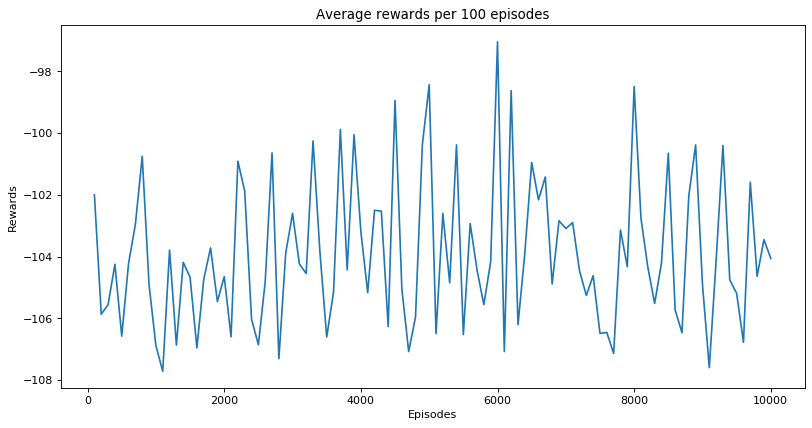

In [14]:
#Plot the average rewards per 100 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 100 episodes')
plt.plot(df['Episodes'], df['Avg_Reward'])

# Calculate Average Rewards per 50 Episodes

In [15]:
sum_rewards = 0
avg_rewards_per_50 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%50) == 0 :
        avg_rewards_per_50.append(sum_rewards/50)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%50==0):
            break
        else:
            avg_rewards_per_50.append(sum_rewards/(i%50))
        
avg_rewards_per_50

len(avg_rewards_per_50)

200

In [16]:
df_50 = pd.DataFrame()
df_50 = df_50.fillna(0)
df_50['Avg_Reward'] = avg_rewards_per_50
df_50['Episodes'] = (df_50.index+1)*50
df_50

,Avg_Reward,Episodes
0,-98.10,50
1,-105.90,100
2,-106.62,150
3,-105.12,200
4,-103.62,250
...,...,...
195,-102.64,9800
196,-99.40,9850
197,-107.50,9900
198,-102.52,9950


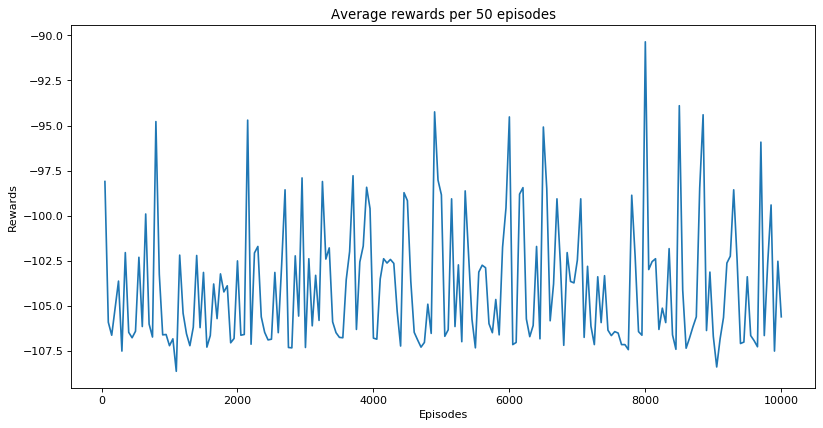

In [17]:
#Plot the average rewards per 50 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 50 episodes')
plt.plot(df_50['Episodes'], df_50['Avg_Reward'])

# Calculate Average Rewards per 10 Episodes

In [18]:
sum_rewards = 0
avg_rewards_per_10 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%10) == 0 :
        avg_rewards_per_10.append(sum_rewards/10)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%10==0):
            break
        else:
            avg_rewards_per_10.append(sum_rewards/(i%10))
        
avg_rewards_per_10

len(avg_rewards_per_10)

1000

In [19]:
df_10 = pd.DataFrame()
df_10 = df_10.fillna(0)
df_10['Avg_Reward'] = avg_rewards_per_10
df_10['Episodes'] = (df_10.index+1)*10
df_10

,Avg_Reward,Episodes
0,-105.2,10
1,-86.5,20
2,-105.7,30
3,-88.1,40
4,-105.0,50
...,...,...
995,-103.5,9960
996,-105.9,9970
997,-106.0,9980
998,-105.1,9990


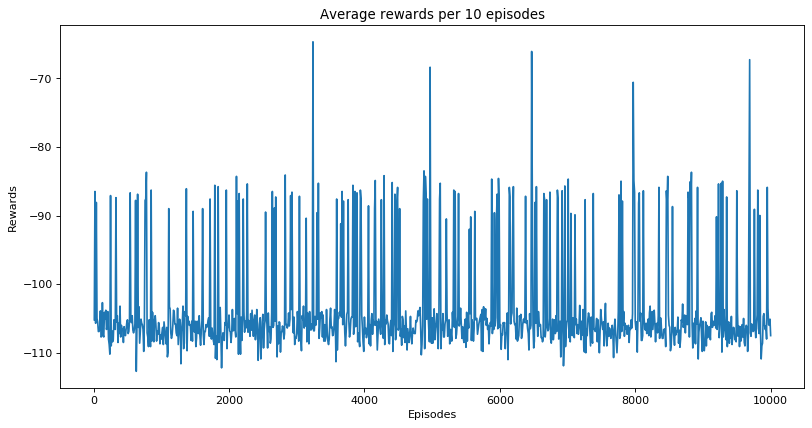

In [20]:
#Plot the average rewards per 10 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 10 episodes')
plt.plot(df_10['Episodes'], df_10['Avg_Reward'])

# Calculate Reward per episode

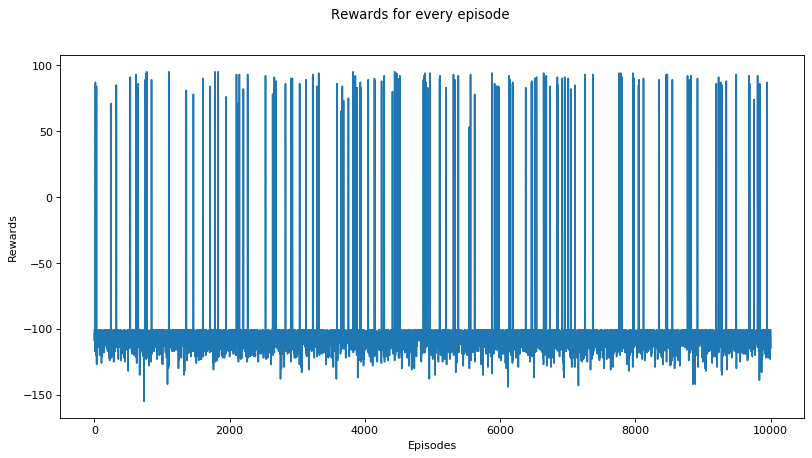

In [21]:
#%% Plot the reward for every episode
reward_per_episode = pd.DataFrame(np.asarray(episodes_rewards_list)) 
reward_per_episode['episodes'] = reward_per_episode.index
reward_per_episode.columns = ['total_reward', 'episodes']


plt.figure(figsize=(12, 6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.suptitle('Rewards for every episode')
plt.plot(reward_per_episode['episodes'], reward_per_episode['total_reward'])